In [153]:
import numpy as np
import pandas as pd
from scipy import signal
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

from statsforecast.models import HistoricAverage
from statsforecast.models import Naive
from statsforecast.models import SeasonalNaive
from statsforecast.models import RandomWalkWithDrift
from statsmodels.tsa.exponential_smoothing.ets import ETSModel
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, root_mean_squared_error

from statsmodels.tsa.statespace.sarimax import SARIMAX
from pmdarima.arima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.stats.stattools import durbin_watson

import warnings
warnings.filterwarnings("ignore")

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import calplot
import matplotlib.cm as cm
from pandas.plotting import lag_plot

# **Weather Forecasting**

**Brief description of the dataset**\
This dataset provides data on weather from 1st January 2009 to 31st December 2016. This dataset contains 14 different features such as air temperature, atmospheric pressure, and humidity, collected every ten minutes.

**Project steps**\
The main aim of this project is to perform weather forecasting for the period January-December 2016.\
Following what we have seen during the lessons, a comprehensive pipeline should be devised, including:
1. Loading, converting and cleaning of the data (note: aggregate the data in order to have weekly frequency).
Divide your dataset into training and testing;
2. Exploring the dataset with descriptive statistics and frequency analysis. Use appropriate graphs to visualise
the data at hand;
3. Describing the time series patterns (visually and numerically);
4. Focusing on temperature (degC, dependent variable), build the most appropriate models to forecast the
data for the specified period. Evaluate the model performance using different metrics. Visualise the results with appropriate graphs.

For the different steps, comment on the main results and any relevant observation/finding you have noticed.

## **Point 1**
Loading, converting and cleaning of the data (note: aggregate the data in order to have weekly frequency).
Divide your dataset into training and testing.

### Load the data

In [154]:
weather_df = pd.read_csv('Weather_ts.csv', sep=',', parse_dates=['Date Time'],  dayfirst=True, index_col='Date Time')
weather_df

,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
Date Time,,,,,,,,,,,,,,
2009-01-01 00:10:00,996.52,-8.02,265.40,-8.90,93.30,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3
2009-01-01 00:20:00,996.57,-8.41,265.01,-9.28,93.40,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.1
2009-01-01 00:30:00,996.53,-8.51,264.91,-9.31,93.90,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.6
2009-01-01 00:40:00,996.51,-8.31,265.12,-9.07,94.20,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.0
2009-01-01 00:50:00,996.51,-8.27,265.15,-9.04,94.10,3.27,3.08,0.19,1.92,3.09,1309.00,0.32,0.63,214.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 23:10:00,1000.11,-3.93,269.23,-8.09,72.60,4.56,3.31,1.25,2.06,3.31,1292.41,0.56,1.00,202.6
2016-12-31 23:20:00,1000.07,-4.05,269.10,-8.13,73.10,4.52,3.30,1.22,2.06,3.30,1292.98,0.67,1.52,240.0
2016-12-31 23:30:00,999.93,-3.35,269.81,-8.06,69.71,4.77,3.32,1.44,2.07,3.32,1289.44,1.14,1.92,234.3


The columns are:
1.	Date Time		- Date-time reference 
2.	p (mbar)		- Pressure used to quantify internal pressure (in millibars) 
3.	T (degC)		- Temperature in Celsius
4.	Tpot (K)	    - Temperature in Kelvin
5.	Tdew (degC)		- Temperature in Celsius relative to humidity
6.	rh (%)		    - Relative Humidity 
7.	VPmax (mbar)	- Saturation vapor pressure
8.	VPact (mbar)	- Vapor pressure
9.	VPdef (mbar)	- Vapor pressure deficit 
10.	sh (g/kg)		- Specific humidity
11.	H2OC (mmol/mol)	- Water vapor concentration
12.	rho (g/m**3)	- Airtight 
13.	wv (m/s)		- Wind speed
14.	max. wv (m/s)	- Maximum wind speed
15.	wd (deg)		- Wind direction in degrees

### Study and clean the data

In [155]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 420550 entries, 2009-01-01 00:10:00 to 2016-12-31 23:50:00
Data columns (total 14 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   p (mbar)         420550 non-null  float64
 1   T (degC)         420550 non-null  float64
 2   Tpot (K)         420550 non-null  float64
 3   Tdew (degC)      420550 non-null  float64
 4   rh (%)           420550 non-null  float64
 5   VPmax (mbar)     420550 non-null  float64
 6   VPact (mbar)     420550 non-null  float64
 7   VPdef (mbar)     420550 non-null  float64
 8   sh (g/kg)        420550 non-null  float64
 9   H2OC (mmol/mol)  420550 non-null  float64
 10  rho (g/m**3)     420550 non-null  float64
 11  wv (m/s)         420550 non-null  float64
 12  max. wv (m/s)    420550 non-null  float64
 13  wd (deg)         420550 non-null  float64
dtypes: float64(14)
memory usage: 48.1 MB


In [156]:
print(weather_df.isnull().sum())

p (mbar)           0
T (degC)           0
Tpot (K)           0
Tdew (degC)        0
rh (%)             0
VPmax (mbar)       0
VPact (mbar)       0
VPdef (mbar)       0
sh (g/kg)          0
H2OC (mmol/mol)    0
rho (g/m**3)       0
wv (m/s)           0
max. wv (m/s)      0
wd (deg)           0
dtype: int64


In [157]:
print(weather_df.isna().sum())

p (mbar)           0
T (degC)           0
Tpot (K)           0
Tdew (degC)        0
rh (%)             0
VPmax (mbar)       0
VPact (mbar)       0
VPdef (mbar)       0
sh (g/kg)          0
H2OC (mmol/mol)    0
rho (g/m**3)       0
wv (m/s)           0
max. wv (m/s)      0
wd (deg)           0
dtype: int64


There are no null values in any of the columns, so I don't have to deal with them. All the columns are numeric, so I can use the function .describe() to get some further information about them.

In [158]:
weather_df.describe()

,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
count,420550.000000,420550.000000,420550.000000,420550.000000,420550.000000,420550.000000,420550.000000,420550.000000,420550.000000,420550.000000,420550.000000,420550.000000,420550.000000,420550.000000
mean,989.212751,9.450181,283.492779,4.955886,76.008260,13.576273,9.533771,4.042419,6.022418,9.640238,1216.062557,1.702225,3.056558,174.743714
std,8.358475,8.423346,8.504449,6.730651,16.476195,7.739016,4.184158,4.896855,2.656135,4.235388,39.975064,65.446792,69.017014,86.681794
min,913.600000,-23.010000,250.600000,-25.010000,12.950000,0.950000,0.790000,0.000000,0.500000,0.800000,1059.450000,-9999.000000,-9999.000000,0.000000
25%,984.200000,3.360000,277.430000,0.240000,65.210000,7.780000,6.210000,0.870000,3.920000,6.290000,1187.490000,0.990000,1.760000,124.900000
50%,989.580000,9.420000,283.470000,5.220000,79.300000,11.820000,8.860000,2.190000,5.590000,8.960000,1213.790000,1.760000,2.960000,198.100000
75%,994.720000,15.470000,289.530000,10.070000,89.400000,17.600000,12.350000,5.300000,7.800000,12.490000,1242.770000,2.860000,4.740000,234.100000
max,1015.350000,37.280000,311.340000,23.110000,100.000000,63.770000,28.320000,46.010000,18.130000,28.820000,1393.540000,28.490000,23.500000,360.000000


In [159]:
weather_df.shape

(420550, 14)

In [160]:
for column in weather_df.columns:
    year_stat = weather_df.groupby(weather_df.index.year)[column].describe()
    print(column, year_stat)

p (mbar)              count        mean       std     min     25%      50%     75%  \
Date Time                                                                   
2009       52557.0  987.954039  8.771059  944.58  983.22  989.140  994.26   
2010       52704.0  986.835372  8.231682  952.78  982.01  988.100  992.54   
2011       52560.0  990.806332  7.681367  913.60  985.88  990.690  995.90   
2012       52704.0  989.405777  8.735587  957.03  984.02  989.295  995.01   
2013       52559.0  989.115653  8.105374  961.54  983.98  989.610  994.80   
2014       52647.0  988.216406  6.869515  965.31  983.79  988.180  992.41   
2015       52560.0  991.365497  8.480495  945.64  986.68  991.990  996.99   
2016       52259.0  990.015085  8.836063  956.89  985.09  990.220  995.71   

               max  
Date Time           
2009       1005.71  
2010       1012.47  
2011       1012.03  
2012       1012.84  
2013       1008.94  
2014       1008.41  
2015       1013.94  
2016       1015.35  
T (degC)  

- The **mean** gives a sense of the typical value for each year.
- The **standard deviation** (std) indicates the variability or spread around the mean.
- The **quartiles** (25%, 50% and 75%) provide information about the distribution and skewness of the sales data.
- The **minimum and maximum** (min and max) values give an idea about the range of values.

In [161]:
weather_df.groupby(weather_df.index.year)["T (degC)"].describe()

,count,mean,std,min,25%,50%,75%,max
Date Time,,,,,,,,
2009,52557.0,8.830284,8.475858,-23.01,2.98,9.12,15.08,32.98
2010,52704.0,7.504652,9.510782,-17.87,0.08,8.09,14.18,34.92
2011,52560.0,9.303914,7.997781,-14.68,3.15,9.25,15.33,33.11
2012,52704.0,9.655535,8.851021,-21.04,4.03,9.30,15.96,35.86
2013,52559.0,9.093978,8.617959,-13.51,2.04,9.29,15.18,35.48
2014,52647.0,10.718917,7.269200,-10.02,5.26,10.73,15.82,33.74
2015,52560.0,10.511207,7.794075,-6.48,4.22,10.09,15.66,37.28
2016,52259.0,9.988671,8.228870,-13.93,3.65,9.14,16.34,34.35


### Weekly aggregation of the data

The dataframe has daily frequency, but I aggregate it to have a weekly frequency.

In [162]:
weather_df_weekly = weather_df.resample('W').mean()
weather_df_weekly.head()

,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
Date Time,,,,,,,,,,,,,,
2009-01-04,996.446696,-4.292070,269.146087,-6.185148,87.255409,4.511496,3.918348,0.593009,2.451287,3.934887,1289.293165,1.293252,2.310504,177.589652
2009-01-11,999.146161,-11.057847,262.168393,-13.171438,84.714841,2.831081,2.369058,0.462044,1.477421,2.372718,1327.335734,1.312153,2.256984,158.967391
2009-01-18,991.308760,-1.717867,272.126657,-4.664692,81.310595,5.561796,4.483313,1.078720,2.820536,4.526012,1270.352133,1.879524,2.970417,178.882599
2009-01-25,970.486319,1.151438,276.681220,-1.678264,82.035218,6.752004,5.444335,1.307619,3.499306,5.613720,1230.040417,2.553998,3.973105,188.601022
2009-02-01,990.295337,-2.464573,271.454127,-3.848323,90.406944,5.104276,4.617619,0.486429,2.905952,4.663750,1272.179296,1.981885,3.170645,46.615129


I used the .mean() function to aggregate due to the fact that the dataframe is made up of continuous numerical values, so it makes sense.

In [163]:
weather_df_weekly.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 418 entries, 2009-01-04 to 2017-01-01
Freq: W-SUN
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   p (mbar)         418 non-null    float64
 1   T (degC)         418 non-null    float64
 2   Tpot (K)         418 non-null    float64
 3   Tdew (degC)      418 non-null    float64
 4   rh (%)           418 non-null    float64
 5   VPmax (mbar)     418 non-null    float64
 6   VPact (mbar)     418 non-null    float64
 7   VPdef (mbar)     418 non-null    float64
 8   sh (g/kg)        418 non-null    float64
 9   H2OC (mmol/mol)  418 non-null    float64
 10  rho (g/m**3)     418 non-null    float64
 11  wv (m/s)         418 non-null    float64
 12  max. wv (m/s)    418 non-null    float64
 13  wd (deg)         418 non-null    float64
dtypes: float64(14)
memory usage: 49.0 KB


In [164]:
weather_df_weekly.describe()

,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
count,418.000000,418.000000,418.000000,418.000000,418.000000,418.000000,418.000000,418.000000,418.000000,418.000000,418.000000,418.000000,418.000000,418.000000
mean,989.238368,9.428490,283.468976,4.943220,76.047001,13.557678,9.526417,4.031179,6.017641,9.632617,1216.192035,1.701207,3.054848,174.800532
std,6.217979,7.431565,7.454327,6.135823,8.981430,6.400325,3.770776,3.033723,2.389490,3.811023,34.602324,8.760265,9.746778,35.462175
min,967.816796,-12.640000,259.938155,-15.437232,54.132083,2.419841,1.911012,0.202073,1.180605,1.896250,1151.149742,-176.614435,-194.960387,46.615129
25%,985.893214,3.707639,277.995749,0.534705,69.596037,8.117391,6.436109,1.544459,4.040732,6.480258,1188.048755,1.734730,2.908113,153.013038
50%,989.290461,9.483542,283.648353,5.367331,76.297877,12.371086,9.073214,3.243462,5.703398,9.136746,1212.522202,2.021007,3.398120,182.851230
75%,992.865556,15.301004,289.378093,10.106562,83.067956,17.964365,12.528566,5.945732,7.911840,12.657299,1239.563063,2.411503,4.009271,201.698418
max,1007.889549,24.770526,298.443155,16.751081,95.171131,33.085079,19.144921,16.535179,12.155169,19.398016,1347.082302,4.619732,7.043562,240.663601


### Train and test split

The main aim of this project is to perform weather forecasting for the period January-December 2016, so I split the dataframe accordingly

In [165]:
split = '2016-01-01'
train = weather_df_weekly[weather_df_weekly.index < split]
test = weather_df_weekly[weather_df_weekly.index >= split]

In [166]:
test.tail()

,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
Date Time,,,,,,,,,,,,,,
2016-12-04,999.956121,-0.467679,272.701944,-3.387222,81.552579,6.156409,4.900109,1.256071,3.058046,4.906677,1275.453720,1.437123,2.741706,190.730853
2016-12-11,1000.134891,1.667212,274.823413,-1.334246,81.225665,7.381587,5.828373,1.553492,3.637927,5.834554,1265.589107,1.437609,2.601359,182.925089
2016-12-18,1002.300288,2.645923,275.628373,1.012192,89.163800,7.507450,6.704841,0.802490,4.174643,6.694365,1262.940823,1.418085,2.399752,185.361032
2016-12-25,1000.907817,1.969593,275.060228,-0.343909,85.042927,7.248353,6.080327,1.168135,3.788710,6.076379,1264.651042,1.912788,3.262143,184.388889
2017-01-01,1007.889549,2.689560,275.233866,-0.238472,81.632986,7.702361,6.203750,1.498484,3.838715,6.156250,1270.206458,1.972280,3.632130,222.820949


The test dataframe has one row with value for the year 2017, I keep it anyway cause it gives me information about the last week of 2016.

## Point 2
Exploring the dataset with descriptive statistics and frequency analysis. Use appropriate graphs to visualise
the data at hand.

Data visualization is an essential task in all the different projects/domains, as it provides a clear idea of what the information means by reporting it visually through maps or graphs.

### Line plots

In [167]:
columns = list(weather_df)

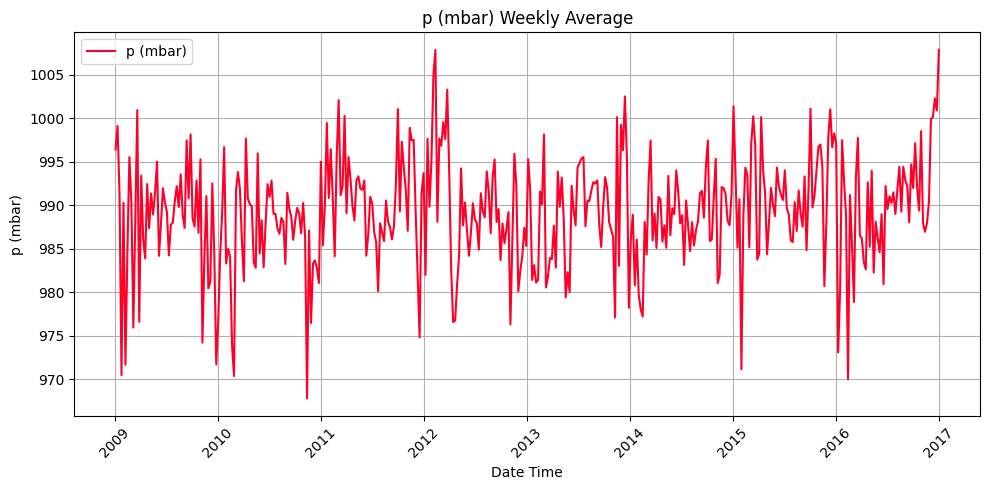

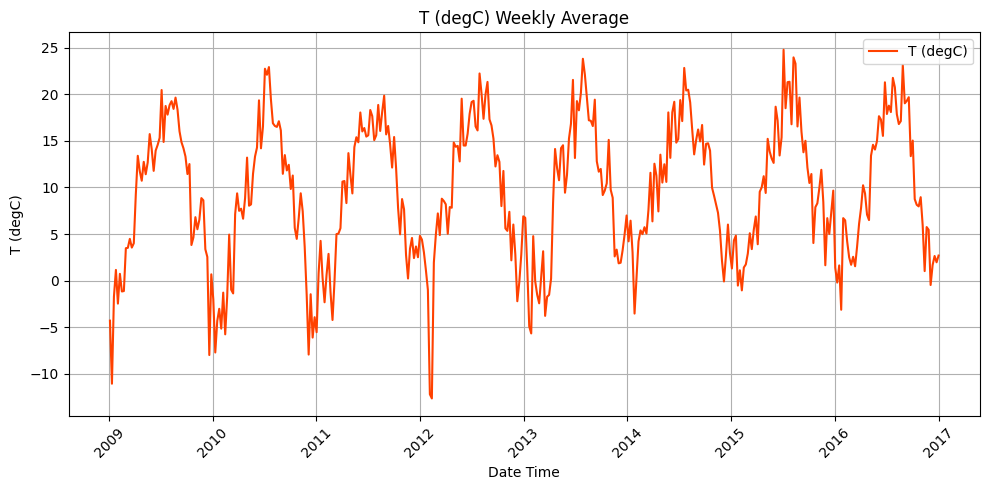

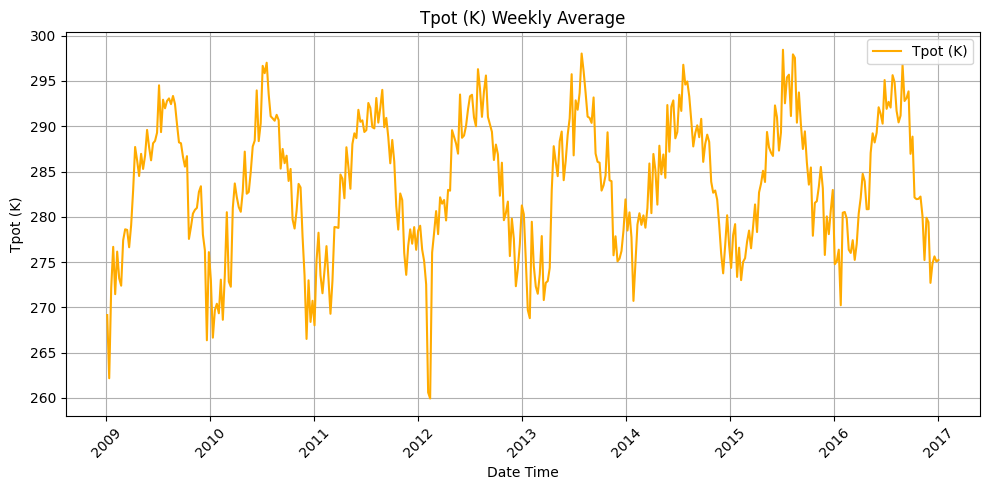

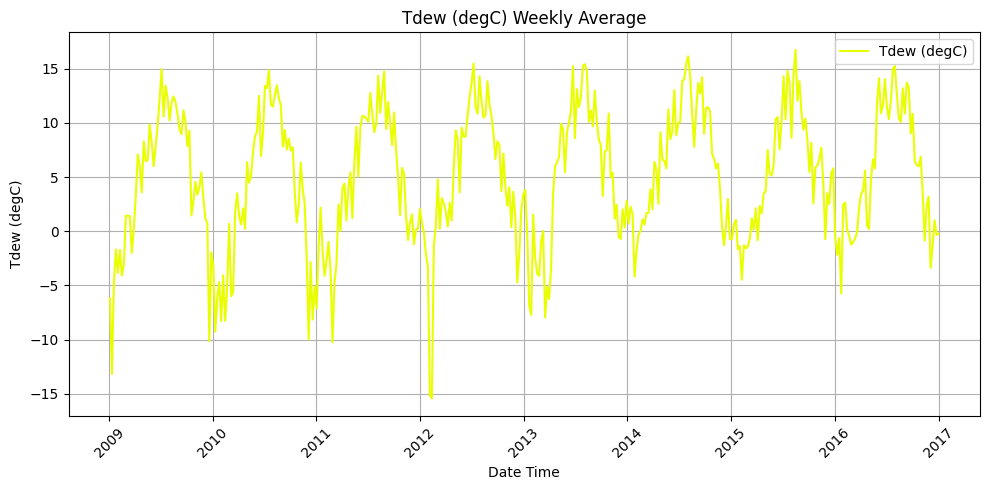

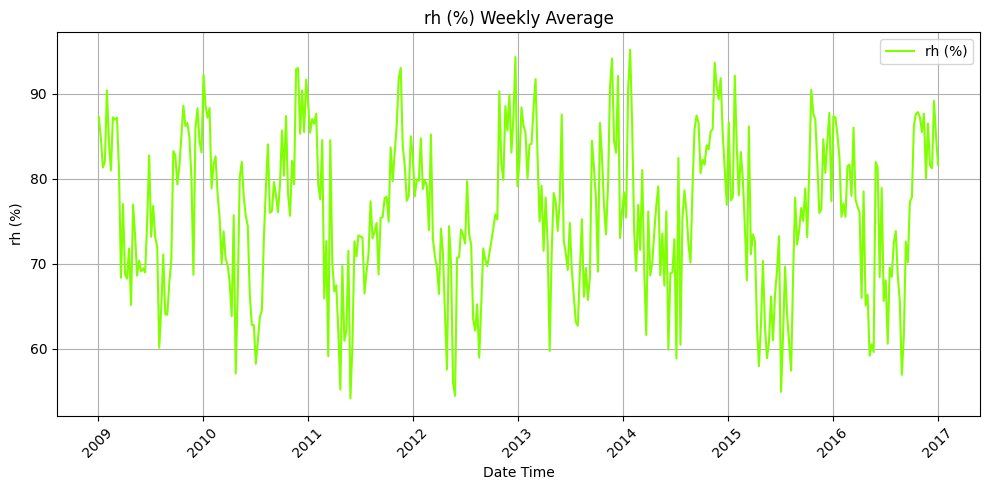

...

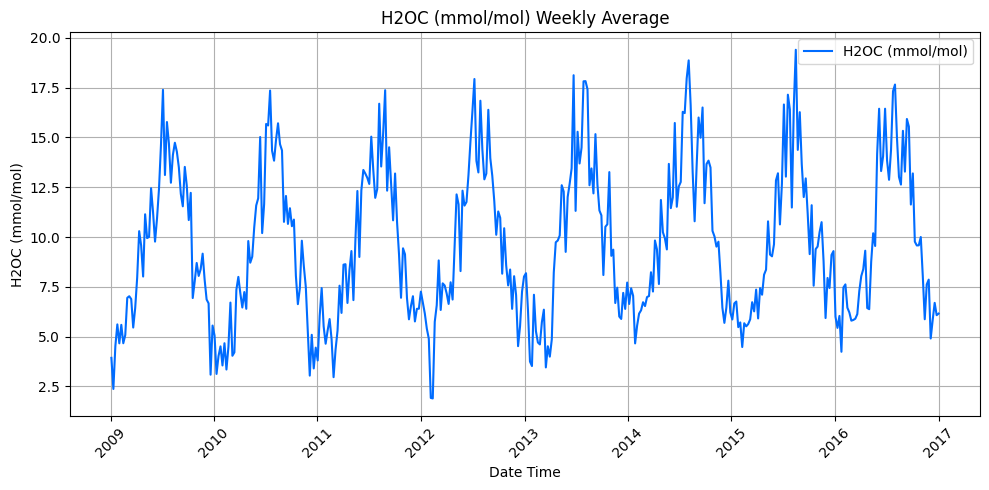

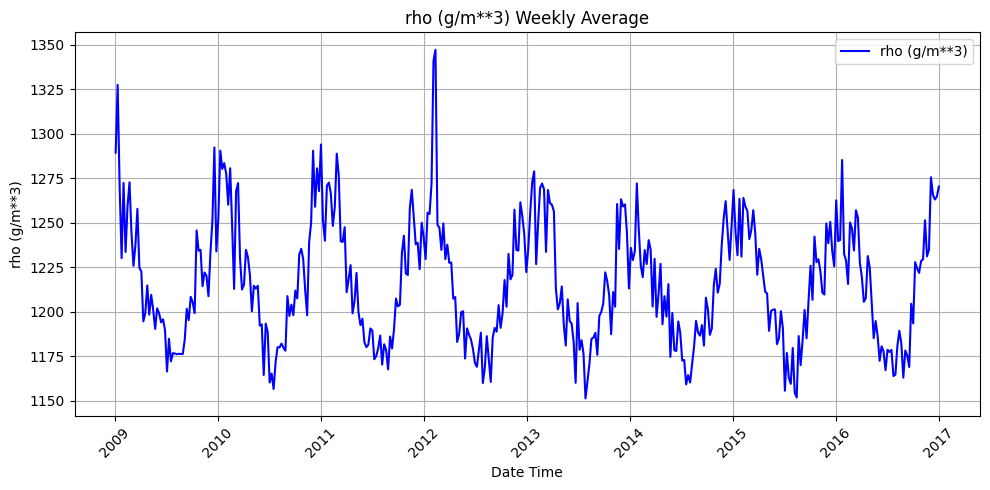

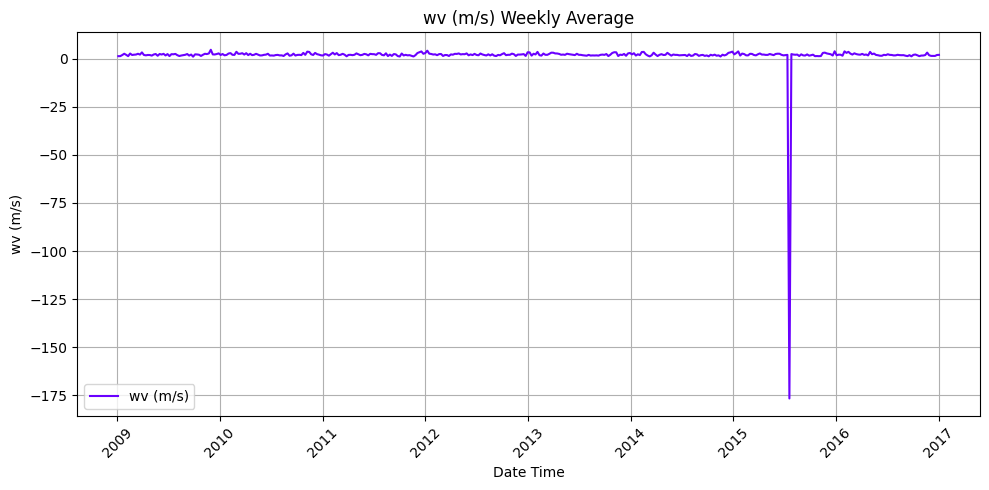

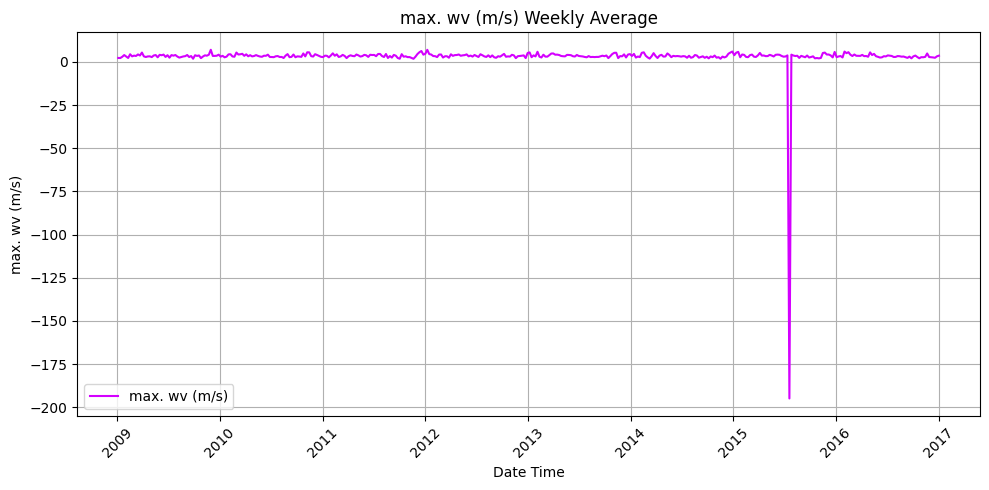

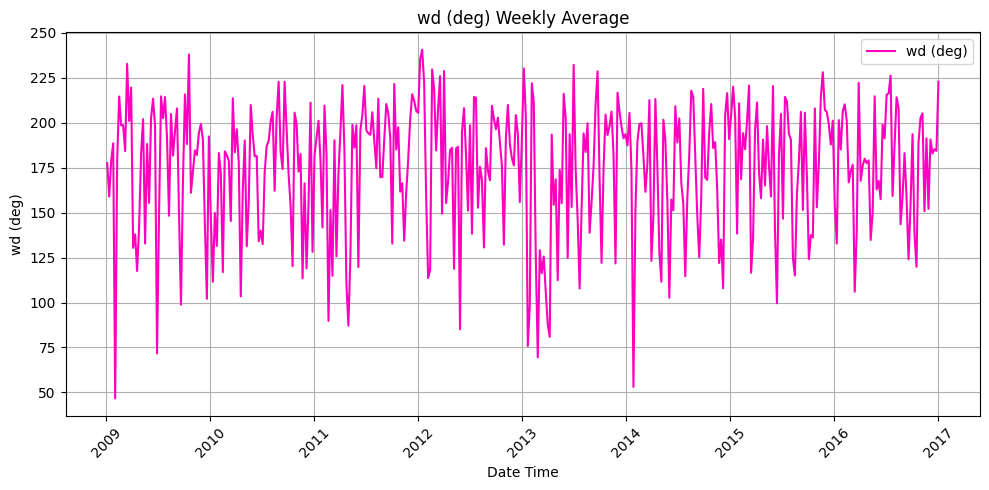

In [168]:
cmap = cm.get_cmap('gist_rainbow', len(columns))

for colore, column in enumerate(columns):
    plt.figure(figsize=(10, 5))
    plt.plot(weather_df_weekly.index, weather_df_weekly[column], label=column, color=cmap(colore))
    plt.title(f'{column} Weekly Average')
    plt.xlabel('Date Time')
    plt.ylabel(column)
    plt.grid(True)
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [169]:
weather_df.columns

Index(['p (mbar)', 'T (degC)', 'Tpot (K)', 'Tdew (degC)', 'rh (%)',
       'VPmax (mbar)', 'VPact (mbar)', 'VPdef (mbar)', 'sh (g/kg)',
       'H2OC (mmol/mol)', 'rho (g/m**3)', 'wv (m/s)', 'max. wv (m/s)',
       'wd (deg)'],
      dtype='object')

By looking at the graphs, we can spot seasonal patterns for most of the columns, which is expected.

It's also clear that the column 'wv (m/s)' and 'max. wv (m/s)' both have an outlier in the year 2015.

In [170]:
print(weather_df_weekly.loc['2015', 'wv (m/s)'].min())
print(weather_df_weekly.loc['2015', 'max. wv (m/s)'].min())

-176.61443452380954
-194.96038690476192


The values are so significantly different from the rest of the data that we can assume they are a mistake.

### Correlation
It is common to compute correlation coefficients to measure the strength of the linear relationship between two variables.

In [171]:
correlation_matrix = weather_df_weekly.corr()
correlation_matrix

,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
p (mbar),1.000000,0.027832,-0.039525,0.011353,-0.053637,0.044319,0.022568,0.065444,0.010454,0.010443,0.201229,-0.022969,-0.028693,-0.074275
T (degC),0.027832,1.000000,0.997730,0.969344,-0.626309,0.970678,0.950386,0.866563,0.949749,0.950039,-0.973137,-0.090724,-0.089489,0.121678
Tpot (K),-0.039525,0.997730,1.000000,0.968185,-0.622519,0.967341,0.948549,0.861806,0.948736,0.949026,-0.986291,-0.089152,-0.087527,0.126894
Tdew (degC),0.011353,0.969344,0.968185,1.000000,-0.417848,0.925806,0.976945,0.738885,0.976503,0.976813,-0.951531,-0.093907,-0.095045,0.126692
rh (%),-0.053637,-0.626309,-0.622519,-0.417848,1.000000,-0.642372,-0.416997,-0.836910,-0.416256,-0.416378,0.587667,0.029708,0.019868,-0.097112
VPmax (mbar),0.044319,0.970678,0.967341,0.925806,-0.642372,1.000000,0.952574,0.925707,0.952087,0.952062,-0.934818,-0.112540,-0.112645,0.045504
VPact (mbar),0.022568,0.950386,0.948549,0.976945,-0.416997,0.952574,1.000000,0.766704,0.999912,0.999914,-0.926139,-0.113308,-0.115588,0.068541
VPdef (mbar),0.065444,0.866563,0.861806,0.738885,-0.836910,0.925707,0.766704,1.000000,0.765784,0.765731,-0.821049,-0.096596,-0.093984,0.010812
sh (g/kg),0.010454,0.949749,0.948736,0.976503,-0.416256,0.952087,0.999912,0.765784,1.000000,0.999999,-0.928228,-0.113210,-0.115414,0.069610
H2OC (mmol/mol),0.010443,0.950039,0.949026,0.976813,-0.416378,0.952062,0.999914,0.765731,0.999999,1.000000,-0.928541,-0.113066,-0.115265,0.070004


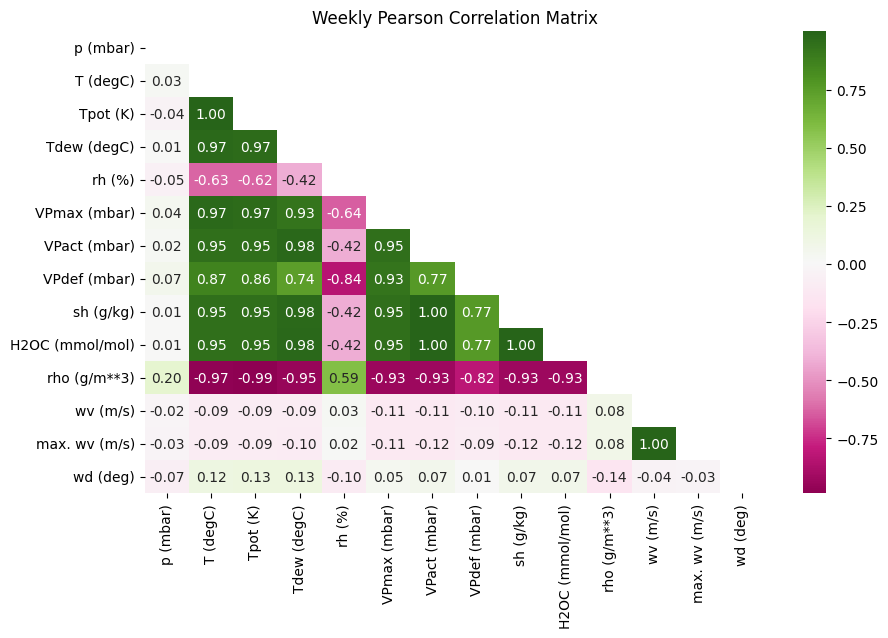

In [172]:
plt.figure(figsize=(10, 6))
pearson_corr = weather_df_weekly.corr(method='pearson') 
matrix = np.triu(pearson_corr)
sns.heatmap(pearson_corr, annot=True, cmap='PiYG', fmt=".2f", cbar=True,mask=matrix)
plt.title('Weekly Pearson Correlation Matrix')
plt.show()

As expected, the temperature columns are highly correlated, same for the columns for humidity and water vapor concentration. It makes sense that the columns for meteorological are correlated with each others, excluding the ones about the wind (though, there is of course an high correlation between wind speed and maximum wind speed.)

### Heatmap

A heatmap is a graphical representation of a given data/measure as a matrix, where each value is represented as a color. They can be useful to easily visualise how the distribution of a value evolves over time, as well as to visualise correlation (and covariance) values in a given dataset. For example, we can explore whether collinear features are present in a dataset or if a set of time series is correlated (or not).

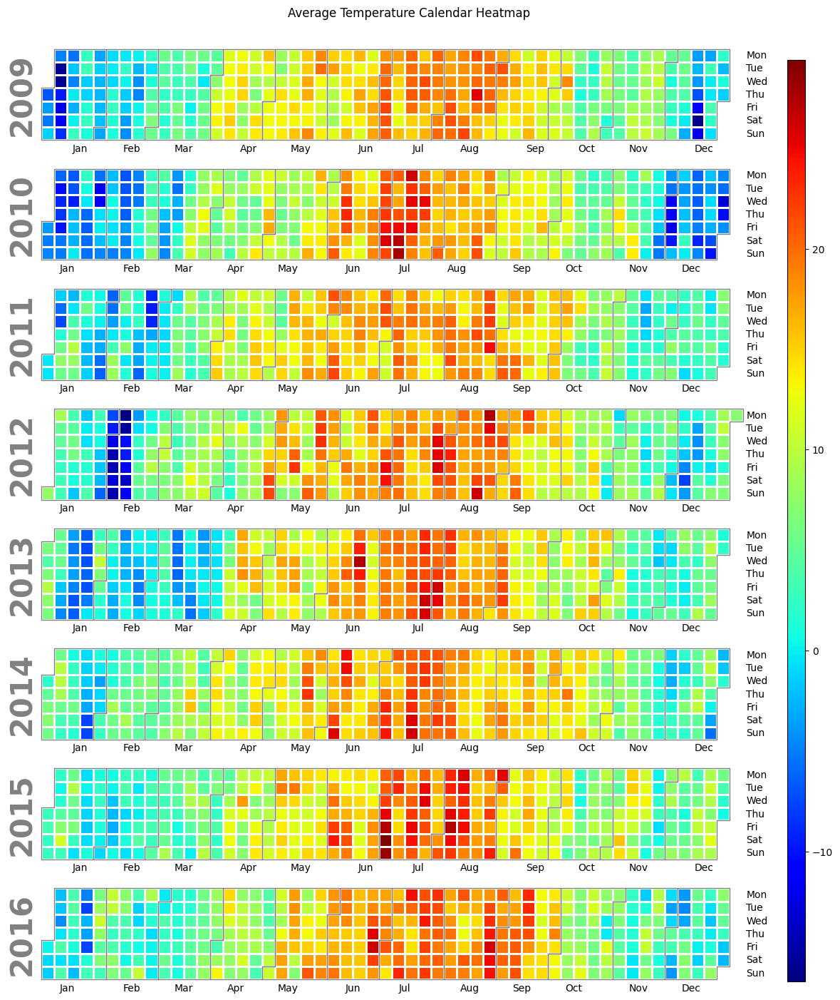

In [173]:
weather_df_daily = weather_df.resample('D').mean()

calplot.calplot(
    weather_df_daily['T (degC)'], 
    cmap='jet', 
    colorbar=True, 
    suptitle="Average Temperature Calendar Heatmap",
    yearlabel_kws={'fontname':'sans-serif'})
plt.show()

I wanted to use a july.heatmap(), but I had some deprecation issues with Matplotlib.

### Box plots
Boxplots show the distribution of numeric data values. The box shows the quartiles of the dataset (Q1,Q3) while the whiskers extend to show the rest of the distribution (min, max), except for points that are determined to be outliers using the IQR (interquartile range) approach

In [174]:
# Add one colum to indicate the year (DatetimeIndex -> PeriodIndex)
weather_df_weekly_period = weather_df_weekly.copy()
weather_df_weekly_period['Period_Y'] = weather_df_weekly_period.index.to_period('Y')
weather_df_weekly_period.head(5)

,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg),Period_Y
Date Time,,,,,,,,,,,,,,,
2009-01-04,996.446696,-4.292070,269.146087,-6.185148,87.255409,4.511496,3.918348,0.593009,2.451287,3.934887,1289.293165,1.293252,2.310504,177.589652,2009
2009-01-11,999.146161,-11.057847,262.168393,-13.171438,84.714841,2.831081,2.369058,0.462044,1.477421,2.372718,1327.335734,1.312153,2.256984,158.967391,2009
2009-01-18,991.308760,-1.717867,272.126657,-4.664692,81.310595,5.561796,4.483313,1.078720,2.820536,4.526012,1270.352133,1.879524,2.970417,178.882599,2009
2009-01-25,970.486319,1.151438,276.681220,-1.678264,82.035218,6.752004,5.444335,1.307619,3.499306,5.613720,1230.040417,2.553998,3.973105,188.601022,2009
2009-02-01,990.295337,-2.464573,271.454127,-3.848323,90.406944,5.104276,4.617619,0.486429,2.905952,4.663750,1272.179296,1.981885,3.170645,46.615129,2009


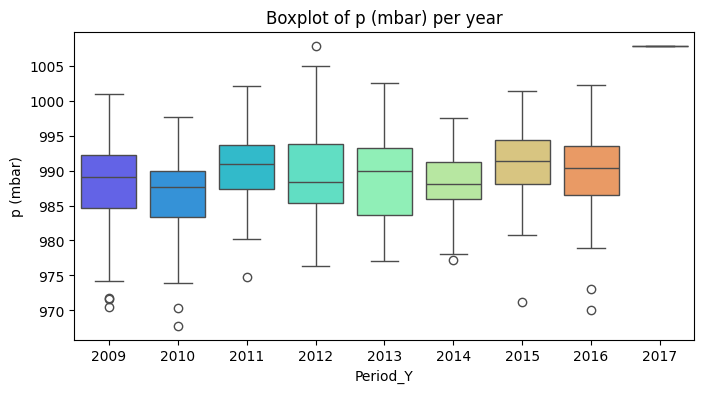

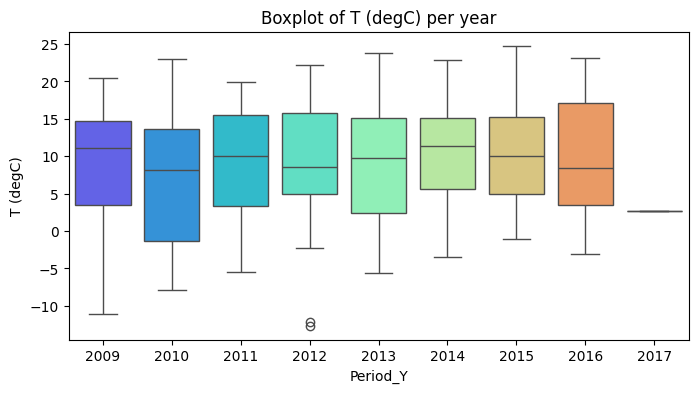

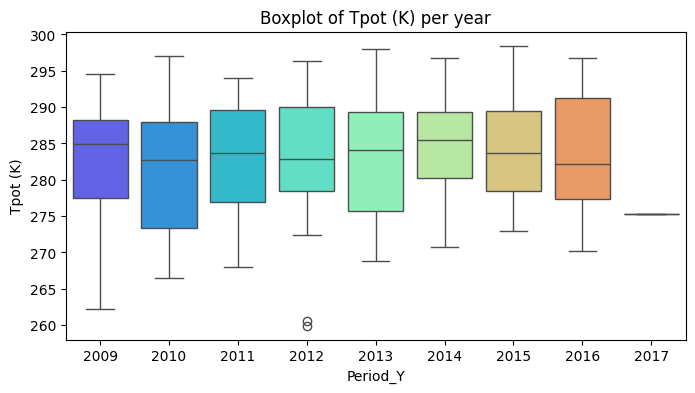

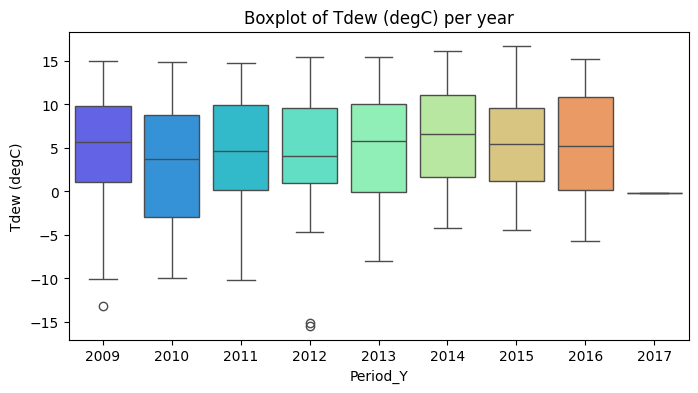

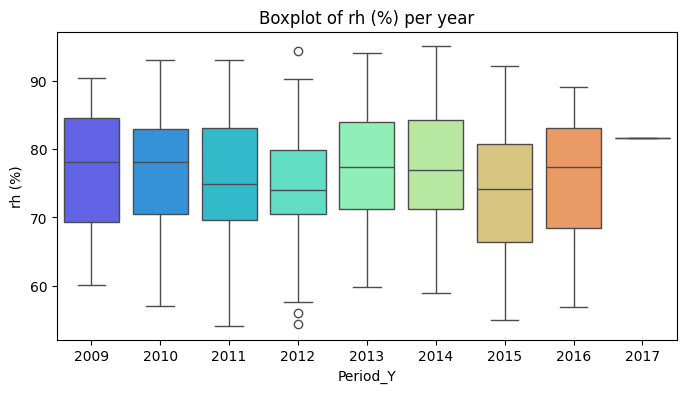

...

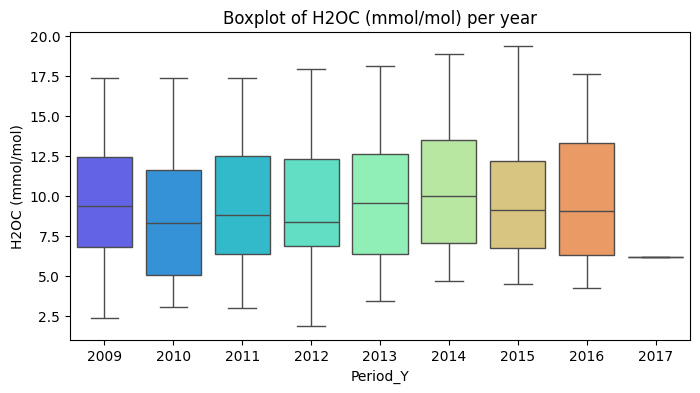

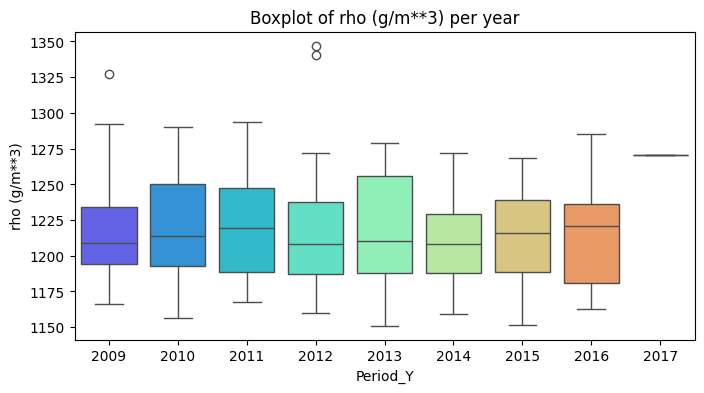

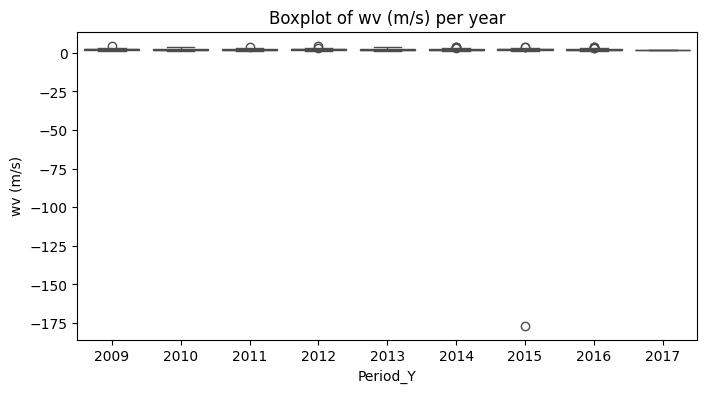

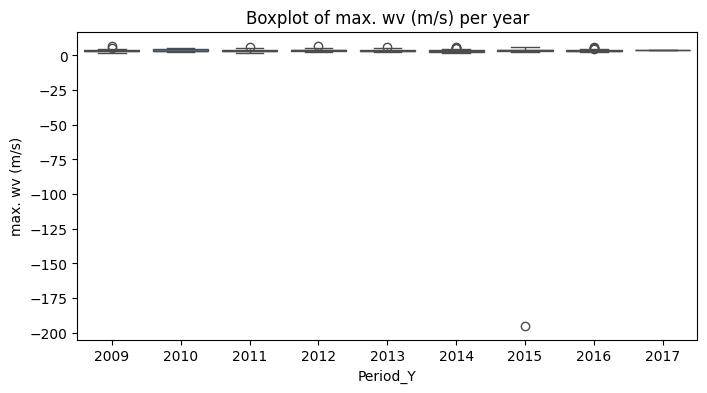

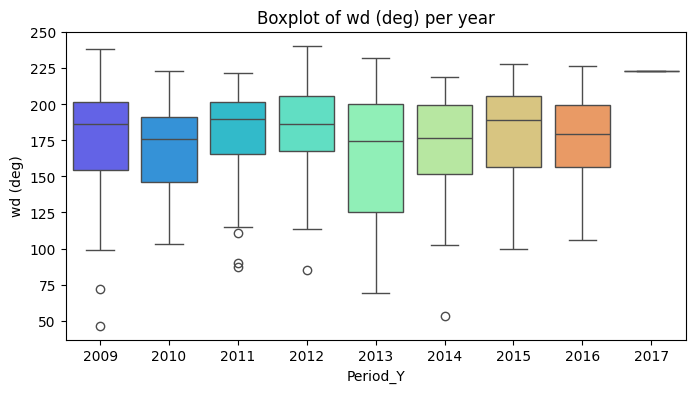

In [175]:
for column in weather_df_weekly_period.select_dtypes(include=[np.number]).columns:
    plt.figure(figsize=(8,4))
    plt.title('Boxplot of ' + column + ' per year')
    sns.boxplot(x = weather_df_weekly_period['Period_Y'], y = weather_df_weekly_period[column], palette='rainbow')
    plt.show()

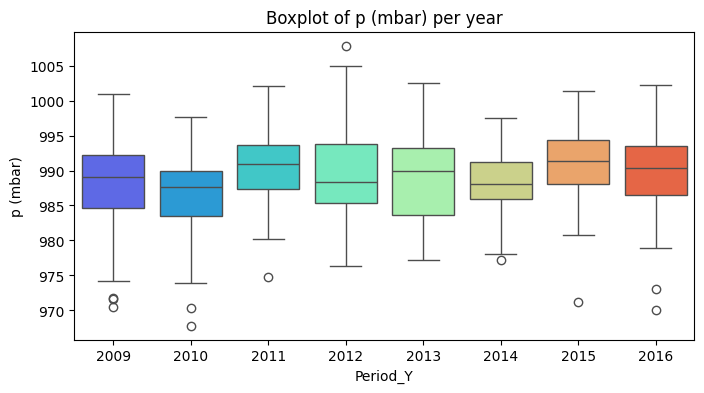

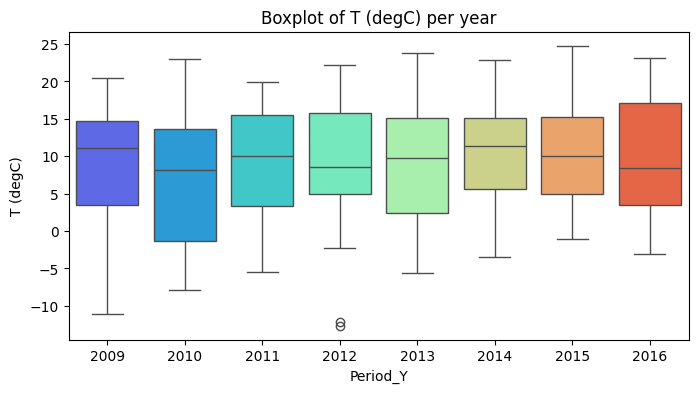

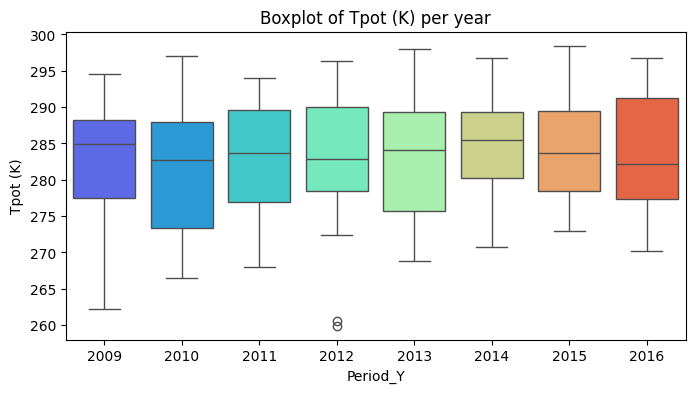

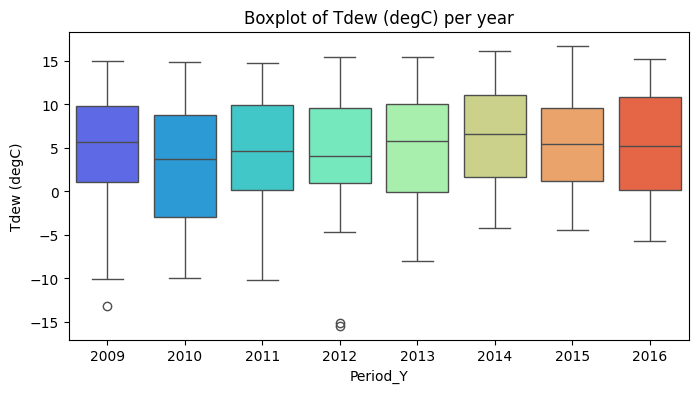

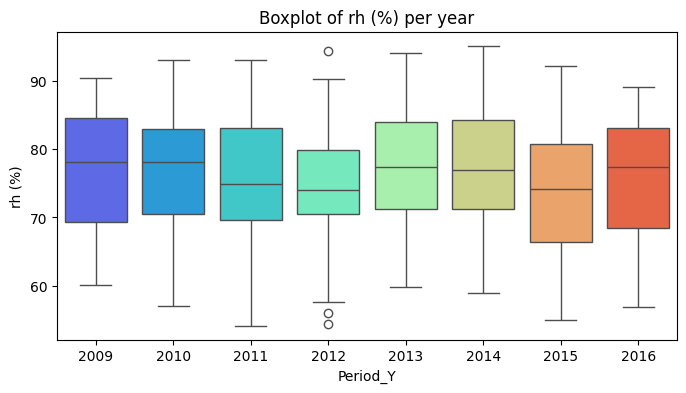

...

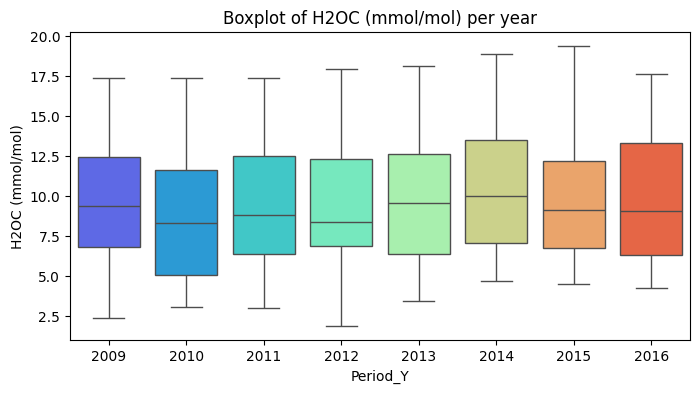

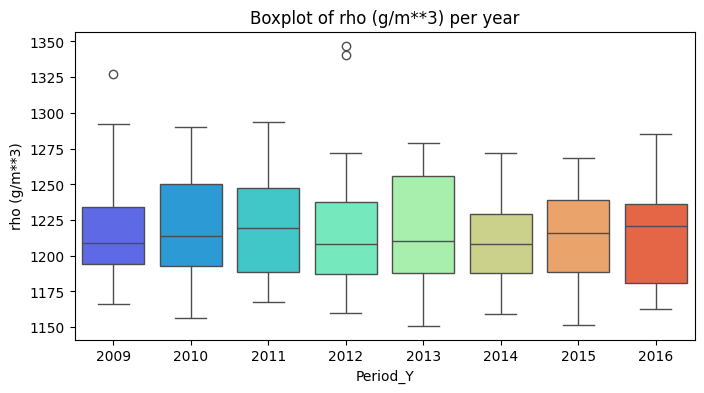

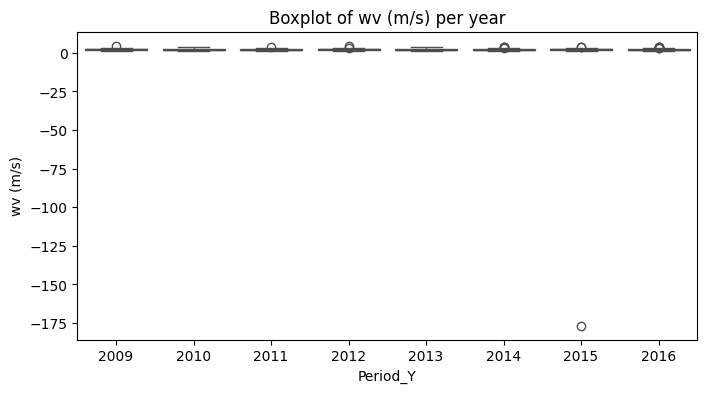

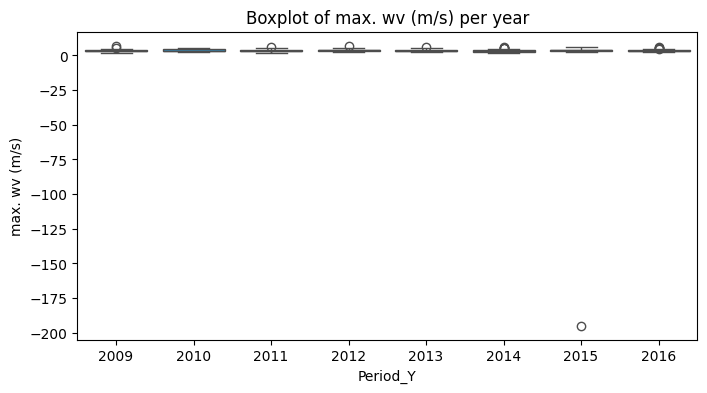

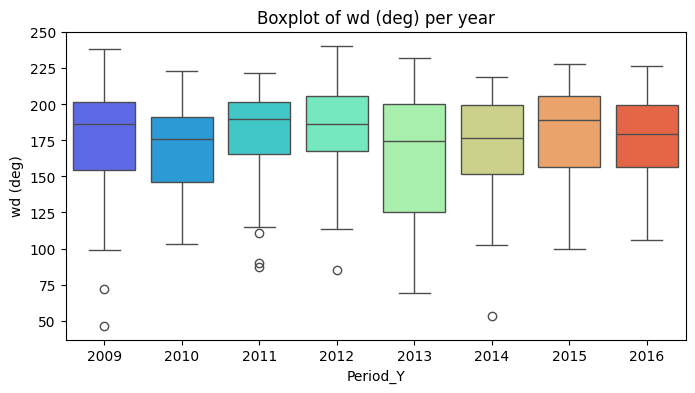

In [176]:
weather_df_weekly_period = weather_df_weekly_period[weather_df_weekly_period['Period_Y'] != '2017']

for column in weather_df_weekly_period.select_dtypes(include=[np.number]).columns:
    plt.figure(figsize=(8,4))
    plt.title('Boxplot of ' + column + ' per year')
    sns.boxplot(x = weather_df_weekly_period['Period_Y'], y = weather_df_weekly_period[column], palette='rainbow')
    plt.show()

The Box plots shows that several columns have some outliers, but the most significative ones are in 'wv (m/s)' and 'max. wv (m/s)' (as seen in the Line plots).

Box plot by month for the year 2013.

In [177]:
# Boxplot representing the monthly data for a specific year (2016)
weather_df_2016 = weather_df_weekly_period.loc[weather_df_weekly_period['Period_Y'] == '2016']
weather_df_2016['Period_MY'] = weather_df_2016.index.to_period('M')

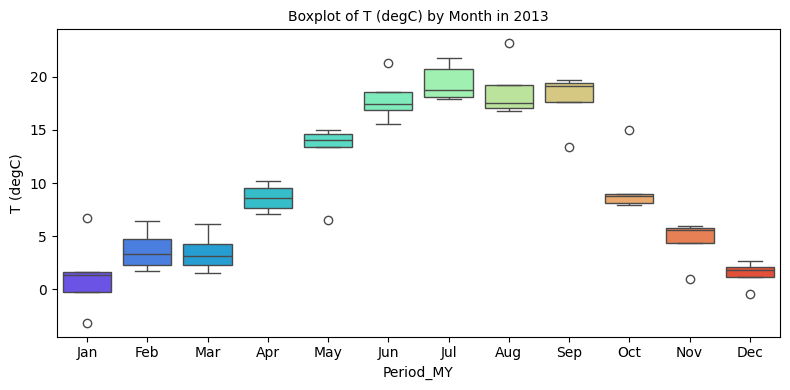

In [178]:
# For ease of visualization, we can then use dt.strftime() to convert to Index using specified date_format. It returns an Index of formatted strings.
plt.figure(figsize=(8,4))
sns.boxplot(x=weather_df_2016['Period_MY'].dt.strftime('%b'),y = weather_df_2016['T (degC)'], palette='rainbow')
plt.title('Boxplot of T (degC) by Month in 2013', fontsize=10)
plt.tight_layout()
plt.show()

### Violin plots

Violin plots are similar to boxplots, except that they also show the probability density of the data at different values. As in the standard boxplots, they include a marker for the median of the data and a box indicating the interquartile range. Overlaid is a kernel density estimation. They are both used to compare a variable distribution (or sample distribution) across different "categories".

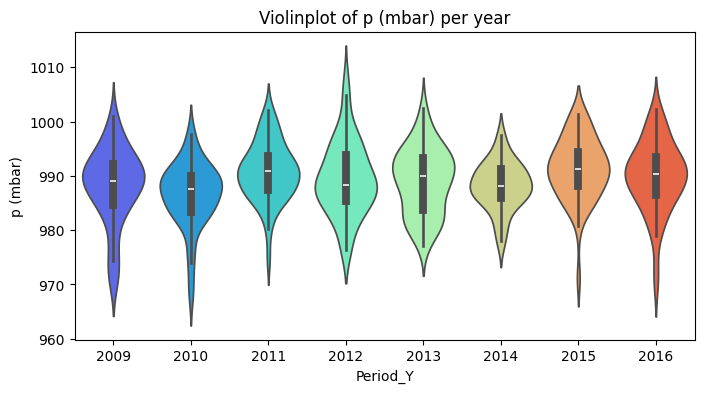

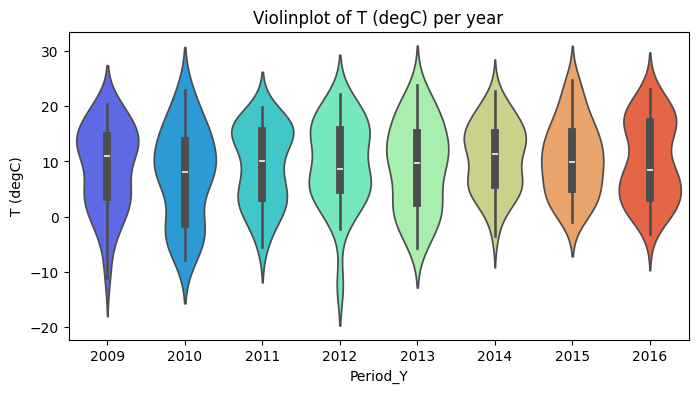

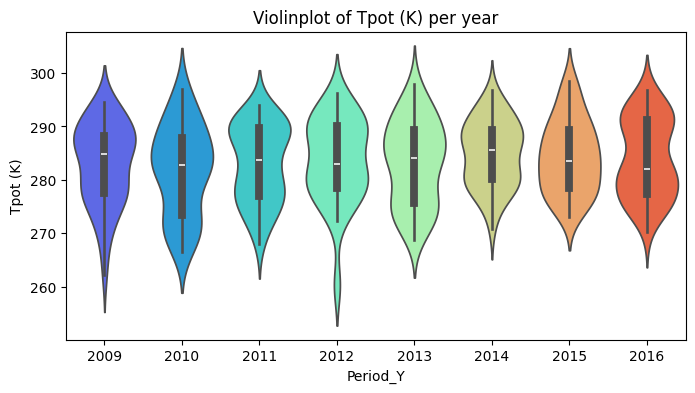

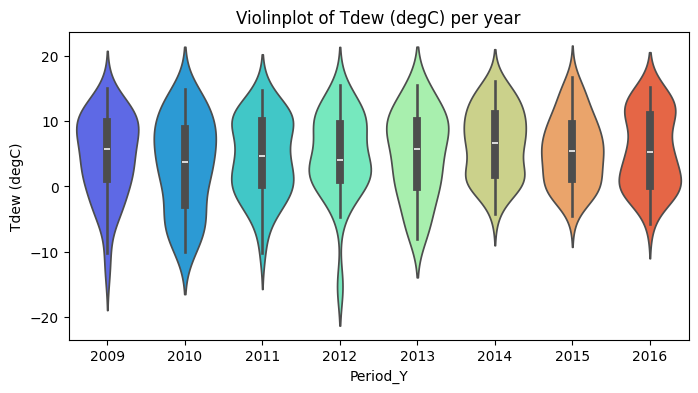

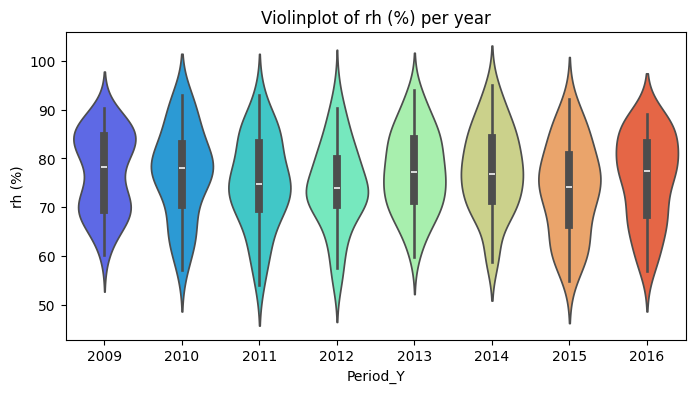

...

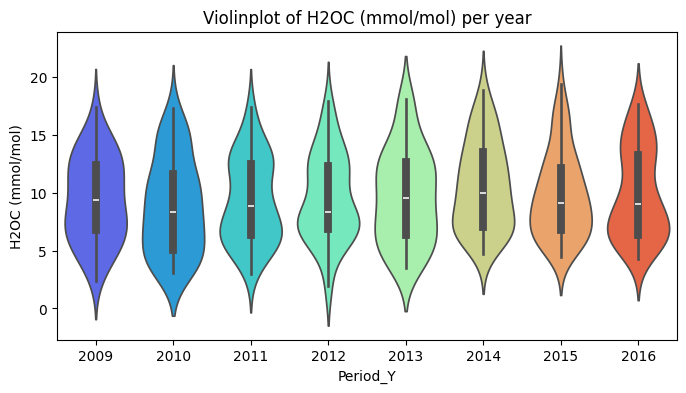

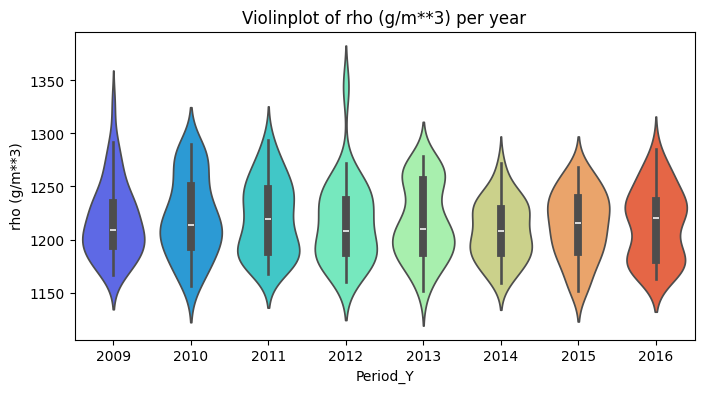

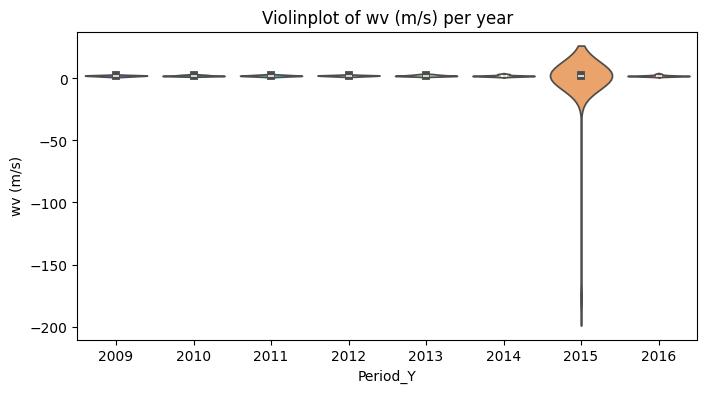

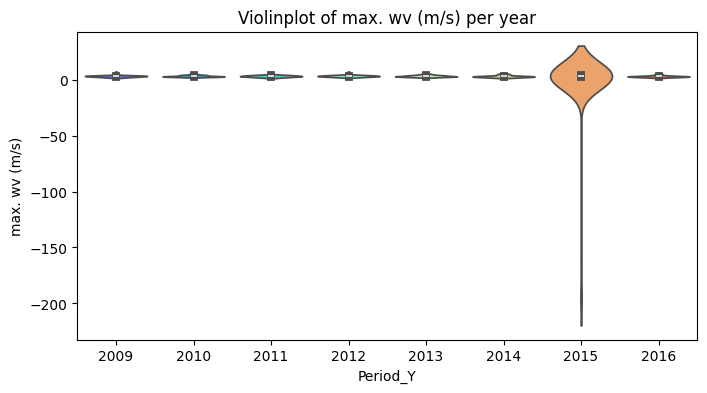

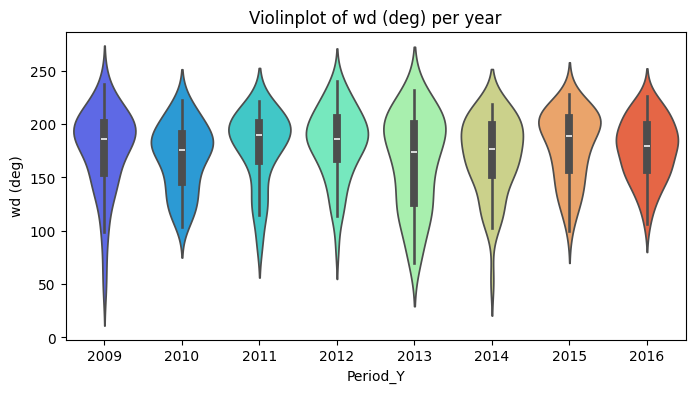

In [179]:
for column in weather_df_weekly_period.select_dtypes(include=[np.number]).columns:
    plt.figure(figsize=(8,4))
    plt.title('Violinplot of ' + column + ' per year')
    sns.violinplot(x = weather_df_weekly_period['Period_Y'], y = weather_df_weekly_period[column], palette='rainbow')
    plt.show()

Violin plot by month for the year 2013.

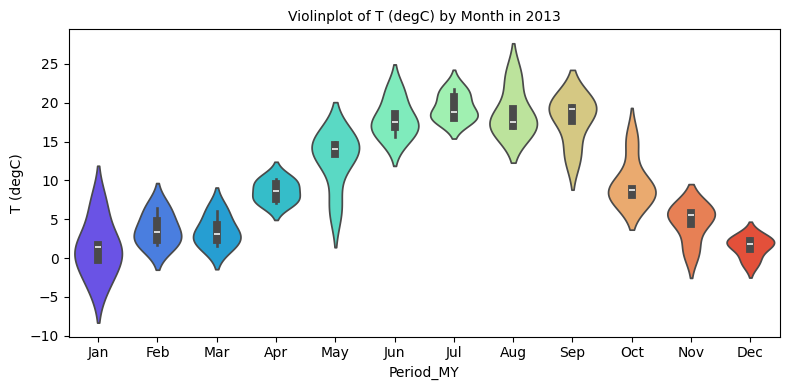

In [180]:
# For ease of visualization, we can then use dt.strftime() to convert to Index using specified date_format. It returns an Index of formatted strings.
plt.figure(figsize=(8,4))
sns.violinplot(x=weather_df_2016['Period_MY'].dt.strftime('%b'),y = weather_df_2016['T (degC)'], palette='rainbow')
plt.title('Violinplot of T (degC) by Month in 2013', fontsize=10)
plt.tight_layout()
plt.show()

### Histograms

Simple histograms are generally a good and simple starting point for understanding a dataset, allowing to show the frequency of numerical data.

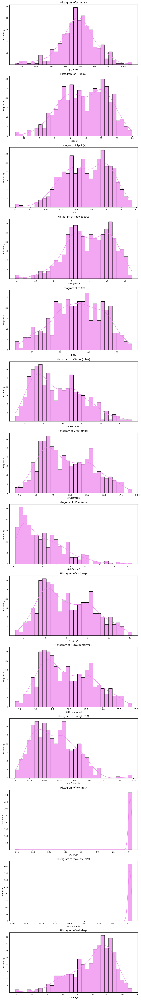

In [181]:
fig, axes = plt.subplots(len(weather_df_weekly.columns), 1, figsize=(10, len(weather_df_weekly.columns) * 5))
for i, column in enumerate(weather_df_weekly.columns):
    ax = axes[i] if len(weather_df_weekly.columns) > 1 else axes
    sns.histplot(data=weather_df_weekly, x=column, bins=30, kde=True, color='violet', edgecolor='black', alpha=0.7, ax=ax)
    ax.set_title(f'Histogram of {column}')
    ax.set_xlabel(column)
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

### Outliers

In [182]:
print(weather_df_weekly.loc['2015', 'wv (m/s)'].min())
print(weather_df_weekly.loc['2015', 'max. wv (m/s)'].min())

-176.61443452380954
-194.96038690476192


**IQR**

1. Calculate the 3rd quartile and the 1st quartile.
2. Compute the IQR as the difference between 3rd quartile and the 1st quartile. 
3. Find the upper and lower limits.

In [183]:
for column in weather_df_weekly.columns:
    Q1_py = np.quantile(weather_df_weekly[column],0.25)
    Q3_py = np.quantile(weather_df_weekly[column],0.75)
    IQR = Q3_py-Q1_py
    Lower = Q1_py - 1.5*IQR
    Upper = Q3_py + 1.5*IQR

    T = []
    for i in weather_df_weekly[column]:
        exp1 = i < Lower
        exp2 = i > Upper
        if exp1 or exp2:
            temp = int(i)
            T.append(temp)
    print('Column ', column, 'has the outliers', T)

Column  p (mbar) has the outliers [970, 971, 974, 971, 973, 970, 967, 974, 1004, 1007, 971, 973, 970, 1007]
Column  T (degC) has the outliers []
Column  Tpot (K) has the outliers [260, 259]
Column  Tdew (degC) has the outliers [-15, -15]
Column  rh (%) has the outliers []
Column  VPmax (mbar) has the outliers [33]
Column  VPact (mbar) has the outliers []
Column  VPdef (mbar) has the outliers [13, 12, 13, 12, 16, 14, 14]
Column  sh (g/kg) has the outliers []
Column  H2OC (mmol/mol) has the outliers []
Column  rho (g/m**3) has the outliers [1327, 1340, 1347]
Column  wv (m/s) has the outliers [4, 3, 3, 3, 3, 4, 3, 3, 3, 3, 3, -176, 3, 3, 3, 3]
Column  max. wv (m/s) has the outliers [7, 6, 7, 5, 6, 5, -194, 5, 5]
Column  wd (deg) has the outliers [46, 71, 75, 69, 53]


**Standard deviation**
1. Calculate the average and standard deviation of the data set.
2. Determine if any results are greater than +/- 3 times the standard deviation. 
3. Find the upper and lower limits.

In [184]:
for column in weather_df_weekly.columns:
    mean_value = np.mean(weather_df_weekly[column])
    sd_value = np.std(weather_df_weekly[column])
    thr = 3*sd_value
    Lower = mean_value - thr
    Upper = mean_value + thr

    outliers = [i for i in weather_df_weekly[column] if i < Lower or i > Upper]
    print('Column ', column, 'has', len(outliers), 'outliers')

Column  p (mbar) has 5 outliers
Column  T (degC) has 0 outliers
Column  Tpot (K) has 2 outliers
Column  Tdew (degC) has 2 outliers
Column  rh (%) has 0 outliers
Column  VPmax (mbar) has 1 outliers
Column  VPact (mbar) has 0 outliers
Column  VPdef (mbar) has 5 outliers
Column  sh (g/kg) has 0 outliers
Column  H2OC (mmol/mol) has 0 outliers
Column  rho (g/m**3) has 3 outliers
Column  wv (m/s) has 1 outliers
Column  max. wv (m/s) has 1 outliers
Column  wd (deg) has 2 outliers


I have some outliers, but not too many. Since there are no outlier in the column T (degC), I chose not to deal with them, besides re-doing the above plots without the outliers.

In [185]:
weather_df_weekly_no_outliers = weather_df_weekly.copy()
outlier_indices = set()

for column in weather_df_weekly_no_outliers.columns:
    mean_value = np.mean(weather_df_weekly_no_outliers[column])
    sd_value = np.std(weather_df_weekly_no_outliers[column])
    thr = 3 * sd_value
    Lower = mean_value - thr
    Upper = mean_value + thr

    column_outliers = weather_df_weekly_no_outliers[(weather_df_weekly_no_outliers[column] < Lower) | (weather_df_weekly_no_outliers[column] > Upper)].index
    outlier_indices.update(column_outliers)

weather_df_weekly_no_outliers = weather_df_weekly_no_outliers.drop(index=outlier_indices)

In [186]:
weather_df_weekly_no_outliers

,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
Date Time,,,,,,,,,,,,,,
2009-01-04,996.446696,-4.292070,269.146087,-6.185148,87.255409,4.511496,3.918348,0.593009,2.451287,3.934887,1289.293165,1.293252,2.310504,177.589652
2009-01-18,991.308760,-1.717867,272.126657,-4.664692,81.310595,5.561796,4.483313,1.078720,2.820536,4.526012,1270.352133,1.879524,2.970417,178.882599
2009-02-08,971.686974,0.732718,276.155179,-1.741111,84.228452,6.572510,5.429990,1.142688,3.485317,5.591171,1233.436716,1.311359,2.295347,179.457460
2009-02-15,984.736240,-1.161835,273.211210,-4.093373,80.981131,5.715883,4.585575,1.130030,2.907897,4.666458,1259.230774,2.662411,4.434444,214.667540
2009-02-22,995.551796,-1.115556,272.394077,-3.056200,87.228899,5.766875,5.059494,0.707619,3.168929,5.084345,1272.602163,1.908879,3.236617,198.556994
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-11-27,990.392619,5.460387,279.395804,3.199931,86.493690,9.255060,7.784315,1.470665,4.904573,7.861250,1234.875308,1.774157,2.837054,152.135645
2016-12-04,999.956121,-0.467679,272.701944,-3.387222,81.552579,6.156409,4.900109,1.256071,3.058046,4.906677,1275.453720,1.437123,2.741706,190.730853
2016-12-11,1000.134891,1.667212,274.823413,-1.334246,81.225665,7.381587,5.828373,1.553492,3.637927,5.834554,1265.589107,1.437609,2.601359,182.925089


#### Plots without outliers

##### Line plots

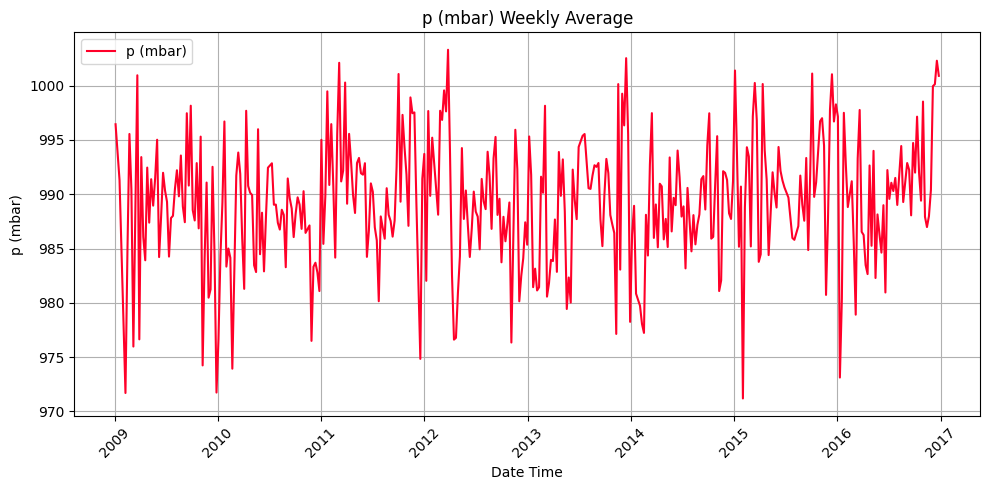

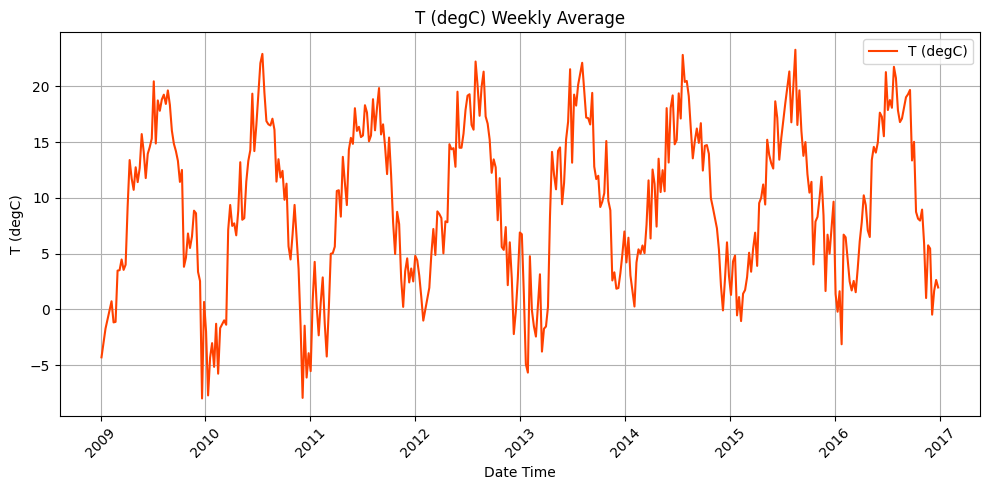

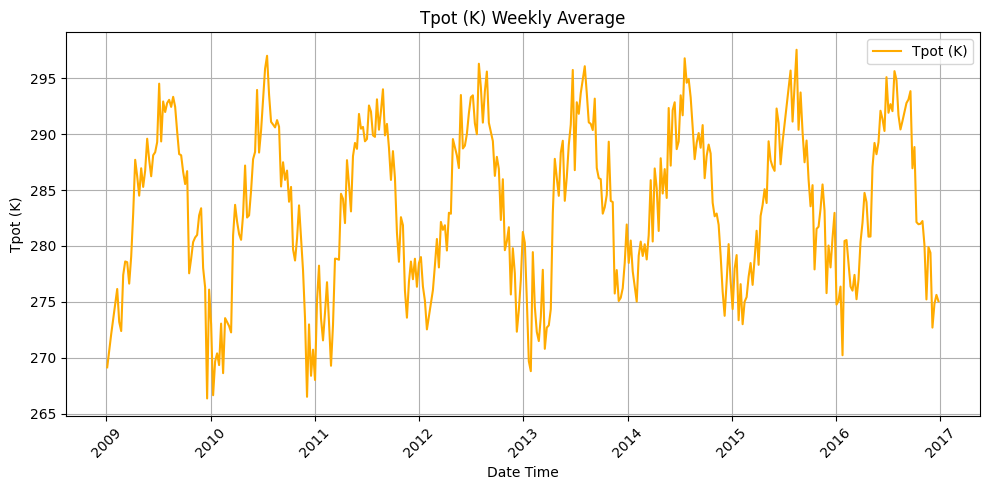

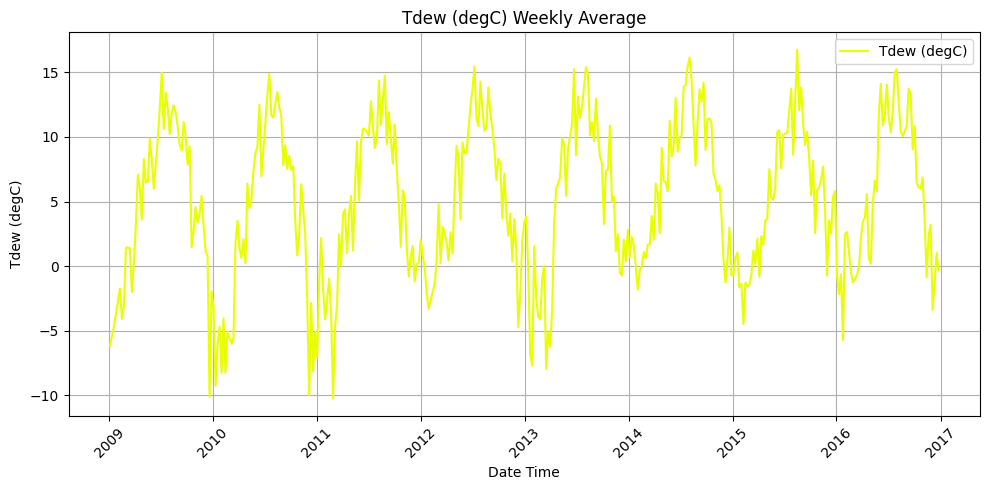

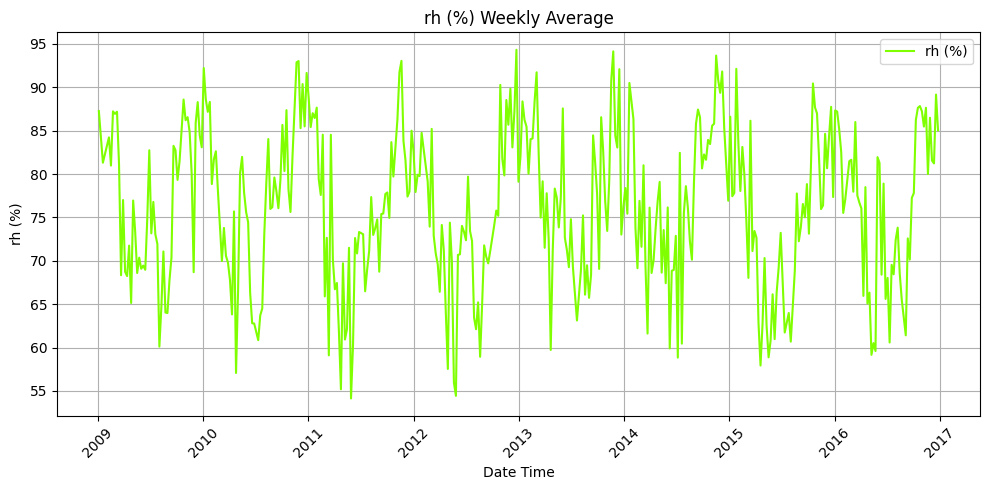

...

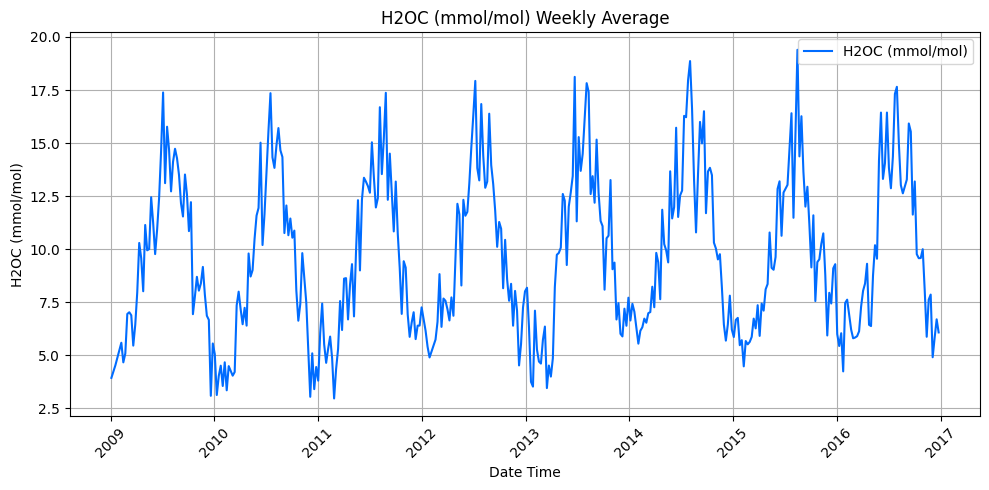

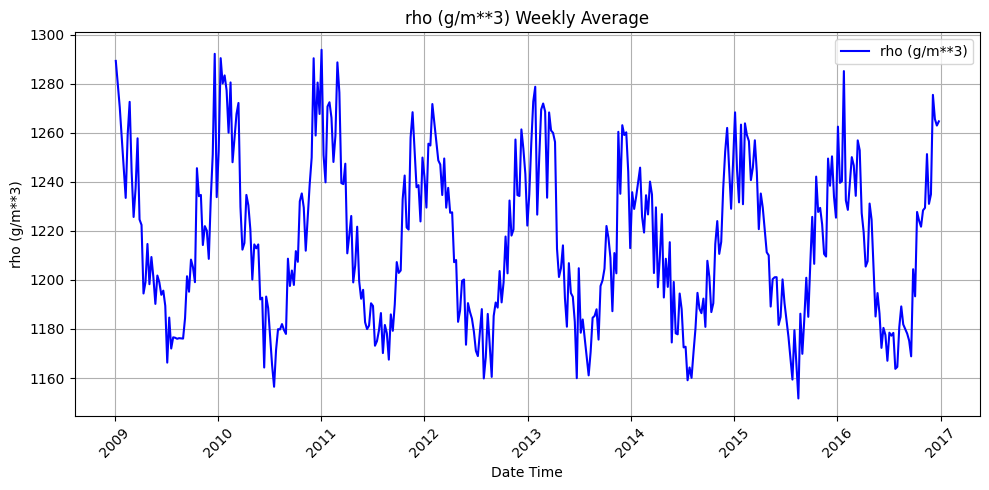

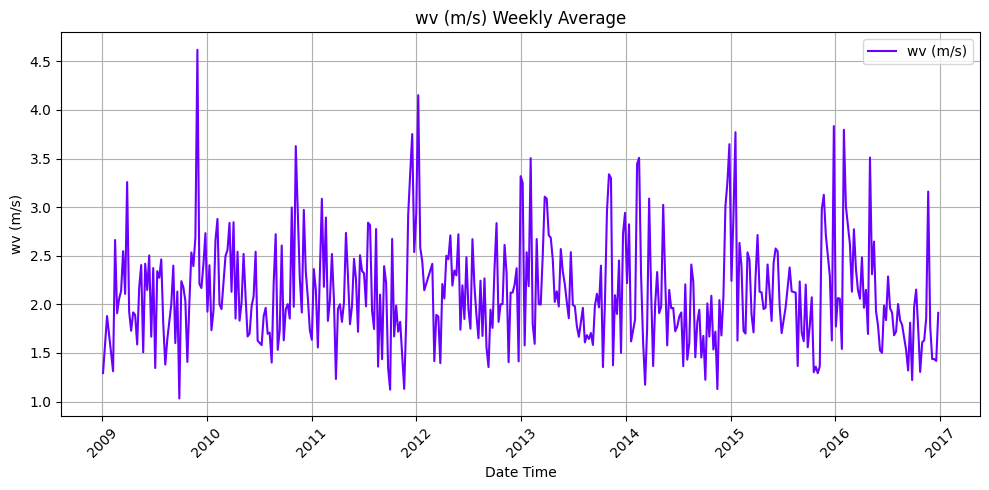

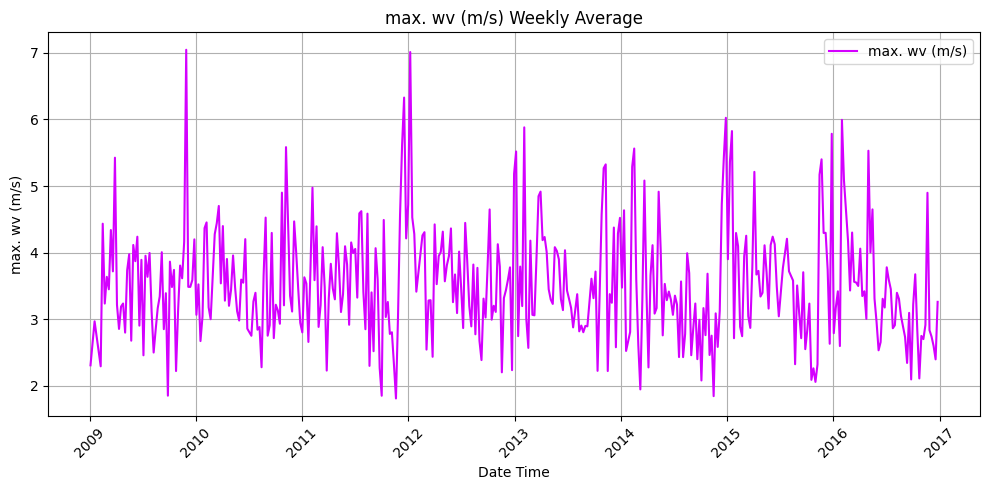

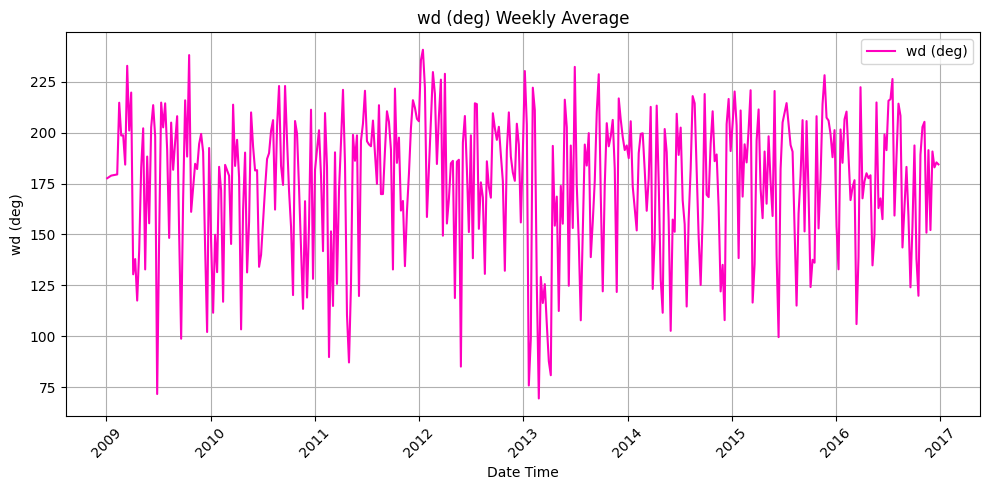

In [187]:
for colore, column in enumerate(columns):
    plt.figure(figsize=(10, 5))
    plt.plot(weather_df_weekly_no_outliers.index, weather_df_weekly_no_outliers[column], label=column, color=cmap(colore))
    plt.title(f'{column} Weekly Average')
    plt.xlabel('Date Time')
    plt.ylabel(column)
    plt.grid(True)
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

##### Box plots

In [188]:
# Add one colum to indicate the year (DatetimeIndex -> PeriodIndex)
weather_df_weekly_period = weather_df_weekly_no_outliers.copy()
weather_df_weekly_period['Period_Y'] = weather_df_weekly_period.index.to_period('Y')
weather_df_weekly_period.head(5)

,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg),Period_Y
Date Time,,,,,,,,,,,,,,,
2009-01-04,996.446696,-4.292070,269.146087,-6.185148,87.255409,4.511496,3.918348,0.593009,2.451287,3.934887,1289.293165,1.293252,2.310504,177.589652,2009
2009-01-18,991.308760,-1.717867,272.126657,-4.664692,81.310595,5.561796,4.483313,1.078720,2.820536,4.526012,1270.352133,1.879524,2.970417,178.882599,2009
2009-02-08,971.686974,0.732718,276.155179,-1.741111,84.228452,6.572510,5.429990,1.142688,3.485317,5.591171,1233.436716,1.311359,2.295347,179.457460,2009
2009-02-15,984.736240,-1.161835,273.211210,-4.093373,80.981131,5.715883,4.585575,1.130030,2.907897,4.666458,1259.230774,2.662411,4.434444,214.667540,2009
2009-02-22,995.551796,-1.115556,272.394077,-3.056200,87.228899,5.766875,5.059494,0.707619,3.168929,5.084345,1272.602163,1.908879,3.236617,198.556994,2009


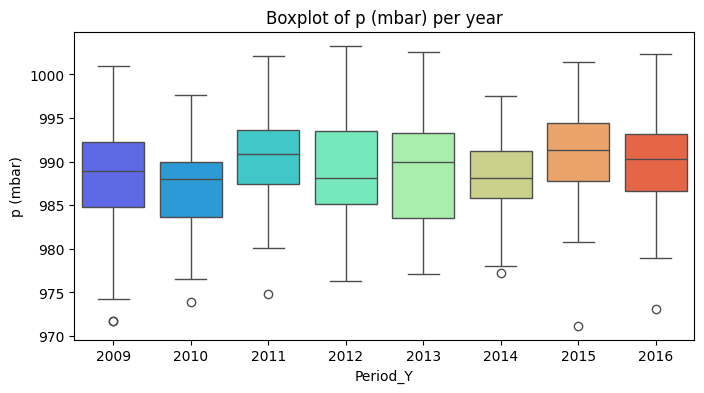

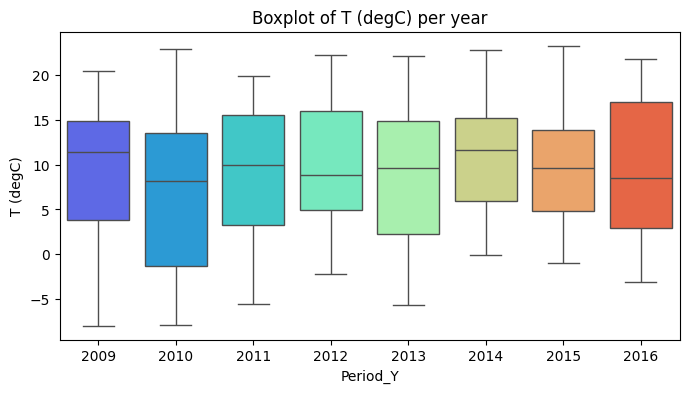

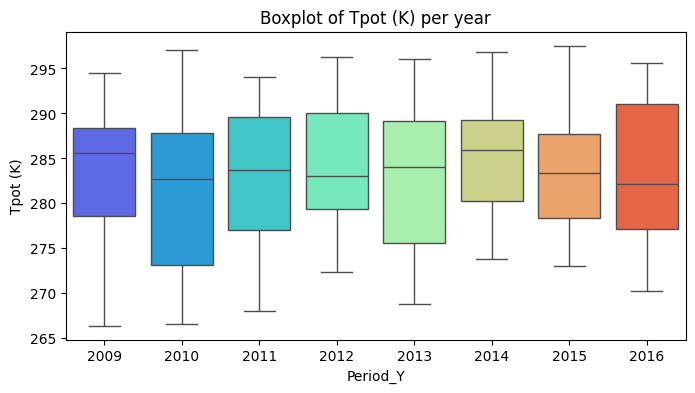

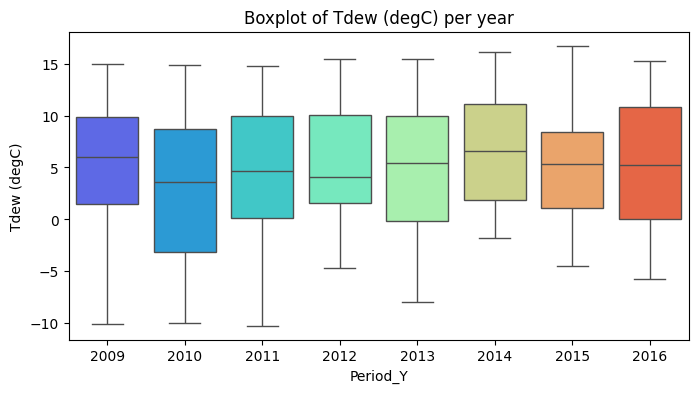

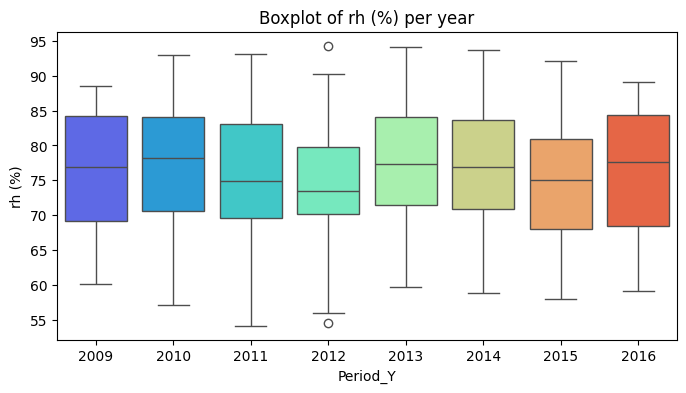

...

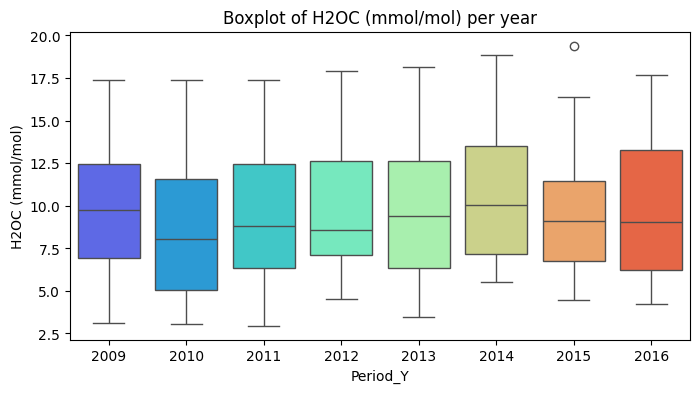

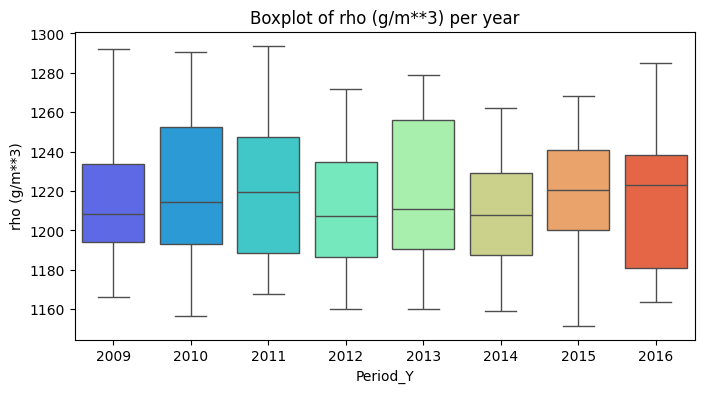

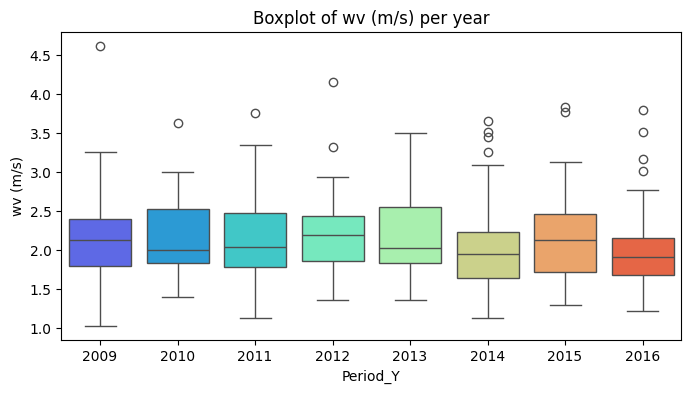

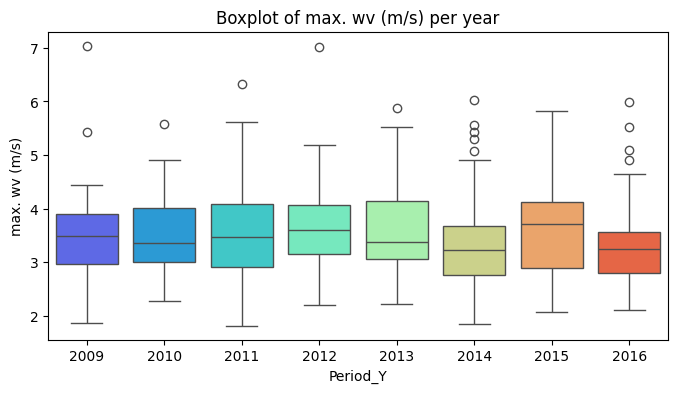

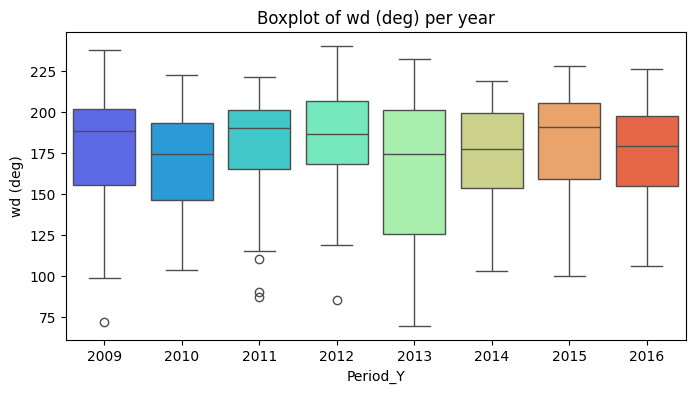

In [189]:
for column in weather_df_weekly_period.select_dtypes(include=[np.number]).columns:
    plt.figure(figsize=(8,4))
    plt.title('Boxplot of ' + column + ' per year')
    sns.boxplot(x = weather_df_weekly_period['Period_Y'], y = weather_df_weekly_period[column], palette='rainbow')
    plt.show()

##### Violin plots

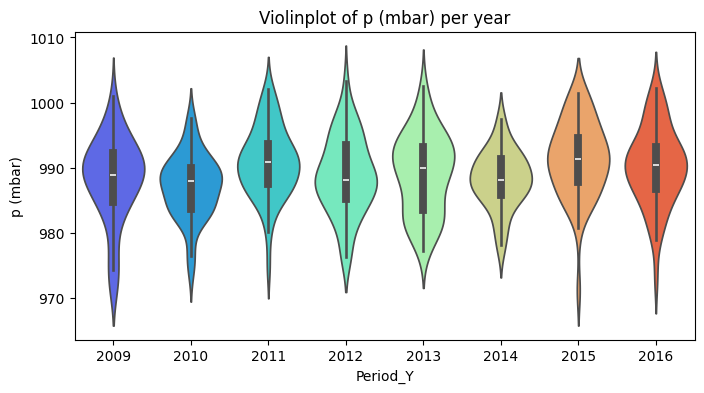

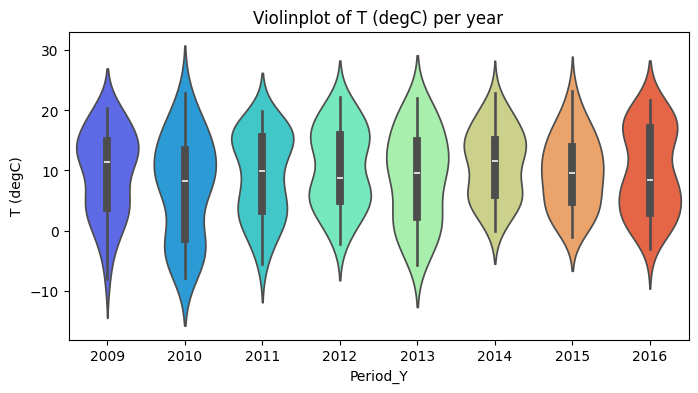

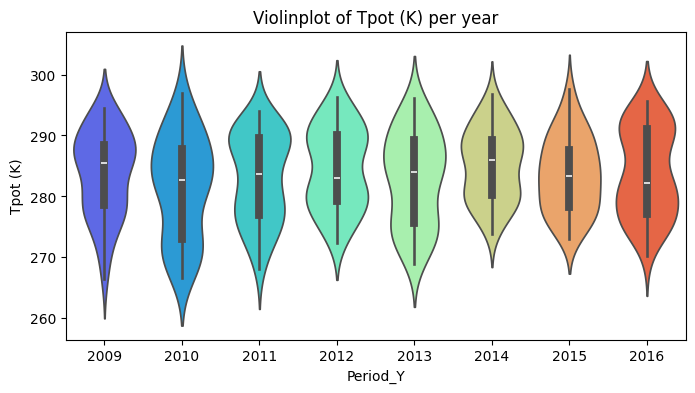

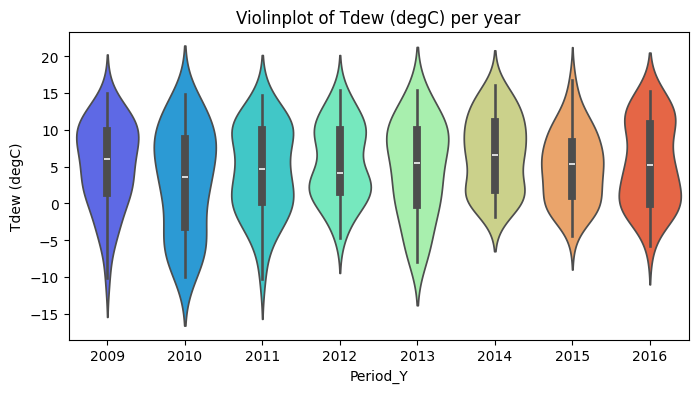

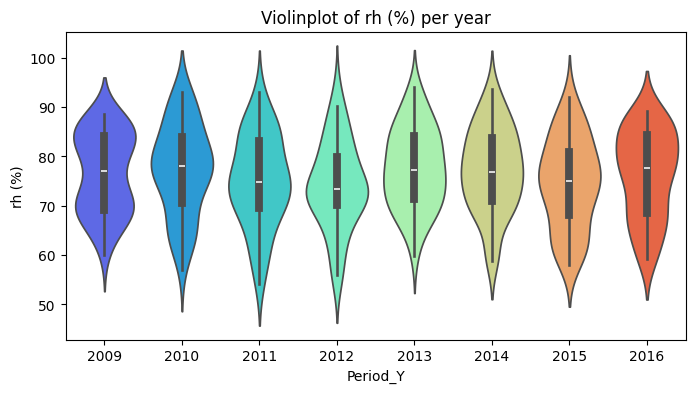

...

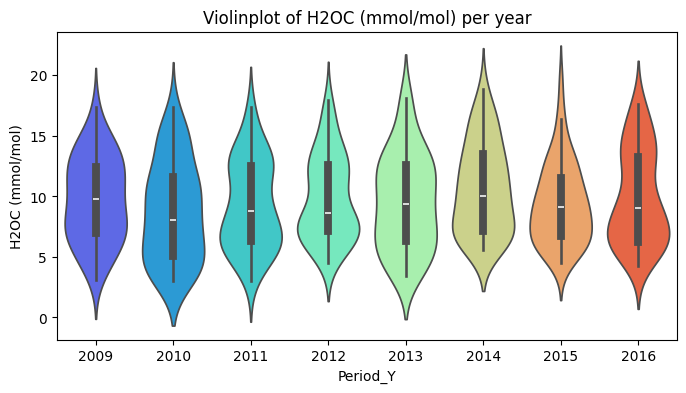

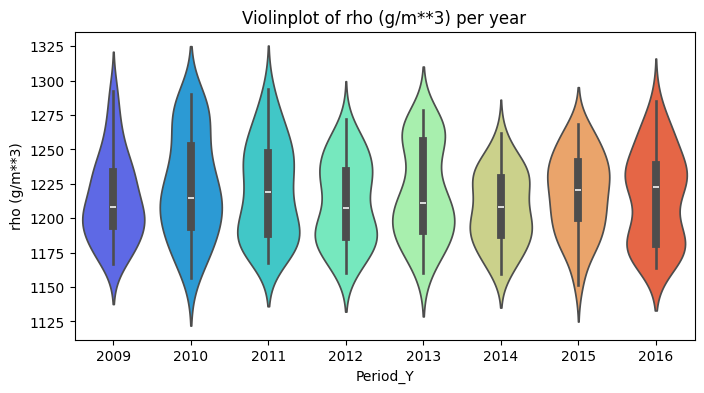

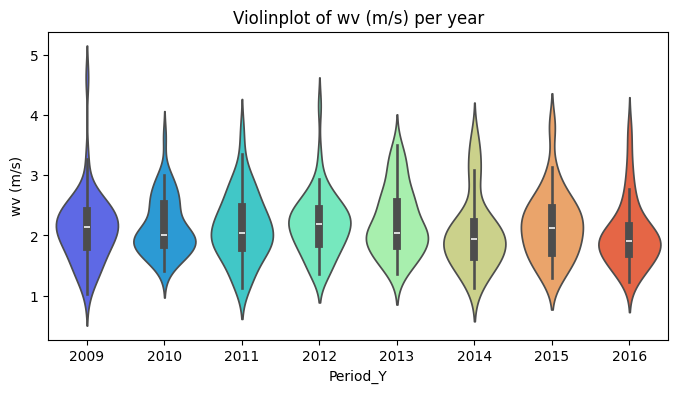

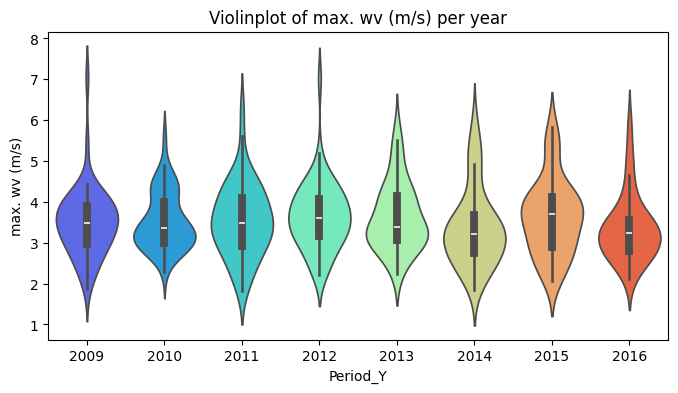

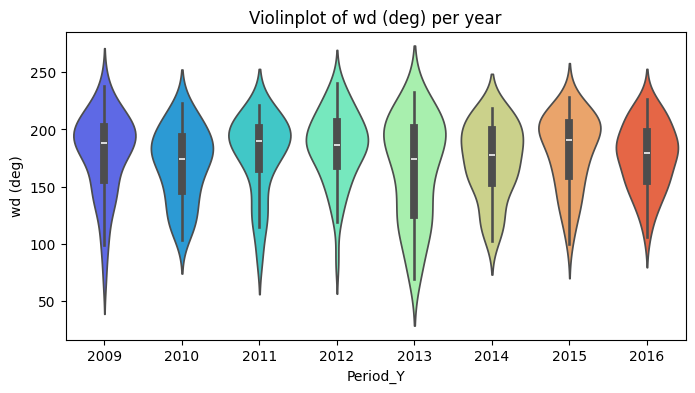

In [190]:
for column in weather_df_weekly_period.select_dtypes(include=[np.number]).columns:
    plt.figure(figsize=(8,4))
    plt.title('Violinplot of ' + column + ' per year')
    sns.violinplot(x = weather_df_weekly_period['Period_Y'], y = weather_df_weekly_period[column], palette='rainbow')
    plt.show()

##### Histograms

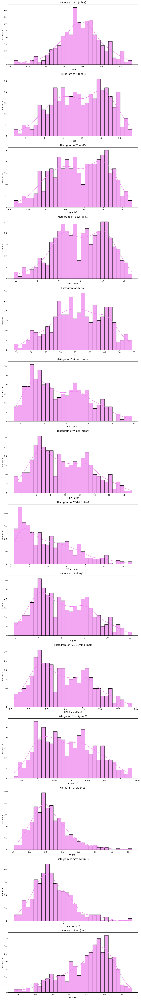

In [191]:
fig, axes = plt.subplots(len(weather_df_weekly_no_outliers.columns), 1, figsize=(10, len(weather_df_weekly_no_outliers.columns) * 5))
for i, column in enumerate(weather_df_weekly_no_outliers.columns):
    ax = axes[i] if len(weather_df_weekly_no_outliers.columns) > 1 else axes
    sns.histplot(data=weather_df_weekly_no_outliers, x=column, bins=30, kde=True, color='violet', edgecolor='black', alpha=0.7, ax=ax)
    ax.set_title(f'Histogram of {column}')
    ax.set_xlabel(column)
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

### Frequency analysis
Frequency-domain analysis is a tool of high importance in signal processing applications. This is widely used in such areas as economics, biology, geology, and image processing. While time-domain analysis shows how a signal changes over time, frequency analysis shows how the signal energy is distributed over a range of frequencies. It also includes information on the phase shift that must be applied to each frequency component in order to recover the original time signal with a combination of all the individual frequency components. \\
A signal can be converted between the time and frequency domains with a pair of mathematical operators called a transform. An example is the **Fourier transform**, which decomposes a function into the sum of a (potentially infinite) number of sine/cosine wave frequency components. The spectrum of the frequency components is the frequency domain representation of the signal. The inverse Fourier transform converts the frequency domain function back to a time function. It is also important to identify any periodicity in the time series.

The periodogram is a non-parametric (raw) estimate of the Power Spectral Density (PSD) found using some specific windows. It represents the Fourier transform of the autocorrelation of the windowed data sequence. To account for energy reduction given by the application of windows, Python functions apply some correction factors:
- *scaling = ‘density’* = corrects for the energy (integral) of the spectrum. This ensures, for example, that the PSD integrates to the mean square of the signal;
- *scaling = ‘spectrum’* = it returns the squared magnitude spectrum (scaling by the number of samples).

,Freq,Period,Power
0,0.019139,52.250000,18899.406162
1,0.031100,32.153846,117.468199
2,0.066986,14.928571,129.502714
3,0.098086,10.195122,122.711814


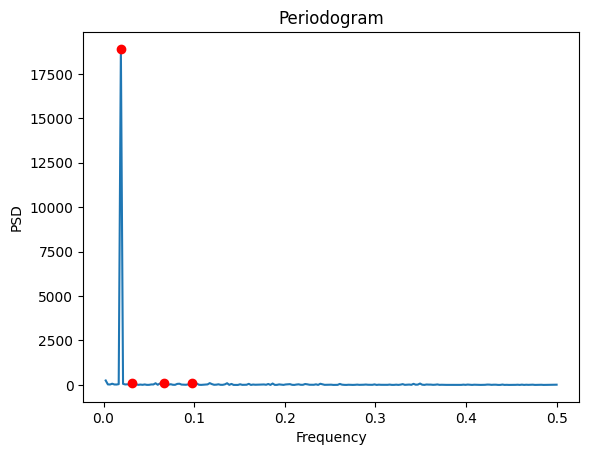

In [192]:
Fs = 1
f_per, Pxx_per = signal.periodogram(weather_df_weekly['T (degC)'],Fs,detrend=None,window='boxcar',return_onesided=True,scaling='density')
plt.plot(f_per[1:],Pxx_per[1:])
plt.xlabel('Frequency')
plt.ylabel('PSD')

f_per = f_per[1:]
Pxx_per = Pxx_per[1:]
peaks = signal.find_peaks(Pxx_per[f_per >=0], prominence=100)[0]
peak_freq =  f_per[peaks]
period_peak = 1/peak_freq
peak_power = Pxx_per[peaks]
plt.plot(peak_freq, peak_power, 'ro')
plt.title('Periodogram')

data = {'Freq': peak_freq, 'Period': period_peak, 'Power': peak_power}
df = pd.DataFrame(data)
display(df)

First peak is 52 -> confirms m=52 (m=7 when 365 days, m=4 whit quarters, etc.): there is a yearly seasonality.

The Welch algorithm (1967) is a non-parametric method to estimate the PSD. Instead of processing the FFT over the entire time domain, the signal is splitted into overlapping segments which are then windowed. A modified periodogram is then computed for each segment, and the spectral density is the mean of the modified periodograms, scaled so that area under the spectrum is the same as the mean square of the data. \\
The variance of the spectrum is reduced, which appears smoother than the raw FFT/periodogram output, but the frequency resolution is also reduced (main limit of Welch approach). There are different types of windowing sequence, like Hamming and Blackman, whose size affects the final results by cutting frequencies with periods larger than the window. This makes the signal smoother without sharp transitions that can disturb the frequency spectrum representation.

Total sum Density: 22849.446182824253
Frequency for the maximum value (Welch) is:  0.019138755980861243
Period (weeks/cycle):  52.25
Total sum Density: 23030.141851199365
Frequency for the maximum value is:  0.019138755980861243
Period (weeks/cycle):  52.25


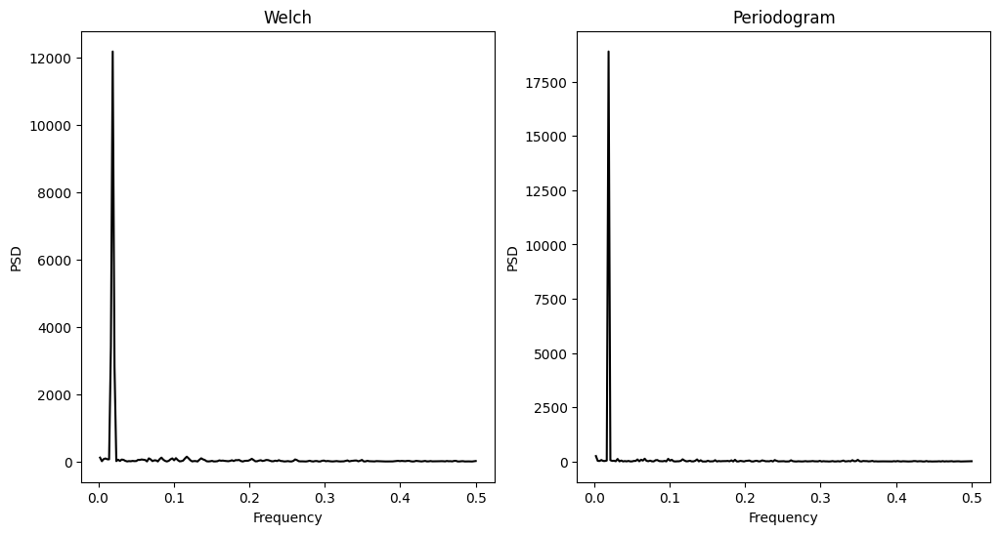

In [193]:
# Use Welch's and classic periodogram for PSD calculations. Found the frequency corresponding to the max value with these two methods
win = len(weather_df_weekly)
f_welch_density, Pxx_welch_density = signal.welch(weather_df_weekly['T (degC)'],Fs, window='hann', noverlap=None, nperseg=win, return_onesided=True, scaling='density')
f_welch_density = f_welch_density[1:]
Pxx_welch_density = Pxx_welch_density[1:]

f_per_density, Pxx_per_density = signal.periodogram(weather_df_weekly['T (degC)'],Fs,detrend=False,window=None,nfft=None,return_onesided=True,scaling='density')
f_per_density = f_per_density[1:]
Pxx_per_density = Pxx_per_density[1:]

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].plot(f_welch_density, Pxx_welch_density,'k')
ax[0].set_xlabel('Frequency')
ax[0].set_ylabel('PSD')
ax[0].set_title('Welch')

ax[1].plot(f_per_density, Pxx_per_density,'k')
ax[1].set_xlabel('Frequency')
ax[1].set_ylabel('PSD')
ax[1].set_title('Periodogram')

P_welch = np.sum(Pxx_welch_density)
print('Total sum Density:', P_welch)
temp_welch = np.where(Pxx_welch_density == Pxx_welch_density.max())
print('Frequency for the maximum value (Welch) is: ',float(f_welch_density[temp_welch]))
print('Period (weeks/cycle): ',float(1/f_welch_density[temp_welch]))

P_per = np.sum(Pxx_per_density)
print('Total sum Density:', P_per)
temp_per = np.where(Pxx_per_density == Pxx_per_density.max())
print('Frequency for the maximum value is: ',float(f_per_density[temp_per]))
print('Period (weeks/cycle): ',float(1/f_per_density[temp_per]))

By definition, the Frequency can be found by doing 1/T. We know that our period is around 52 (more precisely 52,1429). Therefore, since T=1/F, we compute:

<center>T = 1/0.01915 = 52,...</center>

Ergo

<center>m = 52</center>

Confirms a periodicity of 52 weeks.

## **Point 3**
Describing the time series patterns (visually and numerically).

In [194]:
train_temp = train['T (degC)']
test_temp = test['T (degC)']

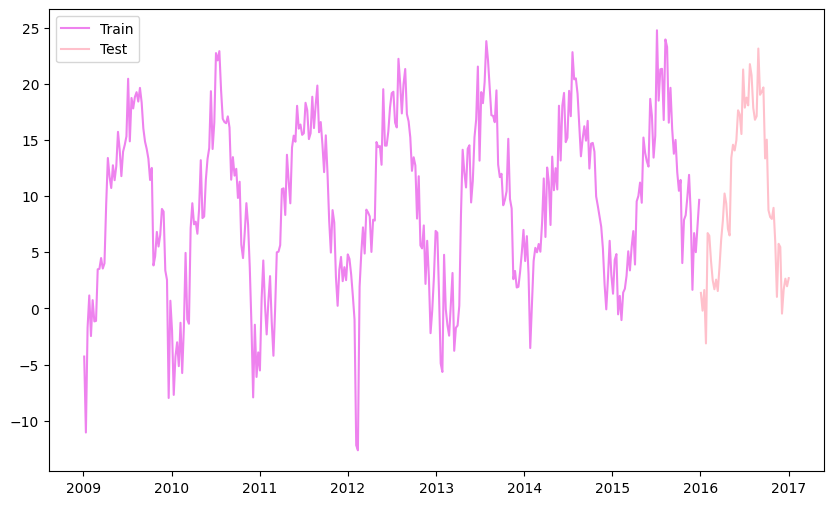

In [195]:
plt.figure(figsize=(10,6))
plt.plot(train_temp, color = 'violet', label='Train')
plt.plot(test_temp, color='pink', label='Test')
plt.legend()
plt.show()

### Decomposition

Time series data can exhibit a variety of patterns, and it is often helpful to split a time series into several components, each representing an underlying pattern category.

When analysing a general time series, four main components could be generally detected:
- **Trend**:  this exists when there is a long-term increase or decrease in the data (not necessarely linear). Sometimes the trend might change
direction as time increases;
- **Seasonality**: this occurs when a time series is affected by seasonal factors (e.g., the quarter of the year, the month, or the day of the week). It exhibits regular fluctuations based on the season, referring to a pattern that occurs at a regular interval (fixed and known period). Seasonality in a time series is thus a regular pattern of changes that repeats over S time periods, where S defines the number of time periods until the pattern repeats again. \
For example, there is seasonality in monthly data for which high values tend always to occur in some particular months and low values tend always to occur in others. In this case, S = 12 (months per year) is the span of the periodic seasonal behavior, while for quarterly data, S = 4 time periods per year.
- **Cycle**: this happens when the data exhibit rises and falls that are not of a fixed frequency. The average length of cycles is longer than
the length of a seasonal pattern (usually at least 2 years). A common example is the 'business cycle'. In practice, the trend component is assumed to include also the cyclical component.
- **Irregular (or Residual)**: what is left is assumed to be caused by random, non-periodic events.


#### Classical

In classical decomposition, we assume that the seasonal component is constant from year to year and we refer to this as a seasonal period *m* (e.g, m = 4 for quarterly data, m = 12 for monthly data, m = 52 for weekly data, m = 7 for daily data with weekly seasonality or m = 365 for daily data with yearly seasonality).

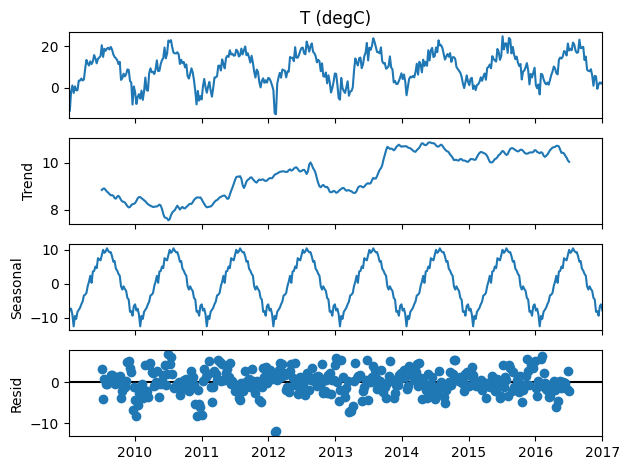

In [330]:
decompose_data_add = seasonal_decompose(weather_df_weekly['T (degC)'], model='additive', period = 52)
decompose_data_add.plot()
plt.show()

The "trend" line shows an increase of the temperature over time, probably due to climate change. The "seasonal line" clearly confirms the annual seasonality of the data.

Anothere way to visualize the residuals of additive decomposition:

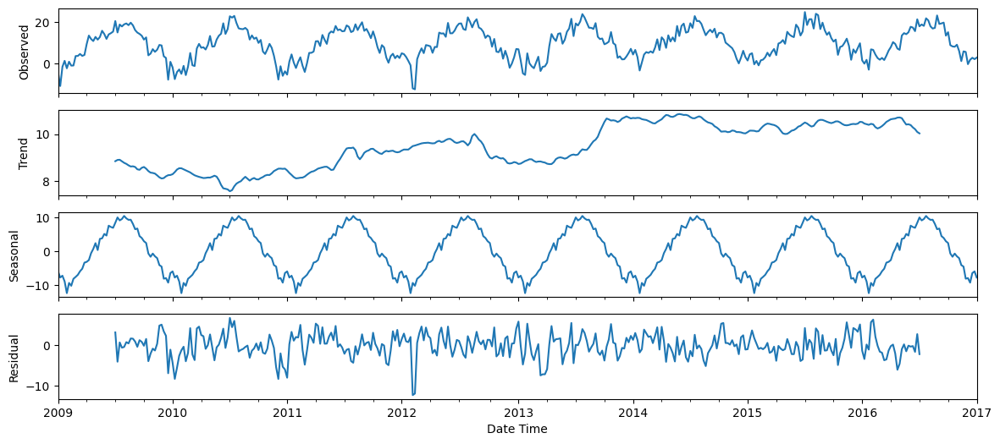

In [197]:
def plotseasonal(res, axes):
    res.observed.plot(ax=axes[0], legend=False)
    axes[0].set_ylabel('Observed')
    res.trend.plot(ax=axes[1], legend=False)
    axes[1].set_ylabel('Trend')
    res.seasonal.plot(ax=axes[2], legend=False)
    axes[2].set_ylabel('Seasonal')
    res.resid.plot(ax=axes[3], legend=False)
    axes[3].set_ylabel('Residual')

fig, axes = plt.subplots(ncols=1, nrows=4, sharex=True, figsize=(14,6))
plotseasonal(decompose_data_add, axes)

The additive decomposition is the most appropriate if the magnitude of the seasonal fluctuations, or the variation around the trend-cycle, does not vary with the level of the time series. When these variations appear to be proportional to the level of the time series, then a multiplicative decomposition is more appropriate. These are common with economic time series. The multiplicative model is also not good here due to the fact that the column has negative values.

#### STL

While classical decompositions is widely used, this has three major problems:
- The estimate of the trend-cycle is unavailable for the first few and last few observations. For example, if m=12, there is no trend-cycle estimate for the first six or the last six observations;
- The trend-cycle estimate tends to over-smooth rapid rises and falls in the data;
- It assumes that the seasonal component repeats from year to year.

An alternative decomposition method is represented by **STL (Seasonal and Trend decomposition using Loess)**, with loess being a method for estimating nonlinear relationships. It has some advantages over classical methods as the seasonal component is allowed to change over time, the rate of change can be controlled by the user and it is more robust to outliers. However, it only provides facilities for additive decompositions.

In [198]:
stl = STL(train_temp, seasonal=7, robust = True)
res = stl.fit()
stl.config # To check the main parameters of the decomposition

{'period': 52,
 'seasonal': 7,
 'seasonal_deg': 1,
 'seasonal_jump': 1,
 'trend': 101,
 'trend_deg': 1,
 'trend_jump': 1,
 'low_pass': 53,
 'low_pass_deg': 1,
 'low_pass_jump': 1,
 'robust': True}

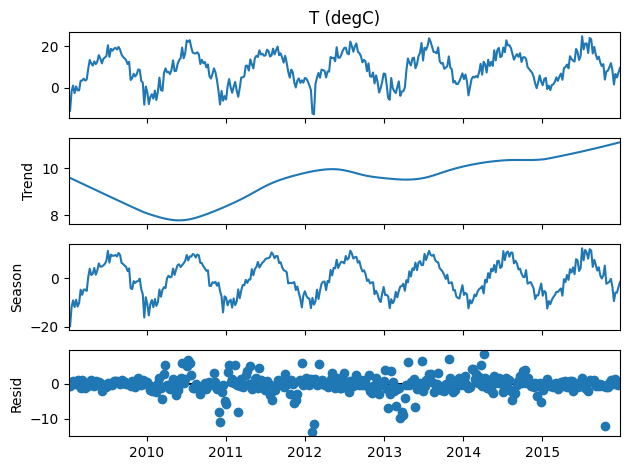

In [199]:
res.plot()
plt.show()

### Stationarity

A stationary time series is one whose statistical properties do not depend on the time at which the series is observed.

In order to check for the **stationarity of a time series**, different operations and statistical tests can be done, in particular:
- Evaluating rolling statistics (generally mean and standard deviation) -> it should be constant each year;
- ACF plot: for a stationary time series the ACF will drop to zero relatively quickly, while the ACF of non-stationary data decreases slowly;
- Unit root tests: these are statistical hypothesis tests of stationarity that are designed for determining whether differencing is required. ADF (Augmented Dickey-Fuller) and KPSS (Kwiatkowski-Phillips-Schmidt-Shin) tests are the main ones.

#### Rolling statistics

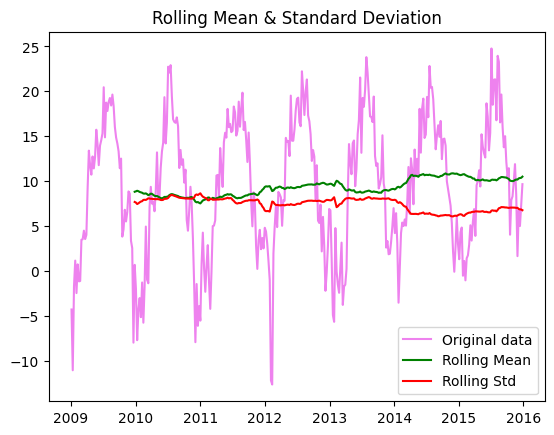

In [200]:
# Rolling statistics
rolling_mean = train_temp.rolling(52).mean()
rolling_std = train_temp.rolling(52).std()
plt.plot(train_temp, color='violet', label='Original data')
plt.plot(rolling_mean, color='green', label='Rolling Mean')
plt.plot(rolling_std, color='red', label='Rolling Std')
plt.legend(loc='best')
plt.title('Rolling Mean & Standard Deviation')
plt.show()

Rolling mean and std do not have a constant behaviour over the years, this hints towards non-stationarity.

#### ACF

Just as correlation correlation measures the extent of a linear relationship between two variables, autocorrelation measures the linear relationship between lagged values of a time series (in simpler terms, it assesses how much the current value of a series depends on its past values). The autocorrelation coefficients make up the *autocorrelation function* or *ACF*, which helps identify patterns and dependencies within the data.

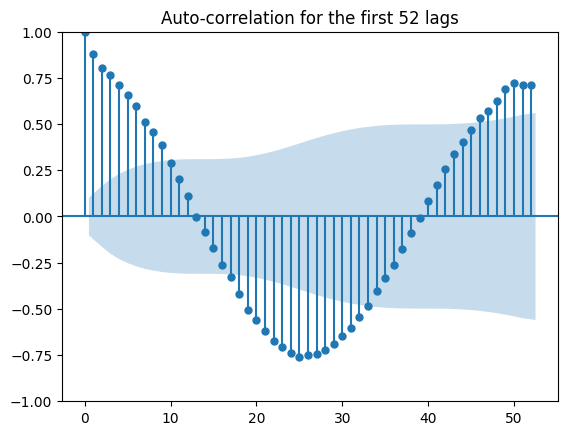

In [201]:
plot_acf(train_temp, lags=52, title='Auto-correlation for the first 52 lags')
plt.show()

If the series were stationary, the autocorrelations would drop to near zero quickly, but that is not really the case. The periodic nature of the autocorrelations confirms the seasonality of the data.

Moreover, several lags are outside the confidence interval.

#### ADF and KPSS

In [202]:
# Execute an AdFuller test on the data. If the p-value is less than <=0.05 the data is stationary, otherwise it is not.
def adfuller_test(data):
  adf_test = adfuller(data,autolag='AIC') # AIC is the default option
  print('ADF Statistic:', adf_test[0])
  print('p-value: ', adf_test[1])
  print('Critical Values:')
  for key, value in adf_test[4].items():
      print('\t%s: %.3f' % (key, value))
  if adf_test[1] <= 0.05:
    print('We can reject the null hypothesis (H0) --> data is stationary')
  else:
    print('We cannot reject the null hypothesis (H0) --> data is non-stationary')

adfuller_test(train_temp)

ADF Statistic: -7.945514086336796
p-value:  3.2279831966227972e-12
Critical Values:
	1%: -3.449
	5%: -2.870
	10%: -2.571
We can reject the null hypothesis (H0) --> data is stationary


In [203]:
# Execute a KPSS test on the data passed by the argument. If the p-value is less than 0.05 then null hypothesis cannot be rejected
# and that's means the data is not trend stationary, otherwise is trend stationary.
def kpss_test(data):
  kpss_out = kpss(data,regression='ct', nlags='auto', store=True)
  print('KPSS Statistic:', kpss_out[0])
  print('p-value: ', kpss_out[1])
  if kpss_out[1] <= 0.05:
    print('We can reject the null hypothesis (H0) --> data is not trend stationary')
  else:
    print('We cannot reject the null hypothesis (H0) --> data is trend stationary')
kpss_test(train_temp)

KPSS Statistic: 0.020274605447635607
p-value:  0.1
We cannot reject the null hypothesis (H0) --> data is trend stationary


In [204]:
# Execute a second KPSS test
def kpss_test_2(data):
  kpss_out = kpss(data,regression='c', nlags='auto', store=True)
  print('KPSS Statistic:', kpss_out[0])
  print('p-value: ', kpss_out[1])
  if kpss_out[1] <= 0.05:
    print('We can reject the null hypothesis (H0) --> data is not trend stationary')
  else:
    print('We cannot reject the null hypothesis (H0) --> data is trend stationary')
kpss_test_2(train_temp)

KPSS Statistic: 0.10545784665825465
p-value:  0.1
We cannot reject the null hypothesis (H0) --> data is trend stationary


These two tests are not interchangeble, considering their different assumptions/null hypotheses. It is always better to apply both of them, so that it can be ensured that the series is truly stationary. Possible outcomes of applying these stationary tests are as follows:

- **Case 1**: Both tests conclude that the series is not stationary - The series is not stationary.

- **Case 2**: Both tests conclude that the series is stationary - The series is stationary.

- **Case 3**: KPSS indicates stationarity and ADF indicates non-stationarity -> The series is trend stationary: it requires operations to remove the trend (MIN 21). The resulting detrended series is checked for stationarity.

- **Case 4:** KPSS indicates non-stationarity and ADF indicates stationarity ->  The series is difference stationary: it requires differencing. The differenced series is checked for stationarity.

We are in case 3, therefore we don't need to differentiate/decompose the data.

#### Remove Seasonality
I try to apply the above methods to the data, but without the seasonal components to see if I get better results for the first 2 methods.

In [205]:
# Extract the trend and seasonal components
stl_trend = res.trend
stl_seasonal = res.seasonal

# Calculate the seasonally-adjusted series
stl_seasonally_adjusted = train_temp - stl_seasonal

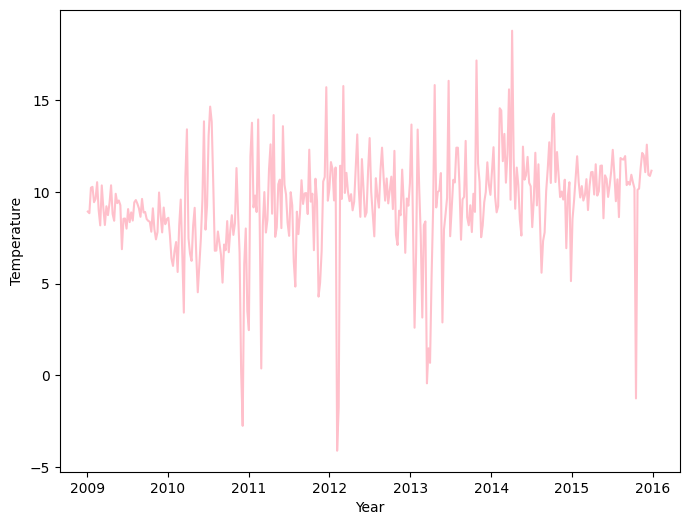

In [206]:
plt.figure(figsize=(8,6))
plt.plot(stl_seasonally_adjusted,color='pink')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.show()

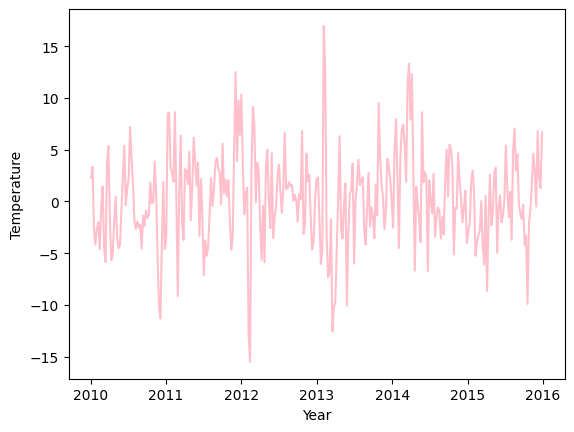

In [ ]:
# Another method to remove seasonality is to use seasonal differencing
train_temp_diff = train_temp.diff(52).dropna()
plt.plot(train_temp_diff, color = 'pink')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.show()

##### Rolling statistics

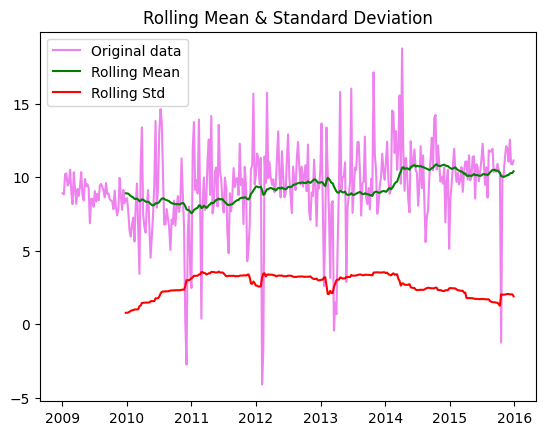

In [209]:
# Rolling statistics
rolling_mean = stl_seasonally_adjusted.rolling(52).mean()
rolling_std = stl_seasonally_adjusted.rolling(52).std()
plt.plot(stl_seasonally_adjusted, color='violet', label='Original data')
plt.plot(rolling_mean, color='green', label='Rolling Mean')
plt.plot(rolling_std, color='red', label='Rolling Std')
plt.legend(loc='best')
plt.title('Rolling Mean & Standard Deviation')
plt.show()

Rolling std seems to be more constant over the years than before (but not enough), mean not so much.

##### ACF

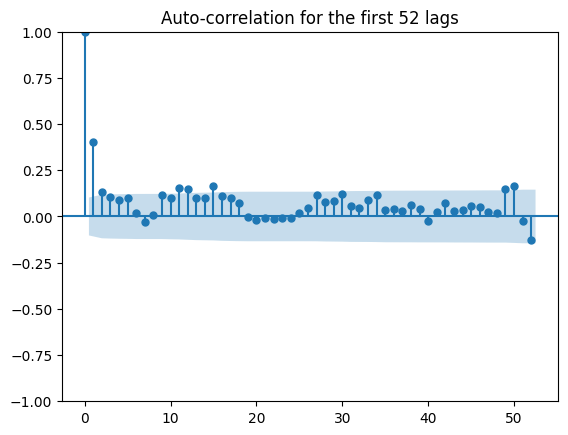

In [210]:
plot_acf(stl_seasonally_adjusted, lags=52, title='Auto-correlation for the first 52 lags')
plt.show()

Now, the autocorrelation drops quickly to zero and I have way less lags outside the confidence interval, therefore the data seem to be stationary.

##### ADF and KPSS

In [211]:
# Execute an AdFuller test on the data. If the p-value is less than <=0.05 the data is stationary, otherwise it is not.
def adfuller_test(data):
  adf_test = adfuller(data,autolag='AIC') # AIC is the default option
  print('ADF Statistic:', adf_test[0])
  print('p-value: ', adf_test[1])
  print('Critical Values:')
  for key, value in adf_test[4].items():
      print('\t%s: %.3f' % (key, value))
  if adf_test[1] <= 0.05:
    print('We can reject the null hypothesis (H0) --> data is stationary')
  else:
    print('We cannot reject the null hypothesis (H0) --> data is non-stationary')

adfuller_test(stl_seasonally_adjusted)

ADF Statistic: -12.415294066831464
p-value:  4.2539551106637783e-23
Critical Values:
	1%: -3.448
	5%: -2.870
	10%: -2.571
We can reject the null hypothesis (H0) --> data is stationary


In [212]:
# Execute a KPSS test on the data passed by the argument. If the p-value is less than 0.05 then null hypothesis cannot be rejected
# and that's means the data is not trend stationary, otherwise is trend stationary.
def kpss_test(data):
  kpss_out = kpss(data,regression='ct', nlags='auto', store=True)
  print('KPSS Statistic:', kpss_out[0])
  print('p-value: ', kpss_out[1])
  if kpss_out[1] <= 0.05:
    print('We can reject the null hypothesis (H0) --> data is not trend stationary')
  else:
    print('We cannot reject the null hypothesis (H0) --> data is trend stationary')
kpss_test(stl_seasonally_adjusted)

KPSS Statistic: 0.0685099096229223
p-value:  0.1
We cannot reject the null hypothesis (H0) --> data is trend stationary


## **Point 4**
Focusing on temperature (degC, dependent variable), build the most appropriate models to forecast the
data for the specified period. Evaluate the model performance using different metrics. Visualise the results with appropriate graphs.

I'm focusing on the column T (degC), which, we have seen in the Correlation plot, has an high correlation with the columns:
- (Tpot (K)),
- (Tdew (degC)),
- VPmax (mbar),
- VPact (mbar),
- VPdef (mbar),
- sh (g/kg),
- H2OC (mmol/mol),
- rho (g/m**3) - negative correlation.

#### Simple Models

Several methods are currently available to forecast portion of data over a period, ranging from simple to more complex approaches each one with its own specific properties/applicability criteria. 

1. **Mean (average) method**: the forecasts of all future values are equal to the  average of the historical data
2.  **Naive method:** all forecasts are set to be equal to the value of the last observation. This method works well for many economic and financial time series.
3. **Seasonal naive method:** similar to naive but useful for highly seasonal data. In this case, we set each forecast to be equal to the last observed value from the previous season.
4. **Drift method:** variation on the naïve method to allow the forecasts to increase or decrease over time. The amount of change over time (drift) is set to be the average change seen in the historical data.

Of the 4, I expect only the seasonal naive method to work well. Nonethless, I try to apply them to see how they work.

##### Mean Method

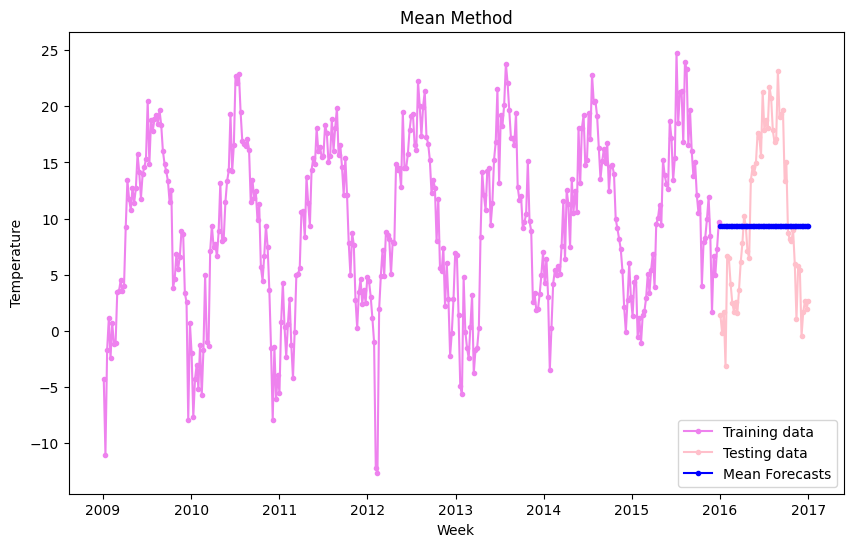

In [213]:
# 1) Mean method --> the forecasts of all future values are equal to the average of the historical data
model_mean = HistoricAverage()
model_mean = model_mean.fit(train_temp)
forecast_values = model_mean.predict(len(test_temp)) # we have to specify the forecasting horizon (i.e., how many points to forecast)

plt.figure(figsize=(10, 6))
plt.plot(train_temp, color='violet',marker = '.',label='Training data')
plt.plot(test_temp, color='pink', marker = '.',label='Testing data')
plt.plot(test_temp.index, forecast_values['mean'], color='blue', marker = '.', label='Mean Forecasts' )
plt.xlabel('Week')
plt.ylabel('Temperature')
plt.title('Mean Method')
plt.legend()
plt.show()

In [214]:
print('RMSE:', np.sqrt(mean_squared_error(test_temp, forecast_values['mean'])))
print('MAE:', mean_absolute_error(test_temp, forecast_values['mean']))

RMSE: 7.205822603900946
MAE: 6.352310524269773


The results are, as expected, not good.

##### Naive Method

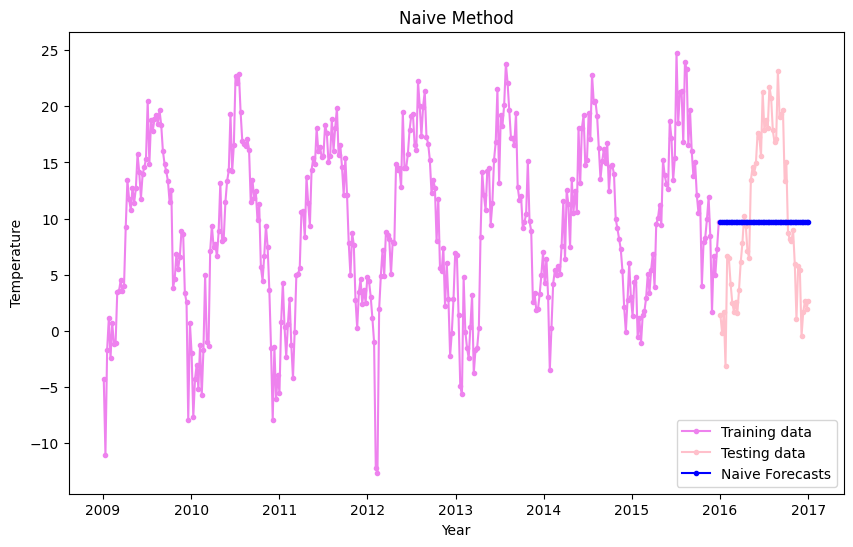

In [215]:
# 2) Naive Method --> we simply set all forecasts to be the value of the last observation
model_naive = Naive()
model_naive = model_naive.fit(train_temp)
forecast_values = model_naive.predict(len(test_temp))

plt.figure(figsize=(10, 6))
plt.plot(train_temp, color='violet',marker = '.',label='Training data')
plt.plot(test_temp, color='pink', marker = '.',label='Testing data')
plt.plot(test_temp.index, forecast_values['mean'], color='blue', marker = '.', label='Naive Forecasts' )
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.title('Naive Method')
plt.legend()
plt.show()

In [216]:
print('RMSE:', np.sqrt(mean_squared_error(test_temp, forecast_values['mean'])))
print('MAE:', mean_absolute_error(test_temp, forecast_values['mean']))

RMSE: 7.1902771113806745
MAE: 6.391985227688419


The results are, as expected, not good.

##### Seasonal Naive Method

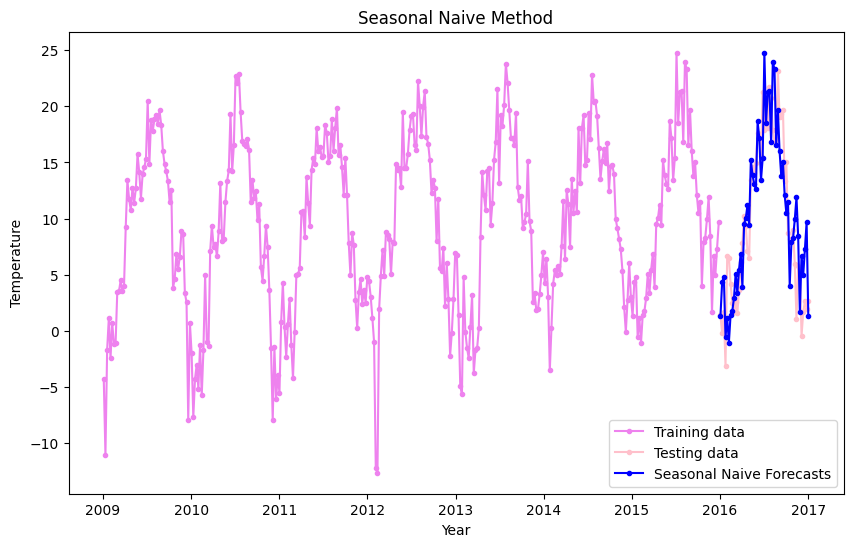

In [331]:
# 3) Seasonal Naive Method --> similar to the naive, but uses the last known observation of the same period
model_seasonal_naive = SeasonalNaive(season_length=52) # seasonality has to be specified
model_seasonal_naive = model_seasonal_naive.fit(train_temp)
forecast_values_seas = model_seasonal_naive.predict(len(test_temp))

plt.figure(figsize=(10, 6))
plt.plot(train_temp, color='violet',marker = '.',label='Training data')
plt.plot(test_temp, color='pink', marker = '.',label='Testing data')
plt.plot(test_temp.index, forecast_values_seas['mean'], color='blue', marker = '.', label='Seasonal Naive Forecasts' )
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.title('Seasonal Naive Method')
plt.legend()
plt.show()

In [332]:
print('RMSE:', np.sqrt(mean_squared_error(test_temp, forecast_values_seas['mean'])))
print('MAE:', mean_absolute_error(test_temp, forecast_values_seas['mean']))

RMSE: 3.9221625594094465
MAE: 3.1314259732699528


The Seasonal Naive Method seems to be the most accurate one of the methods.

##### Drift Method

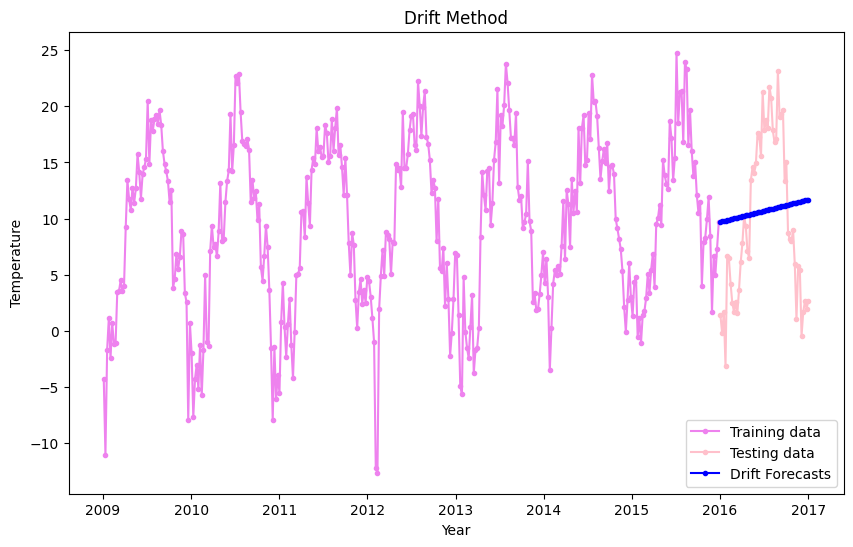

In [219]:
# 4) Drift Method --> variation on Naive, it allows the forecasts to increase or decrease over time (amout of change is called drift)
model_drift = RandomWalkWithDrift() # seasonality has to be specified
model_drift = model_drift.fit(train_temp)
forecast_values = model_drift.predict(len(test_temp))

plt.figure(figsize=(10, 6))
plt.plot(train_temp, color='violet',marker = '.',label='Training data')
plt.plot(test_temp, color='pink', marker = '.',label='Testing data')
plt.plot(test_temp.index, forecast_values['mean'], color='blue', marker = '.', label='Drift Forecasts' )
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.title('Drift Method')
plt.legend()
plt.show()

In [220]:
print('RMSE:', np.sqrt(mean_squared_error(test_temp, forecast_values['mean'])))
print('MAE:', mean_absolute_error(test_temp, forecast_values['mean']))

RMSE: 7.1485909210271705
MAE: 6.466735443060162


The results are, as expected, not good.

We have confirmed that the Seasonal Naive Method is the best out of the Simple Models.

#### Exponential Smoothing Models
Forecasts produced using exponential smoothing methods (generally known as "ETS models", where E indicates error, T trend and S seasonality) are weighted averages of past observations, with the weights decaying exponentially as the observations get older. Briefly, the more recent the observation is, the higher the associated weight.

##### Simple Exponential Smoothing
The simplest of the exponentially smoothing methods is called **simple exponential smoothing (SES)**, also referred to as single exponential smoothing. This method is suitable for forecasting data with *no clear trend or seasonal pattern*.

I don't expect this to work well, since we have proved the data has a seasonal pattern.

In [221]:
model_SES = ETSModel(train_temp, error = 'add', seasonal_periods = 52).fit()

# Estimated parameters
tab = {'Param Name': model_SES.param_names, 'Values': model_SES.params}
tab = pd.DataFrame(tab)

predictions = model_SES.get_prediction(start=test_temp.index[0], end=test_temp.index[-1])
df_SES = predictions.summary_frame()

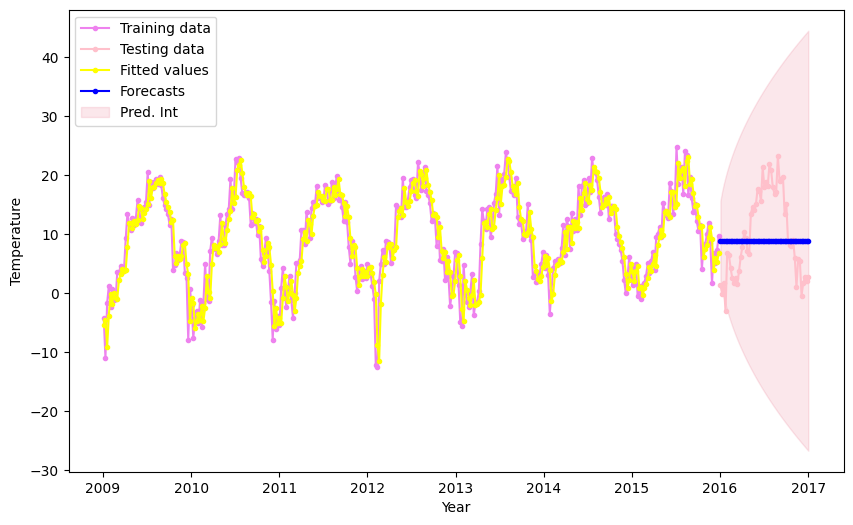

In [222]:
# Visualization
plt.figure(figsize=(10, 6))
plt.plot(train_temp, color='violet',marker = '.',label='Training data')
plt.plot(test_temp, color='pink', marker = '.',label='Testing data')
plt.plot(model_SES.fittedvalues,color='yellow', marker = '.', label='Fitted values')
plt.plot(df_SES['mean'], color='blue', marker = '.', label='Forecasts')
plt.fill_between(df_SES.index, df_SES['pi_lower'], df_SES['pi_upper'], alpha=.1, color='crimson', label='Pred. Int')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.legend()
plt.show()

In [223]:
print('AIC:', model_SES.aic)

AIC: 1945.4389494754937


SES model is only suitable if the time series has no trend or seasonal component, so I'm not surprised by the "bad" results.

##### Double Exponential Smoothing
Holt (1957) extended SES method to allow the forecasting of data with a trend. This method involves a forecast equation and two smoothing equations (one for the level and one for the trend).

In [224]:
# Train the model
model_DES = ETSModel(train_temp, error = 'add', trend='add').fit()

# Forecasting in the future and prediction interval
pred = model_DES.get_prediction(start=test_temp.index[0], end=test_temp.index[-1])
df_DES = pred.summary_frame()
forecasts = df_DES['mean']

# Model parameters
tab = {'Param Name': model_DES.param_names, 'Values': model_DES.params}
tab = pd.DataFrame(tab)
tab

,Param Name,Values
0,smoothing_level,0.716633
1,smoothing_trend,0.000072
2,initial_level,-5.465449
3,initial_trend,0.039185


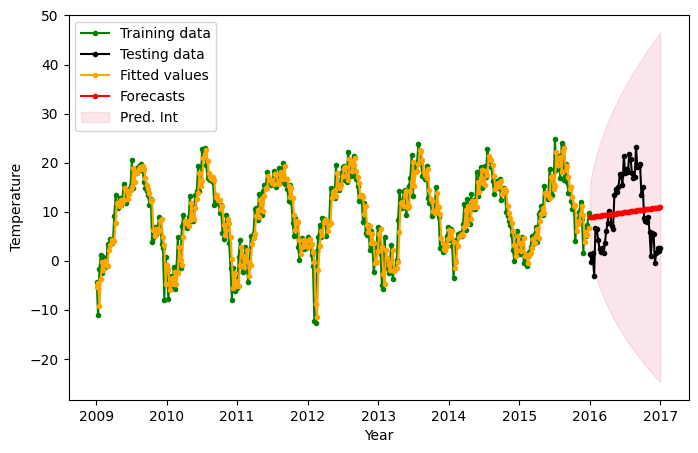

In [225]:
# Visualization
plt.figure(figsize=(8,5))
plt.plot(train_temp, color='green',marker = '.',label='Training data')
plt.plot(test_temp, color='black', marker = '.',label='Testing data')
plt.plot(model_DES.fittedvalues,color='orange', marker = '.', label='Fitted values')
plt.plot(forecasts, color='red', marker = '.', label='Forecasts')
plt.fill_between(df_DES.index, df_DES['pi_lower'], df_DES['pi_upper'], alpha=.1, color='crimson', label='Pred. Int')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.legend()
plt.show()

In [226]:
print('AIC:', model_DES.aic)

AIC: 1949.383951122871


This model isn't great either since it accounts for the trend, but not seasonality.

##### Damped Double Exponential Smoothing
The forecasts generated by Holt’s linear method display a constant trend (increasing or decreasing trend) indefinitely into the future. Empirical evidence indicates that these methods tend to over-forecast, especially for longer forecast horizons. Motivated by this observation, Gardner & McKenzie (1985) introduced a parameter that “dampens” the trend to a flat line in the future.

In [227]:
# Model - Damped
model_DES_D = ETSModel(train_temp, error = 'add', trend='add', damped_trend=True).fit()

# Forecasting in the future and prediction interval
pred = model_DES_D.get_prediction(start=test_temp.index[0], end=test_temp.index[-1])
df_DES_D = pred.summary_frame()
forecasts_damped = df_DES_D['mean']

# Model parameters with damping
tab = {'Param Name': model_DES_D.param_names, 'Values': model_DES_D.params}
tab = pd.DataFrame(tab)
print('Model Parameters - Damping')
display(tab)

# Model without Damping
model_nodamp = ETSModel(train_temp, error = 'add', trend='add').fit()

# Forecasting in the future and prediction interval
pred = model_nodamp.get_prediction(start=test_temp.index[0], end=test_temp.index[-1])
df = pred.summary_frame()
forecasts_nodamp = df['mean']

# Model parameters without damping
tab = {'Param Name': model_nodamp.param_names, 'Values': model_nodamp.params}
tab = pd.DataFrame(tab)
print('Model Parameters - No Damping')
display(tab)

Model Parameters - Damping


,Param Name,Values
0,smoothing_level,0.650649
1,smoothing_trend,0.031725
2,damping_trend,0.875621
3,initial_level,-8.385424
4,initial_trend,2.290015


Model Parameters - No Damping


,Param Name,Values
0,smoothing_level,0.716633
1,smoothing_trend,0.000072
2,initial_level,-5.465449
3,initial_trend,0.039185


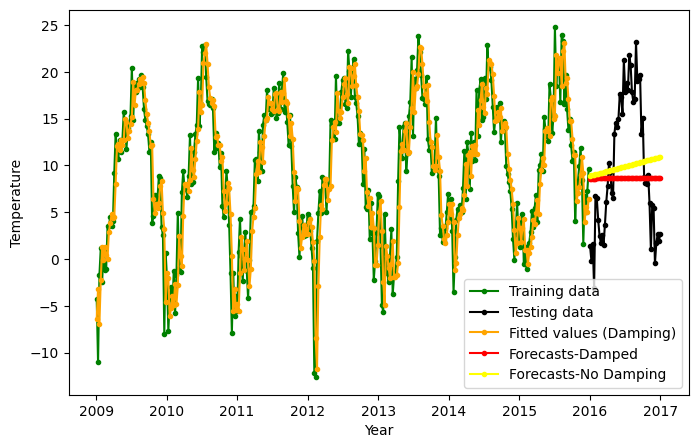

In [228]:
# Visualization
plt.figure(figsize=(8,5))
plt.plot(train_temp, color='green',marker = '.', label='Training data')
plt.plot(test_temp, color='black', marker = '.',label='Testing data')
plt.plot(model_DES_D.fittedvalues, color='orange',marker = '.', label='Fitted values (Damping)')
plt.plot(forecasts_damped, color='red', marker = '.',label='Forecasts-Damped')
plt.plot(forecasts_nodamp, color='yellow', marker = '.',label='Forecasts-No Damping')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.legend()
plt.show()

In [229]:
print('AIC:', model_DES_D.aic)

AIC: 1948.2738502678424


It still doesn't help much, but works a bit better than the simple Double Exponential Smoothing.

##### Triple Exponential Smoothing
It extends Holt’s method to capture seasonality, comprising the forecast equation and three smoothing equations (level, trend and seasonality).

In [230]:
# Model
model_TES = ETSModel(train_temp, error = 'add', trend='add', seasonal='add',seasonal_periods=52).fit()
# seasonal_periods --> The number of periods in a complete seasonal cycle for seasonal (Holt-Winters) models.
# For example, 4 for quarterly data with an annual cycle or 7 for daily data with a weekly cycle.

# Forecasting in the future and prediction interval
pred = model_TES.get_prediction(start=test_temp.index[0], end=test_temp.index[-1])
df_TES = pred.summary_frame()
forecasts = df_TES['mean']

# Model parameters
tab = {'Param Name': model_TES.param_names, 'Values': model_TES.params}
tab = pd.DataFrame(tab)
tab

,Param Name,Values
0,smoothing_level,0.292272
1,smoothing_trend,0.000029
2,smoothing_seasonal,0.000071
3,initial_level,-2.627101
4,initial_trend,0.028514
5,initial_seasonal.0,-0.211635
6,initial_seasonal.1,-3.038193
7,initial_seasonal.2,-1.658472
8,initial_seasonal.3,-1.827846
9,initial_seasonal.4,1.799601


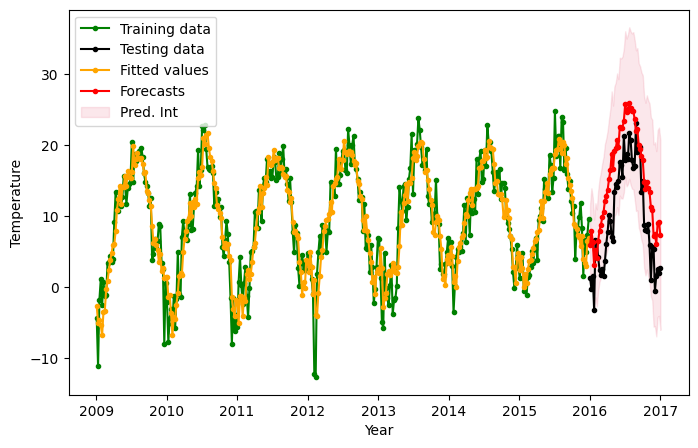

In [231]:
# Visualization
plt.figure(figsize=(8,5))
plt.plot(train_temp, color='green',marker = '.',label='Training data')
plt.plot(test_temp, color='black', marker = '.',label='Testing data')
plt.plot(model_TES.fittedvalues,color='orange', marker = '.', label='Fitted values')
plt.plot(forecasts, color='red', marker = '.', label='Forecasts')
plt.fill_between(df_TES.index, df_TES['pi_lower'], df_TES['pi_upper'], alpha=.1, color='crimson', label='Pred. Int')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.legend()
plt.show()

In [334]:
print('AIC:', model_TES.aic)

AIC: 1932.5828231167814


This seems to be the best working model for now.

##### Damped Triple Exponential Smoothing

In [232]:
# Model - Damped
model_TES_D = ETSModel(train_temp, error = 'add', trend='add', seasonal='add',seasonal_periods=52, damped_trend=True).fit()

# Forecasting in the future and prediction interval
pred = model_TES_D.get_prediction(start=test_temp.index[0], end=test_temp.index[-1])
df_TES_D = pred.summary_frame()
forecasts_damped = df_TES_D['mean']

# Model parameters with damping
tab = {'Param Name': model_TES_D.param_names, 'Values': model_TES_D.params}
tab = pd.DataFrame(tab)
print('Model Parameters - Damping')
display(tab)

# Model without Damping
model_nodamp = ETSModel(train_temp, error = 'add', trend='add', seasonal='add',seasonal_periods=52).fit()

# Forecasting in the future and prediction interval
pred = model_nodamp.get_prediction(start=test_temp.index[0], end=test_temp.index[-1])
df = pred.summary_frame()
forecasts_nodamp = df['mean']

# Model parameters without damping
tab = {'Param Name': model_nodamp.param_names, 'Values': model_nodamp.params}
tab = pd.DataFrame(tab)
print('Model Parameters - No Damping')
display(tab)

Model Parameters - Damping


,Param Name,Values
0,smoothing_level,0.214390
1,smoothing_trend,0.000021
2,smoothing_seasonal,0.000079
3,damping_trend,0.800000
4,initial_level,-8.550083
5,initial_trend,3.570539
6,initial_seasonal.0,-0.681705
7,initial_seasonal.1,-3.530830
8,initial_seasonal.2,-2.175061
9,initial_seasonal.3,-2.364964


Model Parameters - No Damping


,Param Name,Values
0,smoothing_level,0.292272
1,smoothing_trend,0.000029
2,smoothing_seasonal,0.000071
3,initial_level,-2.627101
4,initial_trend,0.028514
5,initial_seasonal.0,-0.211635
6,initial_seasonal.1,-3.038193
7,initial_seasonal.2,-1.658472
8,initial_seasonal.3,-1.827846
9,initial_seasonal.4,1.799601


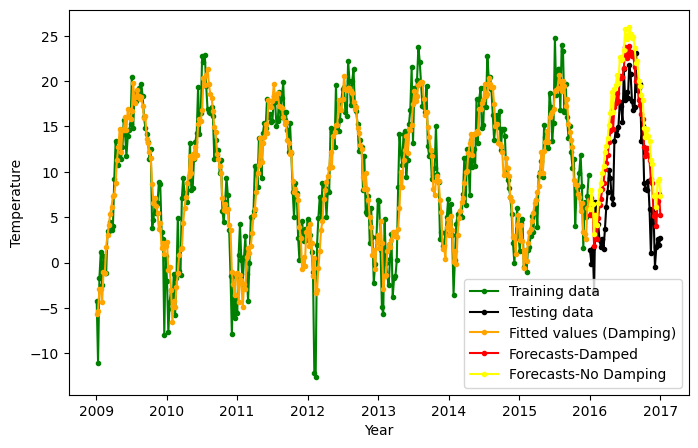

In [233]:
# Visualization
plt.figure(figsize=(8,5))
plt.plot(train_temp, color='green',marker = '.', label='Training data')
plt.plot(test_temp, color='black', marker = '.',label='Testing data')
plt.plot(model_TES_D.fittedvalues,color='orange',marker = '.', label='Fitted values (Damping)')
plt.plot(forecasts_damped, color='red', marker = '.',label='Forecasts-Damped')
plt.plot(forecasts_nodamp, color='yellow', marker = '.',label='Forecasts-No Damping')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.legend()
plt.show()

In [234]:
print('AIC:', model_TES_D.aic)

AIC: 1924.838848488752


By damping, the previous model works even better.

##### Performance

In [333]:
print('RMSE Seasonal Naive:', np.sqrt(mean_squared_error(test_temp, forecast_values_seas['mean'])))
print('MAE Seasonal Naive:', mean_absolute_error(test_temp, forecast_values_seas['mean']))

RMSE Seasonal Naive: 3.9221625594094465
MAE Seasonal Naive: 3.1314259732699528


In [235]:
models = [("SES", model_SES, df_SES),
    ("DES", model_DES, df_DES),
    ("DES D", model_DES_D, df_DES_D),
    ("TES", model_TES, df_TES),
    ("TES D", model_TES_D, df_TES_D)]

for model_name, model, df in models:
    print('-')
    #print(f'Training: {model_name}')
    #print(f'RMSE {model_name}:', root_mean_squared_error(train_temp, model.fittedvalues))
    #print(f'MAE {model_name}:', mean_absolute_error(train_temp, np.exp(model.fittedvalues)))
    #print(f'MAPE {model_name}:', 100 * mean_absolute_percentage_error(train_temp, model.fittedvalues))
    
    #print('Testing')
    print(f'AIC {model_name}:', model.aic)
    print(f'RMSE {model_name}:', root_mean_squared_error(test_temp, df['mean']))
    print(f'MAE {model_name}:', mean_absolute_error(test_temp, df['mean']))
    print(f'MAPE {model_name}:', 100 * mean_absolute_percentage_error(test_temp, df['mean']))

-
AIC SES: 1945.4389494754937
RMSE SES: 7.263912357522651
MAE SES: 6.306063323333453
MAPE SES: 242.94473306997037
-
AIC DES: 1949.383951122871
RMSE DES: 7.100957645133817
MAE DES: 6.359955124975851
MAPE DES: 265.36052091388905
-
AIC DES D: 1948.2738502678424
RMSE DES D: 7.279967781120812
MAE DES D: 6.287036747018594
MAPE DES D: 236.9761555750239
-
AIC TES: 1932.5828231167814
RMSE TES: 6.124195176998443
MAE TES: 5.627507114603047
MAPE TES: 230.90109104212675
-
AIC TES D: 1924.838848488752
RMSE TES D: 4.520757209099944
MAE TES D: 4.05709252170996
MAPE TES D: 182.1582706696262


The best model has the lowest AIC and errors, so it's the last one. Nonetheless, the Seasonal Naive Method has lower RMSE and MAE than all the other models, so it may also be a good choice.

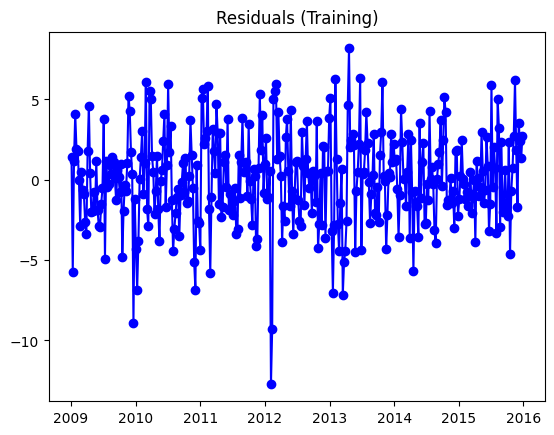

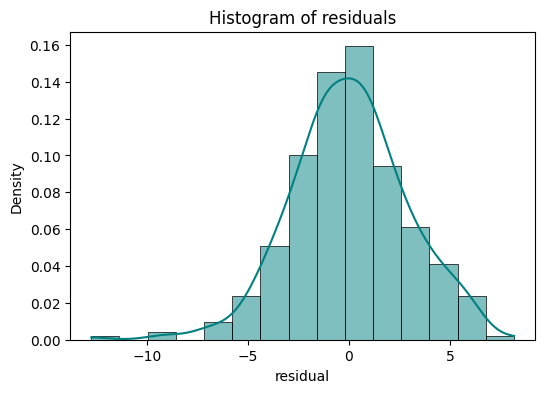

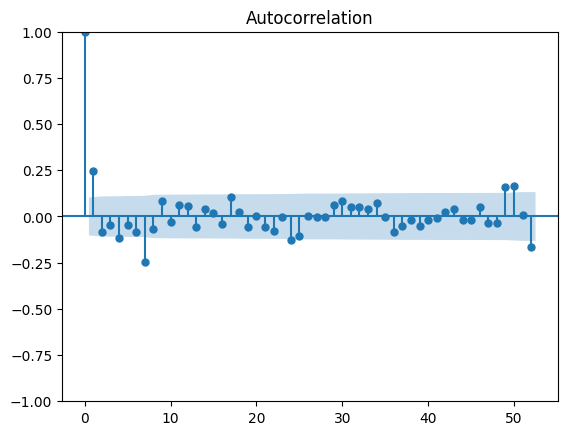

In [236]:
# Visualise the residuals for the best model (plot, histogram and ACF plot)
# Plot
plt.plot(model_TES_D.resid,'o-b')
plt.title('Residuals (Training)')

# Histogram of the residuals
fig, ax = plt.subplots(figsize=(6,4))
sns.histplot(x=model_TES_D.resid, stat='density', linewidth=0.5, kde=True,color='teal',bins=15)
ax.set(title='Histogram of residuals', xlabel='residual')

# ACF plot
plot_acf(model_TES_D.resid,lags=52)
plt.show()

#### AutoRegressive Integrated Moving Average Models
When dealing with the family of ARIMA models, it is important to remember the **Box-Jenkins methodology**. This refers to a systematic method of identifying, fitting, checking, and using ARIMA models built for time series forecasting.

**1.   Model Identification:** as first step, it is important to verify the stationarity, determine if our time series is seasonal and find the seasonal period, and eventually apply appropriate transformations to reduce the variance. When data have a strong seasonal pattern, seasonal differencing should be used as first step. Once stationarity and seasonality have been addressed, the next step is to identify the order (p,d,q) of ARIMA models in order to capture the salient dynamic features of the data. This is usually done by relying on ACF/PACF plots or on grid search;

**2.   Model estimation:**  Once the model order has been identified, the model parameter are estimated generally using maximum likelihood estimation. Appropriate criteria, such as AIC, AICc and BIC, have to be used to compare and select the best model;

**3.   Model diagnostic:** After fitting the model on the train data, conduct goodness-of-fit checks to ensure the model describes the data adequately. In particular the residuals are taken and it is assessed whether they are white noise and they are normally distributed. ACF plot of the residuals can help in this respect, along with statistical tests as the Ljung-Box test.

If the assumed model is appropriate for the data, the residuals should satisfy these assumptions. If they are not satisfied, we have to go back to the model identification step and try to develop a better model;

**4.   Forecasting:** If the model is good, we can finally perform the forecasting analyses in the separate test set, and perform all the performance evalutations (e.g., MAE, MSE/RMSE, MAPE, R2).


ARIMA models are capable of modelling a wide range of seasonal data, and thus can be extended to handle seasonal variations. These are generally written as **ARIMA(p,d,q)(P,D,Q)m** where the first part *(p,d,q)* refers to the *non-seasonal component*, while the second one *(P,D,Q)m* to the *seasonal component*. The term m refers to the seasonality (seasonal period, e.g., for annual data m = 12, quarterly data m = 4). This is also indicated as S (or s).

I can already say that d = 0 and D = 1 since I used seasonal differencing once. The missin values are p, q, P and Q.

##### ACF and PACF

PACF isolates the direct correlation between a data point and a specific lag, while controlling for the influence of other lags. It provides a more focused view of the relationship between a data point and its immediate past.

It is usually not possible to tell from a time plot what values of p and q are the most appropriate for the data at hand. However, ACF and the closely related PACF plots can often be useful to identify whether a time series is an AR or MA series, and the corresponding order.

For the **AR process**, we expect that the ACF plot will be exponentially decaying or sinusoidal, and simultaneously the PACF should have a sharp drop after *p significant lags* (thus significant spike at lag p in the PACF, but none beyond lag p).

Conversely, to define a **MA process** we expect the opposite pattern in the ACF and PACF plots, meaning that the ACF should show a sharp drop after a certain *q number of lags* (thus significant spike at lag q in the ACF, but none beyond lag q), while PACF is exponentially decaying or sinusoidal.

Finally, if both ACF and PACF plots demonstrate a gradual decreasing pattern, then the **ARMA process** should be considered for modeling.

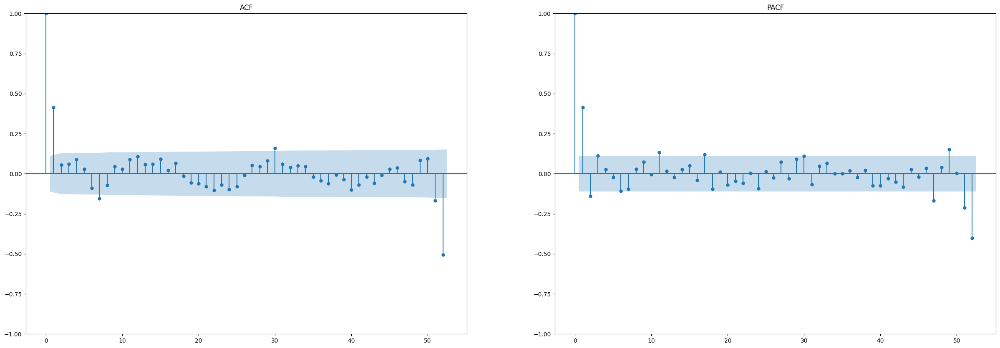

In [237]:
# ACF and PACF plot
fig, ax = plt.subplots(1, 2, figsize=(30,10))
plot_acf(train_temp_diff, lags=52, ax=ax[0], title='ACF')
plot_pacf(train_temp_diff, lags=52, ax=ax[1], title='PACF')
plt.show()

At this point, our aim is to find an appropriate SARIMA model based on these last ACF and PACF plots. We first look at the non-seasonal part, verifying the significant spikes occurring in the two plots before lag 52 and their behaviour.

With the ACF, the significant spike at lag 2 suggests a non-seasonal MA(2) component. Maybe, even MA(3) works. 

With the PACF, we may select a non-seasonal AR(2) or AR(3) component.

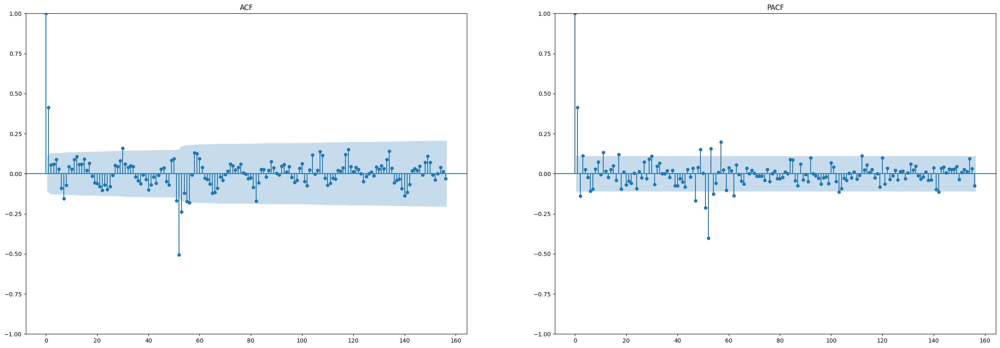

In [336]:
# ACF and PACF plot
fig, ax = plt.subplots(1, 2, figsize=(30,10))
plot_acf(train_temp_diff, lags=156, ax=ax[0], title='ACF')
plot_pacf(train_temp_diff, lags=156, ax=ax[1], title='PACF')
plt.show()

We then look at the seasonal part. In this case we have to verify the behaviour of the significant lags occurring at m and their multiples.

It seems the ACF and PACF plots have only one significant spike at lag 52. This suggests an MA(1) and AR(1) for the  seasonal part of the model.

##### Manual Sarima 1

In [350]:
# Fit the model with the selected parameters - Manual SARIMA model
[p,d,q]=[3,0,3]
[P,D,Q,S]=[1,1,1,52]
model_SARIMA_1 = SARIMAX(train_temp,
                       order=(p,d,q),
                       seasonal_order=(P,D,Q,S))
result_SARIMA_1 = model_SARIMA_1.fit()

# Verify the residuals
print(result_SARIMA_1.summary())

                                      SARIMAX Results                                       
Dep. Variable:                             T (degC)   No. Observations:                  365
Model:             SARIMAX(3, 0, 3)x(1, 1, [1], 52)   Log Likelihood                -817.528
Date:                              Fri, 31 Jan 2025   AIC                           1653.056
Time:                                      11:54:30   BIC                           1686.772
Sample:                                  01-04-2009   HQIC                          1666.530
                                       - 12-27-2015                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7381      0.104     -7.092      0.000      -0.942      -0.534
ar.L2         -0.60

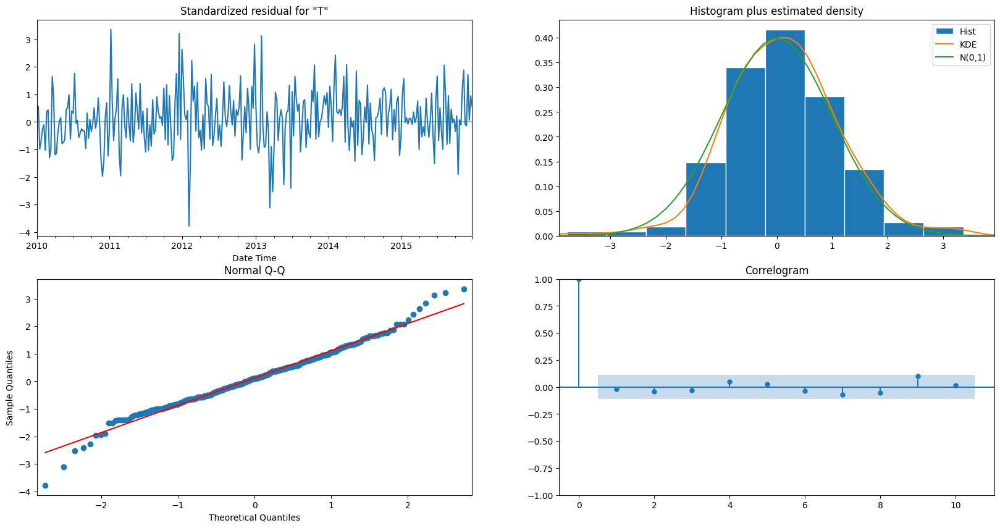

In [351]:
result_SARIMA_1.plot_diagnostics(figsize=(20,10))
plt.show()

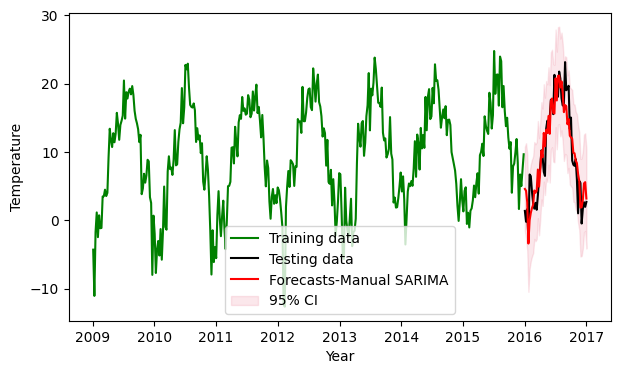

In [352]:
# Forecasting with Manual SARIMA model - Test set
forecasts = result_SARIMA_1.get_prediction(start=test_temp.index[0], end=test_temp.index[-1])
df_manual_1 = forecasts.summary_frame()

plt.figure(figsize=(7, 4))
plt.plot(train_temp, color='green',label='Training data')
plt.plot(test_temp, color='black', label='Testing data')
plt.plot(df_manual_1['mean'], color='red', label='Forecasts-Manual SARIMA')
plt.fill_between(df_manual_1.index, df_manual_1['mean_ci_lower'], df_manual_1['mean_ci_upper'], alpha=.1, color='crimson', label='95% CI')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.legend()
plt.show()

In [353]:
# Model performance
print('Manual SARIMA model')
print('MAE :', mean_absolute_error(test_temp,df_manual_1['mean']))
print('RMSE:', np.sqrt(mean_squared_error(test_temp,df_manual_1['mean'])))
print('MAPE :', 100*mean_absolute_percentage_error(test_temp,df_manual_1['mean']))

Manual SARIMA model
MAE : 2.359208712148248
RMSE: 2.988828950825404
MAPE : 101.13689885052959


[p,d,q]=[2,0,2]
- MAE : 2.378220617856429
- RMSE: 3.0199182694470657
- MAPE : 109.52958154069864

[p,d,q]=[3,0,3]
- MAE : 2.359208712148248
- RMSE: 2.988828950825404
- MAPE : 101.13689885052959

##### Manual Sarima 2

In [358]:
# Fit the model with the selected parameters - Manual SARIMA model
[p,d,q]=[3,0,2]
[P,D,Q,S]=[1,1,1,52]
model_SARIMA_2 = SARIMAX(train_temp,
                       order=(p,d,q),
                       seasonal_order=(P,D,Q,S))
result_SARIMA_2 = model_SARIMA_2.fit()

# Verify the residuals
print(result_SARIMA_2.summary())

                                      SARIMAX Results                                       
Dep. Variable:                             T (degC)   No. Observations:                  365
Model:             SARIMAX(3, 0, 2)x(1, 1, [1], 52)   Log Likelihood                -823.696
Date:                              Fri, 31 Jan 2025   AIC                           1663.392
Time:                                      12:04:45   BIC                           1693.362
Sample:                                  01-04-2009   HQIC                          1675.369
                                       - 12-27-2015                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7675      0.211      3.630      0.000       0.353       1.182
ar.L2          0.39

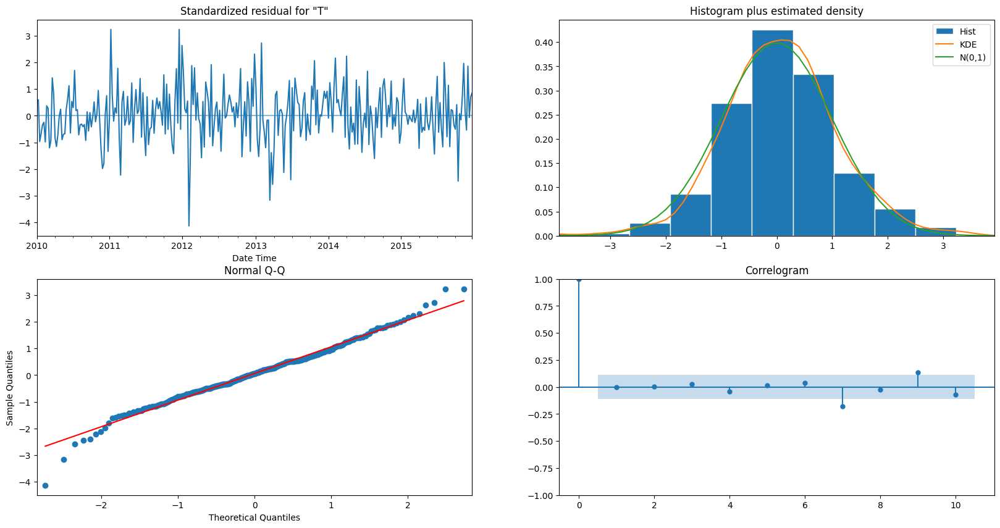

In [359]:
result_SARIMA_2.plot_diagnostics(figsize=(20,10))
plt.show()

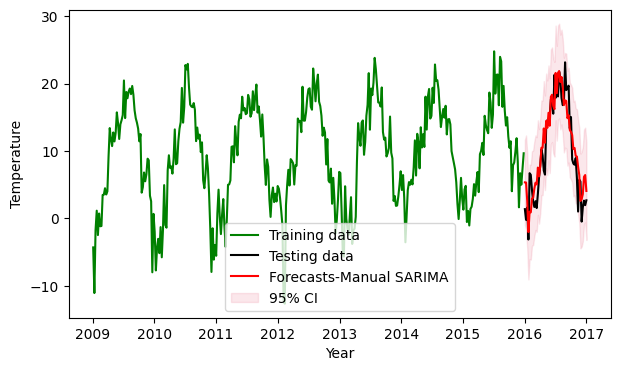

In [360]:
# Forecasting with Manual SARIMA model - Test set
forecasts = result_SARIMA_2.get_prediction(start=test_temp.index[0], end=test_temp.index[-1])
df_manual_2 = forecasts.summary_frame()

plt.figure(figsize=(7, 4))
plt.plot(train_temp, color='green',label='Training data')
plt.plot(test_temp, color='black', label='Testing data')
plt.plot(df_manual_2['mean'], color='red', label='Forecasts-Manual SARIMA')
plt.fill_between(df_manual_2.index, df_manual_2['mean_ci_lower'], df_manual_2['mean_ci_upper'], alpha=.1, color='crimson', label='95% CI')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.legend()
plt.show()

In [361]:
# Model performance
print('Manual SARIMA model')
print('MAE :', mean_absolute_error(test_temp,df_manual_2['mean']))
print('RMSE:', np.sqrt(mean_squared_error(test_temp,df_manual_2['mean'])))
print('MAPE :', 100*mean_absolute_percentage_error(test_temp,df_manual_2['mean']))

Manual SARIMA model
MAE : 2.490440055156029
RMSE: 3.1066683886329036
MAPE : 121.48065474698693


[p,d,q]=[3,0,2]
- MAE : 2.490440055156029
- RMSE: 3.1066683886329036
- MAPE : 121.48065474698693

[p,d,q]=[2,0,3]
- MAE : 2.5567220568358424
- RMSE: 3.1762871259279346
- MAPE : 115.4429482046734

##### Auto-Arima 1

DO NOT RUN AGAIN!

Performing stepwise search to minimize aicc
 ARIMA(0,0,0)(0,1,0)[52] intercept   : AICC=1834.484, Time=1.39 sec
 ARIMA(1,0,0)(1,1,0)[52] intercept   : AICC=1673.368, Time=28.30 sec
 ARIMA(0,0,1)(0,1,1)[52] intercept   : AICC=inf, Time=31.56 sec
 ARIMA(0,0,0)(0,1,0)[52]             : AICC=1833.663, Time=0.75 sec
 ARIMA(1,0,0)(0,1,0)[52] intercept   : AICC=1777.702, Time=12.18 sec
 ARIMA(1,0,0)(2,1,0)[52] intercept   : AICC=1666.960, Time=104.03 sec
 ARIMA(1,0,0)(3,1,0)[52] intercept   : AICC=inf, Time=196.52 sec
 ARIMA(1,0,0)(2,1,1)[52] intercept   : AICC=inf, Time=278.61 sec
 ARIMA(1,0,0)(1,1,1)[52] intercept   : AICC=1661.301, Time=34.81 sec
 ARIMA(1,0,0)(0,1,1)[52] intercept   : AICC=inf, Time=24.03 sec
 ARIMA(1,0,0)(1,1,2)[52] intercept   : AICC=inf, Time=143.42 sec
 ARIMA(1,0,0)(0,1,2)[52] intercept   : AICC=1662.220, Time=39.87 sec
 ARIMA(1,0,0)(2,1,2)[52] intercept   : AICC=inf, Time=271.63 sec
 ARIMA(0,0,0)(1,1,1)[52] intercept   : AICC=1715.415, Time=40.17 sec
 ARIMA(2,0,0)(1,1

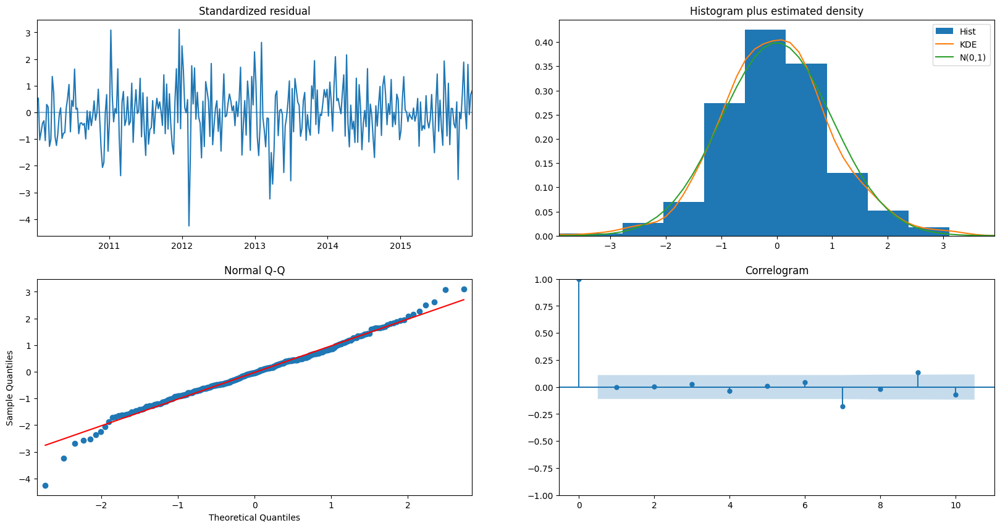

In [272]:
# stepwise_model = auto_arima(train_temp, start_p=0, start_q=0, d=0,
#                            max_p=5, max_q=5, m=52,
#                            start_P=0, start_Q=0,max_P = 5, max_Q = 5, D = 1, seasonal=True,
#                            trace=True, information_criterion='aicc',
#                            error_action='ignore',
#                            suppress_warnings=True,
#                            stepwise=True) # stepwise = False will search for more models, increasing the computational time

Best model:  ARIMA(2,0,1)(1,1,1)[52] intercept

                                     SARIMAX Results                                      
Dep. Variable:                           T (degC)   No. Observations:                  365
Model:             SARIMAX(2, 0, 1)x(1, 1, 1, 52)   Log Likelihood                -680.888
Date:                            Thu, 30 Jan 2025   AIC                           1373.776
Time:                                    11:33:37   BIC                           1395.117
Sample:                                01-04-2009   HQIC                          1382.357
                                     - 12-27-2015                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4415      0.099     -4.480      0.000      -0.635      -0.248
ar.L2          0.3149      0.072   

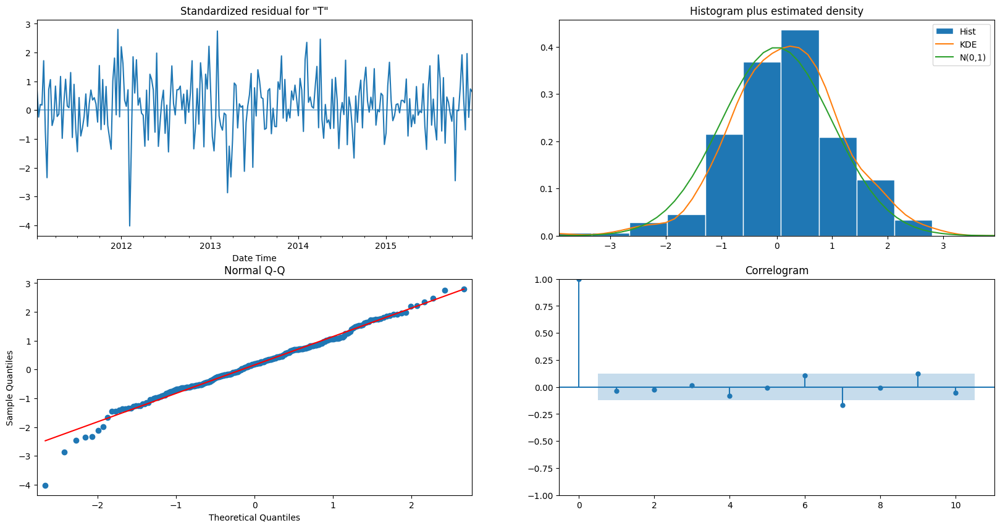

In [276]:
[p,d,q] = [2, 0, 1]
[P,D,Q,S] = [1, 1, 1]
model_SARIMA_auto = SARIMAX(train_temp,
                       order=(p,d,q),
                       seasonal_order=(P,D,Q,S),
                       enforce_stationarity=False,
                       enforce_invertibility=False)
result_SARIMA_auto = model_SARIMA_auto.fit()

# Verify the residuals
print(result_SARIMA_auto.summary())
result_SARIMA_auto.plot_diagnostics(figsize=(20, 10))
plt.show()

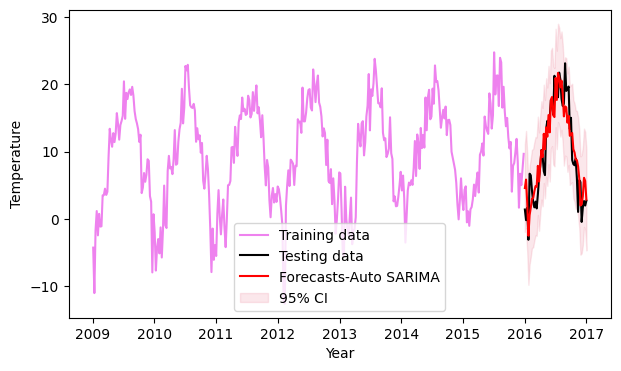

In [279]:
model_auto = result_SARIMA_auto.get_prediction(start=test_temp.index[0], end=test_temp.index[-1])
df_auto = model_auto.summary_frame()

plt.figure(figsize=(7, 4))
plt.plot(train_temp, color='violet',label='Training data')
plt.plot(test_temp, color='black', label='Testing data')
plt.plot(df_auto['mean'], color='red', label='Forecasts-Auto SARIMA')
plt.fill_between(df_auto.index, df_auto['mean_ci_lower'], df_auto['mean_ci_upper'], alpha=.1, color='crimson', label='95% CI')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.legend()
plt.show()

In [275]:
# Model performance
print('Auto SARIMA model')
print('MAE :', mean_absolute_error(test_temp,df_auto['mean']))
print('RMSE:', np.sqrt(mean_squared_error(test_temp,df_auto['mean'])))
print('MAPE :', 100*mean_absolute_percentage_error(test_temp,df_auto['mean']))

Auto SARIMA model
MAE : 2.452672710127007
RMSE: 3.1015189514762866
MAPE : 119.14264423436605


##### Auto-Arima 2

DO NOT RUN AGAIN!

In [ ]:
# stepwise_model = auto_arima(train_temp, start_p=0, start_q=0, d=None,
#                            max_p=5, max_q=5, m=52,
#                            start_P=0, start_Q=0,max_P = 5, max_Q = 5, D = None, seasonal=True,
#                            trace=True, information_criterion='aicc',
#                            error_action='ignore',
#                            suppress_warnings=True,
#                            stepwise=True) # stepwise = False will search for more models, increasing the computational time

Best model:  ARIMA(3,0,0)(2,0,0)[52] intercept

                                     SARIMAX Results                                      
Dep. Variable:                           T (degC)   No. Observations:                  365
Model:             SARIMAX(3, 0, 0)x(2, 0, 0, 52)   Log Likelihood                -672.847
Date:                            Thu, 30 Jan 2025   AIC                           1357.694
Time:                                    13:00:42   BIC                           1379.011
Sample:                                01-04-2009   HQIC                          1366.266
                                     - 12-27-2015                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7052      0.062     11.392      0.000       0.584       0.827
ar.L2          0.0185      0.074   

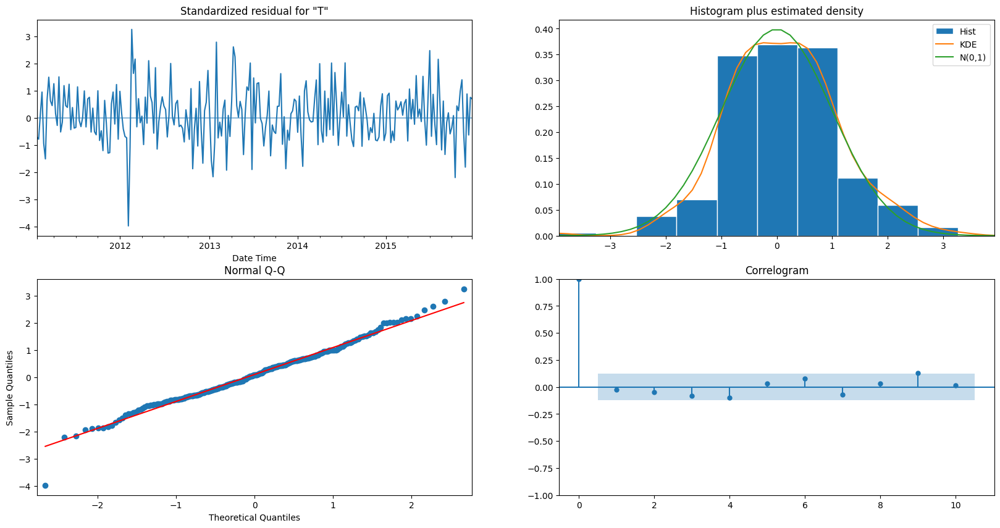

In [296]:
[p,d,q] = [3, 0, 0]
[P,D,Q,S] = [2, 0, 0, 52]
model_SARIMA_auto_2 = SARIMAX(train_temp,
                       order=(p,d,q),
                       seasonal_order=(P,D,Q,S),
                       enforce_stationarity=False,
                       enforce_invertibility=False)
result_SARIMA_auto_2 = model_SARIMA_auto_2.fit()

# Verify the residuals
print(result_SARIMA_auto_2.summary())
result_SARIMA_auto_2.plot_diagnostics(figsize=(20, 10))
plt.show()

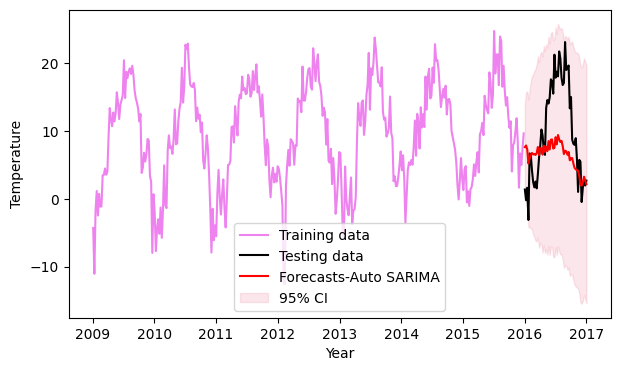

In [299]:
model_auto_2 = result_SARIMA_auto_2.get_prediction(start=test_temp.index[0], end=test_temp.index[-1])
df_auto_2 = model_auto_2.summary_frame()

plt.figure(figsize=(7, 4))
plt.plot(train_temp, color='violet',label='Training data')
plt.plot(test_temp, color='black', label='Testing data')
plt.plot(df_auto_2['mean'], color='red', label='Forecasts-Auto SARIMA')
plt.fill_between(df_auto_2.index, df_auto_2['mean_ci_lower'], df_auto_2['mean_ci_upper'], alpha=.1, color='crimson', label='95% CI')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.legend()
plt.show()

In [298]:
# Model performance
print('Auto SARIMA model 2')
print('MAE :', mean_absolute_error(test_temp,df_auto_2['mean']))
print('RMSE:', np.sqrt(mean_squared_error(test_temp,df_auto_2['mean'])))
print('MAPE :', 100*mean_absolute_percentage_error(test_temp,df_auto_2['mean']))

Auto SARIMA model
MAE : 5.826812419983142
RMSE: 7.18313561514454
MAPE : 164.04630055834087


##### Exogenous variables

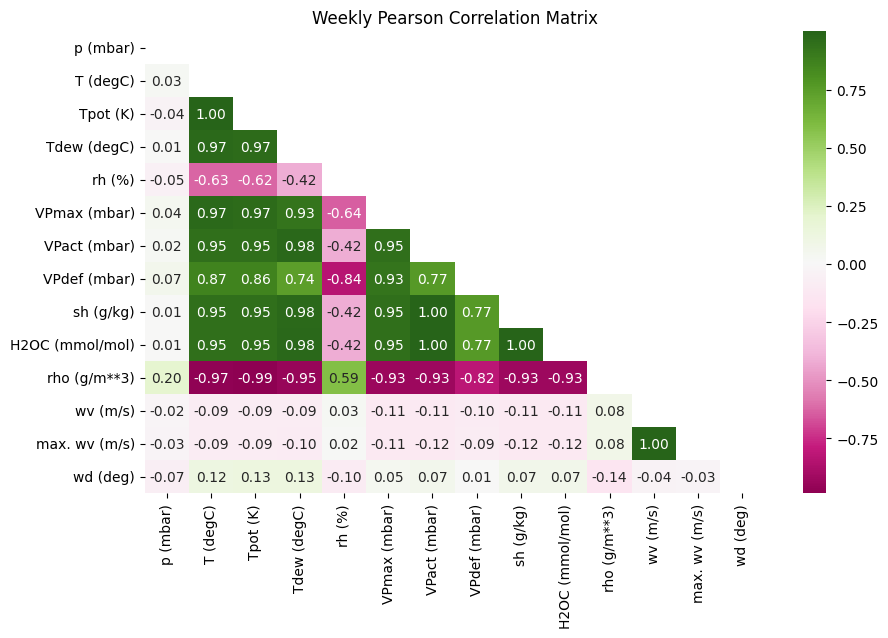

In [302]:
plt.figure(figsize=(10, 6))
pearson_corr = weather_df_weekly.corr(method='pearson') 
matrix = np.triu(pearson_corr)
sns.heatmap(pearson_corr, annot=True, cmap='PiYG', fmt=".2f", cbar=True,mask=matrix)
plt.title('Weekly Pearson Correlation Matrix')
plt.show()

I'm focusing on the column T (degC), which, we have seen in the Correlation plot, has an high correlation with the columns:
- (Tpot (K)),
- (Tdew (degC)),
- VPmax (mbar),
- VPact (mbar),
- VPdef (mbar),
- sh (g/kg),
- H2OC (mmol/mol),
- rho (g/m**3) - negative correlation.

I'm gonna ignore the other columns of Temperature. In that case, T (deg C) has highest correlation with VPmax (mbar) (97%) and rho (g/m**3) (-0.97).

In [307]:
train_exog = train[['VPmax (mbar)', 'rho (g/m**3)']]
test_exog = test[['VPmax (mbar)', 'rho (g/m**3)']]

In [ ]:
# Fit the model with the selected parameters - Manual SARIMA model
[p,d,q]=[3,0,1]
[P,D,Q,S]=[1,1,1,52]

In [322]:
model_SARIMA_exog = SARIMAX(train_temp,
                       order=(p,d,q),
                       seasonal_order=(P,D,Q,S),
                       exog=train_exog)
result_SARIMA_exog = model_SARIMA_exog.fit()

# Verify the residuals
print(result_SARIMA_exog.summary())

                                     SARIMAX Results                                      
Dep. Variable:                           T (degC)   No. Observations:                  365
Model:             SARIMAX(3, 0, 0)x(2, 0, 0, 52)   Log Likelihood                -644.106
Date:                            Thu, 30 Jan 2025   AIC                           1304.212
Time:                                    13:37:28   BIC                           1335.411
Sample:                                01-04-2009   HQIC                          1316.611
                                     - 12-27-2015                                         
Covariance Type:                              opg                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
VPmax (mbar)     1.0309      0.013     76.889      0.000       1.005       1.057
rho (g/m**3)    -0.0039      

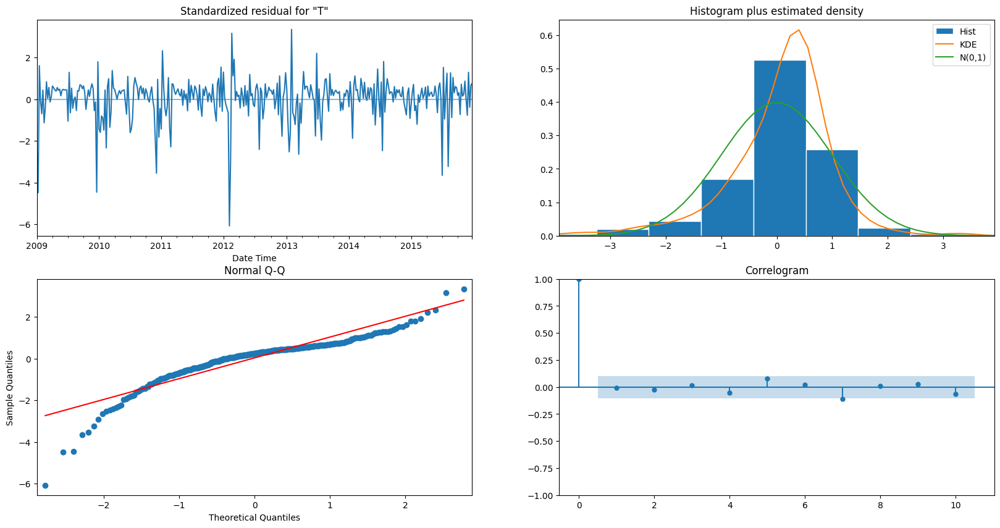

In [323]:
result_SARIMA_exog.plot_diagnostics(figsize=(20,10))
plt.show()

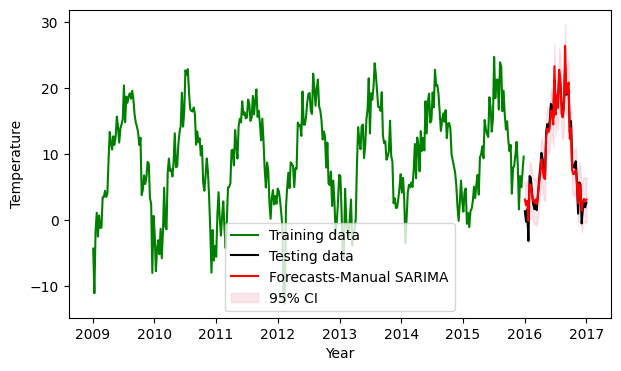

In [324]:
# Forecasting with Manual SARIMA model - Test set
forecasts = result_SARIMA_exog.get_prediction(start=test_temp.index[0], end=test_temp.index[-1], exog=test_exog)
df_exog = forecasts.summary_frame()

plt.figure(figsize=(7, 4))
plt.plot(train_temp, color='green',label='Training data')
plt.plot(test_temp, color='black', label='Testing data')
plt.plot(df_exog['mean'], color='red', label='Forecasts-Manual SARIMA')
plt.fill_between(df_exog.index, df_exog['mean_ci_lower'], df_exog['mean_ci_upper'], alpha=.1, color='crimson', label='95% CI')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.legend()
plt.show()

In [325]:
# Model performance
print('Sarimax Exog model')
print('MAE :', mean_absolute_error(test_temp,df_exog['mean']))
print('RMSE:', np.sqrt(mean_squared_error(test_temp,df_exog['mean'])))
print('MAPE :', 100*mean_absolute_percentage_error(test_temp,df_exog['mean']))

Auto SARIMA model
MAE : 1.0452083972089257
RMSE: 1.2311959659671254
MAPE : 51.691384760543734


##### Performance

In [365]:
models = [("Manual Sarima 1", df_manual_1, result_SARIMA_1),
    ("Manual Sarima 2", df_manual_2, result_SARIMA_2),
    ("Auto Sarima 1", df_auto, result_SARIMA_auto),
    ("Auto Sarima 2", df_auto_2, result_SARIMA_auto_2),
    ("Sarima Exog", df_exog, result_SARIMA_exog)]

for model_name, df, result in models:
    print('-')
    print(f'AIC {model_name}: {result.aic:.4f}')
    print(f'RMSE {model_name}:', root_mean_squared_error(test_temp, df['mean']))
    print(f'MAE {model_name}:', mean_absolute_error(test_temp, df['mean']))
    print(f'MAPE {model_name}:', 100 * mean_absolute_percentage_error(test_temp, df['mean']))

-
AIC Manual Sarima 1: 1653.0560
RMSE Manual Sarima 1: 2.988828950825404
MAE Manual Sarima 1: 2.359208712148248
MAPE Manual Sarima 1: 101.13689885052959
-
AIC Manual Sarima 2: 1663.3924
RMSE Manual Sarima 2: 3.1066683886329036
MAE Manual Sarima 2: 2.490440055156029
MAPE Manual Sarima 2: 121.48065474698693
-
AIC Auto Sarima 1: 1373.7763
RMSE Auto Sarima 1: 3.1015189514762866
MAE Auto Sarima 1: 2.452672710127007
MAPE Auto Sarima 1: 119.14264423436605
-
AIC Auto Sarima 2: 1357.6936
RMSE Auto Sarima 2: 7.18313561514454
MAE Auto Sarima 2: 5.826812419983142
MAPE Auto Sarima 2: 164.04630055834087
-
AIC Sarima Exog: 1304.2121
RMSE Sarima Exog: 1.2311959659671254
MAE Sarima Exog: 1.0452083972089257
MAPE Sarima Exog: 51.691384760543734
